In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc
import xgboost as xgb
import lightgbm as lgb
import optuna
from optuna.samplers import TPESampler
from autogluon.tabular import TabularDataset, TabularPredictor
import matplotlib.pylab as plt


## Data Processing

In [2]:
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")

X_train, X_val, y_train, y_val = train_test_split(train_data.drop(['label'], axis=1), train_data['label'], random_state=42, train_size=0.8)


ag_train = X_train.copy()
ag_train['label'] = y_train

## LGBMClassifier

In [3]:
def LGBM_objective(trial):
    param = {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 50, 250),
        'max_depth': trial.suggest_int('max_depth', 6, 15),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.03),
        'n_estimators': trial.suggest_int('n_estimators', 500, 3000),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
        'subsample': trial.suggest_float('subsample', 0.3, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 2.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 2.0),
        'random_state': 42,
        'early_stopping': 100,
        'verbose': -1
    }
    
    lgb_model = lgb.train(
        param, 
        lgb.Dataset(X_train, label=y_train), 
        valid_sets=[lgb.Dataset(X_val, label=y_val, reference=lgb.Dataset(X_train, label=y_train))], 
    )
    
    y_pred = lgb_model.predict(X_val)
    auc_score = roc_auc_score(y_val, y_pred)
    return auc_score

sampler = TPESampler(seed=42)

lgbm_study = optuna.create_study(direction='maximize', sampler=sampler)
lgbm_study.optimize(LGBM_objective, n_trials=200)

[I 2025-03-10 21:35:19,298] A new study created in memory with name: no-name-56d8b3d5-0547-4be1-a724-9e357bc80a85
/Users/jubinchoi/anaconda3/lib/python3.11/site-packages/lightgbm/engine.py:204: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2025-03-10 21:35:32,097] Trial 0 finished with value: 0.799386255703944 and parameters: {'num_leaves': 125, 'max_depth': 15, 'learning_rate': 0.0246398788362281, 'n_estimators': 1997, 'min_child_samples': 12, 'subsample': 0.40919616423534183, 'colsample_bytree': 0.3406585285177396, 'reg_alpha': 1.7323522915498704, 'reg_lambda': 1.2022300234864176}. Best is trial 0 with value: 0.799386255703944.
/Users/jubinchoi/anaconda3/lib/python3.11/site-packages/lightgbm/engine.py:204: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2025-03-10 2

In [4]:
print(lgbm_study.best_value)
print(lgbm_study.best_params)

0.8047528867426128
{'num_leaves': 189, 'max_depth': 14, 'learning_rate': 0.011970747911503524, 'n_estimators': 1253, 'min_child_samples': 13, 'subsample': 0.4675509736186637, 'colsample_bytree': 0.8839974860053773, 'reg_alpha': 0.6588762410125882, 'reg_lambda': 1.8038339364619203}


In [6]:
lgbm_best_params = lgbm_study.best_params

optimal_lgbm = lgb.LGBMClassifier(
    **lgbm_best_params, 
    objective='binary', 
    boosting_type='gbdt', 
    random_state=42, 
    metric='auc', 
    early_stopping=100
)

optimal_lgbm.fit(X_train, y_train, eval_set=[(X_val, y_val)], eval_metric='auc')

Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[676]	valid_0's auc: 0.804753


LGBMClassifier(colsample_bytree=0.8839974860053773, early_stopping=100,
               learning_rate=0.011970747911503524, max_depth=14, metric='auc',
               min_child_samples=13, n_estimators=1253, num_leaves=189,
               objective='binary', random_state=42,
               reg_alpha=0.6588762410125882, reg_lambda=1.8038339364619203,
               subsample=0.4675509736186637)

In [8]:
optimal_lgbm.best_score_

defaultdict(collections.OrderedDict,
            {'valid_0': OrderedDict([('auc', 0.8047528867426128)])})

In [15]:
y_val

33553    1.0
9427     1.0
199      0.0
12447    1.0
39489    0.0
        ... 
28567    1.0
25079    1.0
18707    1.0
15200    1.0
5857     1.0
Name: label, Length: 10000, dtype: float64

LightGBM AUROC: 0.8047528867426128


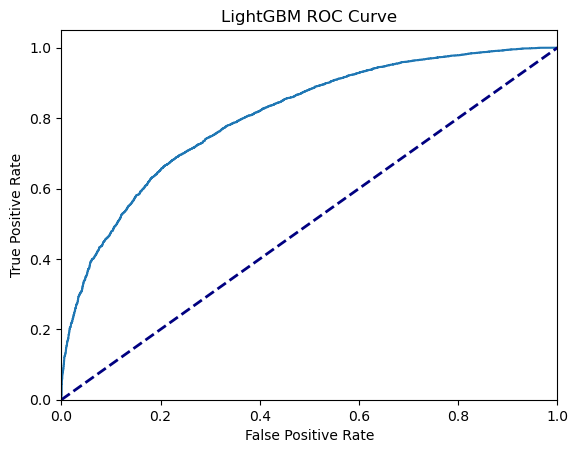

In [26]:
lgbm_y_pred = optimal_lgbm.predict_proba(X_val)[:, 1]

lgbm_fpr, lgbm_tpr, lgbm_thresholds = roc_curve(y_val, lgbm_y_pred)
lgbm_auroc = auc(lgbm_fpr, lgbm_tpr)
print(f"LightGBM AUROC: {lgbm_auroc}")

plt.plot(lgbm_fpr, lgbm_tpr)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

_ = plt.title('LightGBM ROC Curve')


In [27]:
lgbm_predictions = optimal_lgbm.predict_proba(test_data)[:, 1]
lgbm_predictions

array([0.08888182, 0.44390416, 0.77933346, ..., 0.9393923 , 0.2066077 ,
       0.09547697])

## XGBoost

In [31]:
X_train

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f19,f20,f21,f22,f23,f24,f25,f26,f27,label
39087,1.263312,0.372002,0.530864,0.691292,-0.993309,0.558071,1.426896,-0.444551,0.000000,1.070557,...,1.212876,0.000000,0.937922,1.092498,1.269335,1.112738,0.993789,1.002498,0.883633,1.0
30893,1.196513,0.484982,0.811069,0.505300,-0.269757,1.482480,2.205217,-0.969547,0.000000,0.517463,...,1.174587,3.101961,0.889122,0.939544,0.982312,0.798910,0.413939,0.867519,0.736455,0.0
45278,0.312763,-1.480487,-0.071818,0.786773,0.816098,1.403331,-0.041615,-0.304294,2.173076,1.132754,...,-1.232727,0.000000,1.428541,1.135667,0.978639,0.976034,2.026301,1.362483,1.108796,0.0
16398,0.568243,-0.645795,-1.277534,1.332976,-1.255128,1.073545,0.470334,0.458629,2.173076,0.393826,...,-0.015802,0.000000,0.858142,0.897248,0.981674,0.699101,0.507136,1.285813,1.062827,1.0
13653,0.455144,0.156755,1.071854,1.138029,0.069662,0.891796,-0.081224,0.499653,2.173076,1.079623,...,-1.519616,3.101961,1.438371,0.987772,0.985460,0.842070,1.065482,0.957223,0.966056,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11284,0.635774,-0.632160,-1.213171,1.720440,1.594704,1.499244,0.487168,-0.196191,0.000000,0.856521,...,0.658519,3.101961,4.014299,2.399923,0.979589,1.366260,0.445013,1.510934,1.450038,0.0
44732,0.840378,-0.237703,0.755583,1.197120,0.209230,0.846726,-0.213915,-0.955688,2.173076,0.361469,...,1.453153,3.101961,0.788351,0.726725,0.980557,0.790524,0.845466,0.836835,0.688291,0.0
38158,0.942314,-1.162973,0.892079,0.651937,1.670540,0.306609,-0.629812,-0.762211,0.000000,0.592628,...,1.303327,3.101961,0.537341,0.783763,0.987240,0.466987,0.518839,0.571998,0.576659,0.0
860,0.809632,-0.507492,0.384381,0.888394,1.316718,0.866696,-1.311090,-0.964558,0.000000,0.920480,...,1.420413,3.101961,0.886668,1.097824,0.990797,0.789673,0.888344,0.923380,0.864925,1.0


In [4]:
def XGBCobjective(trial):
    xgb_params = {
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
        'random_state': 42,
        'early_stopping_rounds': 200,
        'n_estimators': trial.suggest_int('n_estimators', 500, 3000),
        'max_depth': trial.suggest_int('max_depth', 5, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.03),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 3),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.1, 3),
        'gamma': trial.suggest_float('gamma', 0.01, 2),
        'subsample': trial.suggest_float('subsample', 0.4, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        
    }
    
    xgbc = xgb.XGBClassifier(**xgb_params, verbosity=0)
    
    xgbc.fit(X_train, y_train, eval_set=[(X_val, y_val)])
    
    y_pred = xgbc.predict_proba(X_val)[:, 1]
    auc_score = roc_auc_score(y_val, y_pred)
    return auc_score
    
sampler = TPESampler(seed=42)
optuna.logging.set_verbosity(optuna.logging.INFO)
xgb.set_config(verbosity=0)
xgbc_study = optuna.create_study(direction='maximize', sampler=sampler)
xgbc_study.optimize(XGBCobjective, n_trials=200)

[I 2025-03-10 23:16:56,530] A new study created in memory with name: no-name-613c9999-52bd-4daa-9b09-b0de5b11b0c8


[0]	validation_0-auc:0.72036
[1]	validation_0-auc:0.73588
[2]	validation_0-auc:0.75377
[3]	validation_0-auc:0.76041
[4]	validation_0-auc:0.76586
[5]	validation_0-auc:0.76719
[6]	validation_0-auc:0.76904
[7]	validation_0-auc:0.77031
[8]	validation_0-auc:0.77032
[9]	validation_0-auc:0.77205
[10]	validation_0-auc:0.77311
[11]	validation_0-auc:0.77313
[12]	validation_0-auc:0.77357
[13]	validation_0-auc:0.77532
[14]	validation_0-auc:0.77702
[15]	validation_0-auc:0.77745
[16]	validation_0-auc:0.77813
[17]	validation_0-auc:0.77835
[18]	validation_0-auc:0.77803
[19]	validation_0-auc:0.77907
[20]	validation_0-auc:0.77975
[21]	validation_0-auc:0.77959
[22]	validation_0-auc:0.78027
[23]	validation_0-auc:0.78096
[24]	validation_0-auc:0.78170
[25]	validation_0-auc:0.78245
[26]	validation_0-auc:0.78286
[27]	validation_0-auc:0.78361
[28]	validation_0-auc:0.78406
[29]	validation_0-auc:0.78370
[30]	validation_0-auc:0.78388
[31]	validation_0-auc:0.78402
[32]	validation_0-auc:0.78407
[33]	validation_0-au

[I 2025-03-10 23:17:05,383] Trial 0 finished with value: 0.8008942525816922 and parameters: {'n_estimators': 1436, 'max_depth': 12, 'learning_rate': 0.0246398788362281, 'reg_alpha': 1.7959754525911098, 'reg_lambda': 0.5524540572830658, 'gamma': 0.32042909546904325, 'subsample': 0.4348501673009197, 'min_child_weight': 9, 'colsample_bytree': 0.7207805082202461}. Best is trial 0 with value: 0.8008942525816922.


[0]	validation_0-auc:0.71412
[1]	validation_0-auc:0.73427
[2]	validation_0-auc:0.74235
[3]	validation_0-auc:0.74582
[4]	validation_0-auc:0.74510
[5]	validation_0-auc:0.74413
[6]	validation_0-auc:0.74426
[7]	validation_0-auc:0.74352
[8]	validation_0-auc:0.74321
[9]	validation_0-auc:0.74721
[10]	validation_0-auc:0.74668
[11]	validation_0-auc:0.74931
[12]	validation_0-auc:0.75031
[13]	validation_0-auc:0.75372
[14]	validation_0-auc:0.75643
[15]	validation_0-auc:0.75625
[16]	validation_0-auc:0.75712
[17]	validation_0-auc:0.75743
[18]	validation_0-auc:0.75705
[19]	validation_0-auc:0.75729
[20]	validation_0-auc:0.75692
[21]	validation_0-auc:0.75830
[22]	validation_0-auc:0.75881
[23]	validation_0-auc:0.75987
[24]	validation_0-auc:0.76043
[25]	validation_0-auc:0.76095
[26]	validation_0-auc:0.76158
[27]	validation_0-auc:0.76140
[28]	validation_0-auc:0.76213
[29]	validation_0-auc:0.76209
[30]	validation_0-auc:0.76257
[31]	validation_0-auc:0.76276
[32]	validation_0-auc:0.76366
[33]	validation_0-au

[I 2025-03-10 23:17:10,472] Trial 1 finished with value: 0.7985201406265274 and parameters: {'n_estimators': 2270, 'max_depth': 5, 'learning_rate': 0.029398197043239885, 'reg_alpha': 2.497327922401265, 'reg_lambda': 0.7157834209670009, 'gamma': 0.37183168474213024, 'subsample': 0.5100427059120604, 'min_child_weight': 4, 'colsample_bytree': 0.6673295021425665}. Best is trial 0 with value: 0.8008942525816922.


[0]	validation_0-auc:0.72764
[1]	validation_0-auc:0.73295
[2]	validation_0-auc:0.72632
[3]	validation_0-auc:0.74125
[4]	validation_0-auc:0.74640
[5]	validation_0-auc:0.75236
[6]	validation_0-auc:0.75987
[7]	validation_0-auc:0.76412
[8]	validation_0-auc:0.76207
[9]	validation_0-auc:0.76405
[10]	validation_0-auc:0.76364
[11]	validation_0-auc:0.76457
[12]	validation_0-auc:0.76406
[13]	validation_0-auc:0.76624
[14]	validation_0-auc:0.76680
[15]	validation_0-auc:0.76708
[16]	validation_0-auc:0.76761
[17]	validation_0-auc:0.76806
[18]	validation_0-auc:0.76896
[19]	validation_0-auc:0.76940
[20]	validation_0-auc:0.76939
[21]	validation_0-auc:0.76988
[22]	validation_0-auc:0.77101
[23]	validation_0-auc:0.77150
[24]	validation_0-auc:0.77163
[25]	validation_0-auc:0.77340
[26]	validation_0-auc:0.77466
[27]	validation_0-auc:0.77490
[28]	validation_0-auc:0.77477
[29]	validation_0-auc:0.77457
[30]	validation_0-auc:0.77471
[31]	validation_0-auc:0.77435
[32]	validation_0-auc:0.77507
[33]	validation_0-au

[I 2025-03-10 23:17:17,978] Trial 2 finished with value: 0.7990320690503664 and parameters: {'n_estimators': 1580, 'max_depth': 7, 'learning_rate': 0.022237057894447586, 'reg_alpha': 0.4184815819561255, 'reg_lambda': 0.9472194807521326, 'gamma': 0.7390600681544465, 'subsample': 0.6736419905302216, 'min_child_weight': 8, 'colsample_bytree': 0.4397716475108518}. Best is trial 0 with value: 0.8008942525816922.


[0]	validation_0-auc:0.74055
[1]	validation_0-auc:0.75544
[2]	validation_0-auc:0.76020
[3]	validation_0-auc:0.76162
[4]	validation_0-auc:0.76443
[5]	validation_0-auc:0.76699
[6]	validation_0-auc:0.76898
[7]	validation_0-auc:0.76984
[8]	validation_0-auc:0.77028
[9]	validation_0-auc:0.77117
[10]	validation_0-auc:0.77120
[11]	validation_0-auc:0.77112
[12]	validation_0-auc:0.77293
[13]	validation_0-auc:0.77353
[14]	validation_0-auc:0.77408
[15]	validation_0-auc:0.77475
[16]	validation_0-auc:0.77476
[17]	validation_0-auc:0.77489
[18]	validation_0-auc:0.77497
[19]	validation_0-auc:0.77523
[20]	validation_0-auc:0.77536
[21]	validation_0-auc:0.77527
[22]	validation_0-auc:0.77554
[23]	validation_0-auc:0.77700
[24]	validation_0-auc:0.77728
[25]	validation_0-auc:0.77728
[26]	validation_0-auc:0.77726
[27]	validation_0-auc:0.77720
[28]	validation_0-auc:0.77733
[29]	validation_0-auc:0.77752
[30]	validation_0-auc:0.77779
[31]	validation_0-auc:0.77812
[32]	validation_0-auc:0.77879
[33]	validation_0-au

[I 2025-03-10 23:17:30,520] Trial 3 finished with value: 0.8042650148416106 and parameters: {'n_estimators': 1786, 'max_depth': 9, 'learning_rate': 0.010929008254399955, 'reg_alpha': 1.822634555704315, 'reg_lambda': 0.5945199586931454, 'gamma': 0.13945267004070624, 'subsample': 0.9693313223519999, 'min_child_weight': 10, 'colsample_bytree': 0.8658781436815227}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.71323
[1]	validation_0-auc:0.72226
[2]	validation_0-auc:0.73413
[3]	validation_0-auc:0.73647
[4]	validation_0-auc:0.74549
[5]	validation_0-auc:0.74553
[6]	validation_0-auc:0.74746
[7]	validation_0-auc:0.75427
[8]	validation_0-auc:0.75027
[9]	validation_0-auc:0.74926
[10]	validation_0-auc:0.74929
[11]	validation_0-auc:0.75217
[12]	validation_0-auc:0.75340
[13]	validation_0-auc:0.75556
[14]	validation_0-auc:0.75923
[15]	validation_0-auc:0.75800
[16]	validation_0-auc:0.75691
[17]	validation_0-auc:0.75598
[18]	validation_0-auc:0.75589
[19]	validation_0-auc:0.75631
[20]	validation_0-auc:0.75762
[21]	validation_0-auc:0.75880
[22]	validation_0-auc:0.75977
[23]	validation_0-auc:0.76072
[24]	validation_0-auc:0.75966
[25]	validation_0-auc:0.76019
[26]	validation_0-auc:0.76013
[27]	validation_0-auc:0.76019
[28]	validation_0-auc:0.75988
[29]	validation_0-auc:0.75989
[30]	validation_0-auc:0.76041
[31]	validation_0-auc:0.76044
[32]	validation_0-auc:0.76152
[33]	validation_0-au

[I 2025-03-10 23:17:37,565] Trial 4 finished with value: 0.7950789944782756 and parameters: {'n_estimators': 1261, 'max_depth': 5, 'learning_rate': 0.023684660530243137, 'reg_alpha': 1.320457481218804, 'reg_lambda': 0.4539108810498586, 'gamma': 0.9954020511214277, 'subsample': 0.42063311266913106, 'min_child_weight': 10, 'colsample_bytree': 0.48114598712001183}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.74163
[1]	validation_0-auc:0.75113
[2]	validation_0-auc:0.75522
[3]	validation_0-auc:0.75615
[4]	validation_0-auc:0.75776
[5]	validation_0-auc:0.76138
[6]	validation_0-auc:0.76339
[7]	validation_0-auc:0.76514
[8]	validation_0-auc:0.76553
[9]	validation_0-auc:0.76612
[10]	validation_0-auc:0.76575
[11]	validation_0-auc:0.76595
[12]	validation_0-auc:0.76799
[13]	validation_0-auc:0.76813
[14]	validation_0-auc:0.76890
[15]	validation_0-auc:0.76928
[16]	validation_0-auc:0.76954
[17]	validation_0-auc:0.77025
[18]	validation_0-auc:0.77055
[19]	validation_0-auc:0.77122
[20]	validation_0-auc:0.77152
[21]	validation_0-auc:0.77172
[22]	validation_0-auc:0.77196
[23]	validation_0-auc:0.77308
[24]	validation_0-auc:0.77328
[25]	validation_0-auc:0.77333
[26]	validation_0-auc:0.77381
[27]	validation_0-auc:0.77429
[28]	validation_0-auc:0.77468
[29]	validation_0-auc:0.77514
[30]	validation_0-auc:0.77532
[31]	validation_0-auc:0.77569
[32]	validation_0-auc:0.77573
[33]	validation_0-au

[I 2025-03-10 23:17:44,894] Trial 5 finished with value: 0.8034699858863048 and parameters: {'n_estimators': 2156, 'max_depth': 7, 'learning_rate': 0.020401360423556215, 'reg_alpha': 1.640130838029839, 'reg_lambda': 0.6360779210240284, 'gamma': 1.9394734092514716, 'subsample': 0.8650796940166687, 'min_child_weight': 10, 'colsample_bytree': 0.9263791452993542}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.71650
[1]	validation_0-auc:0.74321
[2]	validation_0-auc:0.75125
[3]	validation_0-auc:0.75878
[4]	validation_0-auc:0.76404
[5]	validation_0-auc:0.76706
[6]	validation_0-auc:0.77096
[7]	validation_0-auc:0.77236
[8]	validation_0-auc:0.77284
[9]	validation_0-auc:0.77324
[10]	validation_0-auc:0.77415
[11]	validation_0-auc:0.77429
[12]	validation_0-auc:0.77597
[13]	validation_0-auc:0.77750
[14]	validation_0-auc:0.77825
[15]	validation_0-auc:0.77929
[16]	validation_0-auc:0.77979
[17]	validation_0-auc:0.78039
[18]	validation_0-auc:0.78048
[19]	validation_0-auc:0.78152
[20]	validation_0-auc:0.78211
[21]	validation_0-auc:0.78255
[22]	validation_0-auc:0.78302
[23]	validation_0-auc:0.78336
[24]	validation_0-auc:0.78385
[25]	validation_0-auc:0.78426
[26]	validation_0-auc:0.78454
[27]	validation_0-auc:0.78490
[28]	validation_0-auc:0.78536
[29]	validation_0-auc:0.78563
[30]	validation_0-auc:0.78604
[31]	validation_0-auc:0.78622
[32]	validation_0-auc:0.78648
[33]	validation_0-au

[I 2025-03-10 23:17:59,173] Trial 6 finished with value: 0.8035057797451381 and parameters: {'n_estimators': 1995, 'max_depth': 12, 'learning_rate': 0.01176985004103839, 'reg_alpha': 0.5879485872574356, 'reg_lambda': 0.23115913784056039, 'gamma': 0.6574073582188961, 'subsample': 0.6332063738136893, 'min_child_weight': 3, 'colsample_bytree': 0.8801162564063505}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.72937
[1]	validation_0-auc:0.73316
[2]	validation_0-auc:0.72465
[3]	validation_0-auc:0.74205
[4]	validation_0-auc:0.74803
[5]	validation_0-auc:0.75239
[6]	validation_0-auc:0.76127
[7]	validation_0-auc:0.76593
[8]	validation_0-auc:0.76342
[9]	validation_0-auc:0.76558
[10]	validation_0-auc:0.76525
[11]	validation_0-auc:0.76566
[12]	validation_0-auc:0.76508
[13]	validation_0-auc:0.76700
[14]	validation_0-auc:0.76768
[15]	validation_0-auc:0.76818
[16]	validation_0-auc:0.76841
[17]	validation_0-auc:0.76854
[18]	validation_0-auc:0.76938
[19]	validation_0-auc:0.77000
[20]	validation_0-auc:0.77023
[21]	validation_0-auc:0.77046
[22]	validation_0-auc:0.77120
[23]	validation_0-auc:0.77160
[24]	validation_0-auc:0.77151
[25]	validation_0-auc:0.77272
[26]	validation_0-auc:0.77362
[27]	validation_0-auc:0.77394
[28]	validation_0-auc:0.77377
[29]	validation_0-auc:0.77355
[30]	validation_0-auc:0.77351
[31]	validation_0-auc:0.77321
[32]	validation_0-auc:0.77400
[33]	validation_0-au

[I 2025-03-10 23:18:05,004] Trial 7 finished with value: 0.7992544965834523 and parameters: {'n_estimators': 1392, 'max_depth': 7, 'learning_rate': 0.02085392166316497, 'reg_alpha': 0.42277267492428794, 'reg_lambda': 2.426371244186715, 'gamma': 0.15835578092274394, 'subsample': 0.9921321619603104, 'min_child_weight': 8, 'colsample_bytree': 0.43910097707392065}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.73502
[1]	validation_0-auc:0.75377
[2]	validation_0-auc:0.76101
[3]	validation_0-auc:0.76720
[4]	validation_0-auc:0.77118
[5]	validation_0-auc:0.77331
[6]	validation_0-auc:0.77524
[7]	validation_0-auc:0.77659
[8]	validation_0-auc:0.77684
[9]	validation_0-auc:0.77804
[10]	validation_0-auc:0.77813
[11]	validation_0-auc:0.77812
[12]	validation_0-auc:0.77980
[13]	validation_0-auc:0.78077
[14]	validation_0-auc:0.78094
[15]	validation_0-auc:0.78121
[16]	validation_0-auc:0.78128
[17]	validation_0-auc:0.78201
[18]	validation_0-auc:0.78208
[19]	validation_0-auc:0.78283
[20]	validation_0-auc:0.78349
[21]	validation_0-auc:0.78363
[22]	validation_0-auc:0.78378
[23]	validation_0-auc:0.78461
[24]	validation_0-auc:0.78494
[25]	validation_0-auc:0.78484
[26]	validation_0-auc:0.78484
[27]	validation_0-auc:0.78508
[28]	validation_0-auc:0.78546
[29]	validation_0-auc:0.78578
[30]	validation_0-auc:0.78600
[31]	validation_0-auc:0.78631
[32]	validation_0-auc:0.78651
[33]	validation_0-au

[I 2025-03-10 23:18:13,395] Trial 8 finished with value: 0.8023566443915437 and parameters: {'n_estimators': 513, 'max_depth': 11, 'learning_rate': 0.02413714687695234, 'reg_alpha': 2.1870215041229617, 'reg_lambda': 2.3366840053892424, 'gamma': 0.1573488569508398, 'subsample': 0.6150794371265635, 'min_child_weight': 2, 'colsample_bytree': 0.9041723981129154}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.73099
[1]	validation_0-auc:0.74787
[2]	validation_0-auc:0.75610
[3]	validation_0-auc:0.76108
[4]	validation_0-auc:0.76168
[5]	validation_0-auc:0.76133
[6]	validation_0-auc:0.76252
[7]	validation_0-auc:0.76348
[8]	validation_0-auc:0.76217
[9]	validation_0-auc:0.76404
[10]	validation_0-auc:0.76222
[11]	validation_0-auc:0.76400
[12]	validation_0-auc:0.76504
[13]	validation_0-auc:0.76762
[14]	validation_0-auc:0.76974
[15]	validation_0-auc:0.76952
[16]	validation_0-auc:0.77053
[17]	validation_0-auc:0.77032
[18]	validation_0-auc:0.77014
[19]	validation_0-auc:0.77052
[20]	validation_0-auc:0.77011
[21]	validation_0-auc:0.77082
[22]	validation_0-auc:0.77185
[23]	validation_0-auc:0.77250
[24]	validation_0-auc:0.77234
[25]	validation_0-auc:0.77301
[26]	validation_0-auc:0.77317
[27]	validation_0-auc:0.77341
[28]	validation_0-auc:0.77368
[29]	validation_0-auc:0.77346
[30]	validation_0-auc:0.77378
[31]	validation_0-auc:0.77389
[32]	validation_0-auc:0.77436
[33]	validation_0-au

[I 2025-03-10 23:18:28,229] Trial 9 finished with value: 0.8022485806450887 and parameters: {'n_estimators': 2058, 'max_depth': 7, 'learning_rate': 0.011271167005720473, 'reg_alpha': 0.9329469651469866, 'reg_lambda': 1.0430316338775665, 'gamma': 1.4619162948927475, 'subsample': 0.7825344828131279, 'min_child_weight': 9, 'colsample_bytree': 0.6305504476133644}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.73366
[1]	validation_0-auc:0.75000
[2]	validation_0-auc:0.76495
[3]	validation_0-auc:0.77077
[4]	validation_0-auc:0.77144
[5]	validation_0-auc:0.77320
[6]	validation_0-auc:0.77473
[7]	validation_0-auc:0.77531
[8]	validation_0-auc:0.77457
[9]	validation_0-auc:0.77672
[10]	validation_0-auc:0.77756
[11]	validation_0-auc:0.77728
[12]	validation_0-auc:0.77845
[13]	validation_0-auc:0.77941
[14]	validation_0-auc:0.78010
[15]	validation_0-auc:0.78045
[16]	validation_0-auc:0.78065
[17]	validation_0-auc:0.78067
[18]	validation_0-auc:0.78045
[19]	validation_0-auc:0.78110
[20]	validation_0-auc:0.78152
[21]	validation_0-auc:0.78140
[22]	validation_0-auc:0.78236
[23]	validation_0-auc:0.78263
[24]	validation_0-auc:0.78325
[25]	validation_0-auc:0.78321
[26]	validation_0-auc:0.78335
[27]	validation_0-auc:0.78366
[28]	validation_0-auc:0.78352
[29]	validation_0-auc:0.78352
[30]	validation_0-auc:0.78403
[31]	validation_0-auc:0.78421
[32]	validation_0-auc:0.78448
[33]	validation_0-au

[I 2025-03-10 23:18:37,301] Trial 10 finished with value: 0.804208655565006 and parameters: {'n_estimators': 2863, 'max_depth': 10, 'learning_rate': 0.015108977509223746, 'reg_alpha': 2.7968710257353626, 'reg_lambda': 1.6055176094524963, 'gamma': 1.383591676402599, 'subsample': 0.9838501428924084, 'min_child_weight': 5, 'colsample_bytree': 0.7605735294797256}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.73465
[1]	validation_0-auc:0.75035
[2]	validation_0-auc:0.76477
[3]	validation_0-auc:0.77112
[4]	validation_0-auc:0.77157
[5]	validation_0-auc:0.77352
[6]	validation_0-auc:0.77506
[7]	validation_0-auc:0.77543
[8]	validation_0-auc:0.77445
[9]	validation_0-auc:0.77589
[10]	validation_0-auc:0.77712
[11]	validation_0-auc:0.77688
[12]	validation_0-auc:0.77783
[13]	validation_0-auc:0.77900
[14]	validation_0-auc:0.77977
[15]	validation_0-auc:0.78066
[16]	validation_0-auc:0.78058
[17]	validation_0-auc:0.78116
[18]	validation_0-auc:0.78091
[19]	validation_0-auc:0.78144
[20]	validation_0-auc:0.78190
[21]	validation_0-auc:0.78199
[22]	validation_0-auc:0.78271
[23]	validation_0-auc:0.78301
[24]	validation_0-auc:0.78383
[25]	validation_0-auc:0.78386
[26]	validation_0-auc:0.78403
[27]	validation_0-auc:0.78416
[28]	validation_0-auc:0.78413
[29]	validation_0-auc:0.78407
[30]	validation_0-auc:0.78429
[31]	validation_0-auc:0.78435
[32]	validation_0-auc:0.78457
[33]	validation_0-au

[I 2025-03-10 23:18:46,218] Trial 11 finished with value: 0.8038159664365961 and parameters: {'n_estimators': 2990, 'max_depth': 10, 'learning_rate': 0.014965599912085313, 'reg_alpha': 2.8864854125451798, 'reg_lambda': 1.7211624444124063, 'gamma': 1.4083714731884172, 'subsample': 0.9808798817647751, 'min_child_weight': 6, 'colsample_bytree': 0.7855219641811901}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.74565
[1]	validation_0-auc:0.75929
[2]	validation_0-auc:0.76429
[3]	validation_0-auc:0.76686
[4]	validation_0-auc:0.76731
[5]	validation_0-auc:0.76916
[6]	validation_0-auc:0.76970
[7]	validation_0-auc:0.76995
[8]	validation_0-auc:0.77053
[9]	validation_0-auc:0.77101
[10]	validation_0-auc:0.77076
[11]	validation_0-auc:0.77188
[12]	validation_0-auc:0.77367
[13]	validation_0-auc:0.77409
[14]	validation_0-auc:0.77426
[15]	validation_0-auc:0.77458
[16]	validation_0-auc:0.77470
[17]	validation_0-auc:0.77496
[18]	validation_0-auc:0.77552
[19]	validation_0-auc:0.77584
[20]	validation_0-auc:0.77617
[21]	validation_0-auc:0.77642
[22]	validation_0-auc:0.77691
[23]	validation_0-auc:0.77709
[24]	validation_0-auc:0.77742
[25]	validation_0-auc:0.77749
[26]	validation_0-auc:0.77822
[27]	validation_0-auc:0.77849
[28]	validation_0-auc:0.77865
[29]	validation_0-auc:0.77885
[30]	validation_0-auc:0.77898
[31]	validation_0-auc:0.77939
[32]	validation_0-auc:0.77980
[33]	validation_0-au

[I 2025-03-10 23:18:55,745] Trial 12 finished with value: 0.8038961013425265 and parameters: {'n_estimators': 2850, 'max_depth': 9, 'learning_rate': 0.015984434537095374, 'reg_alpha': 2.9910870890013106, 'reg_lambda': 1.459245134774743, 'gamma': 1.4207849497142704, 'subsample': 0.8631544074280428, 'min_child_weight': 6, 'colsample_bytree': 0.9939759270236392}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.74654
[1]	validation_0-auc:0.75334
[2]	validation_0-auc:0.76381
[3]	validation_0-auc:0.77051
[4]	validation_0-auc:0.77050
[5]	validation_0-auc:0.77236
[6]	validation_0-auc:0.77391
[7]	validation_0-auc:0.77571
[8]	validation_0-auc:0.77568
[9]	validation_0-auc:0.77646
[10]	validation_0-auc:0.77687
[11]	validation_0-auc:0.77738
[12]	validation_0-auc:0.77809
[13]	validation_0-auc:0.77846
[14]	validation_0-auc:0.77928
[15]	validation_0-auc:0.77951
[16]	validation_0-auc:0.77920
[17]	validation_0-auc:0.77919
[18]	validation_0-auc:0.77873
[19]	validation_0-auc:0.77912
[20]	validation_0-auc:0.77929
[21]	validation_0-auc:0.77933
[22]	validation_0-auc:0.77959
[23]	validation_0-auc:0.78074
[24]	validation_0-auc:0.78146
[25]	validation_0-auc:0.78150
[26]	validation_0-auc:0.78178
[27]	validation_0-auc:0.78189
[28]	validation_0-auc:0.78175
[29]	validation_0-auc:0.78178
[30]	validation_0-auc:0.78219
[31]	validation_0-auc:0.78235
[32]	validation_0-auc:0.78294
[33]	validation_0-au

[I 2025-03-10 23:19:09,524] Trial 13 finished with value: 0.8040831162294011 and parameters: {'n_estimators': 2585, 'max_depth': 9, 'learning_rate': 0.01571026286241493, 'reg_alpha': 2.1927339069102483, 'reg_lambda': 1.791253869051792, 'gamma': 1.7516507379933026, 'subsample': 0.9005573397288476, 'min_child_weight': 5, 'colsample_bytree': 0.7992584807715238}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.72894
[1]	validation_0-auc:0.73180
[2]	validation_0-auc:0.74818
[3]	validation_0-auc:0.75437
[4]	validation_0-auc:0.75905
[5]	validation_0-auc:0.76145
[6]	validation_0-auc:0.76358
[7]	validation_0-auc:0.76919
[8]	validation_0-auc:0.76692
[9]	validation_0-auc:0.77085
[10]	validation_0-auc:0.77103
[11]	validation_0-auc:0.77268
[12]	validation_0-auc:0.77289
[13]	validation_0-auc:0.77514
[14]	validation_0-auc:0.77662
[15]	validation_0-auc:0.77598
[16]	validation_0-auc:0.77679
[17]	validation_0-auc:0.77606
[18]	validation_0-auc:0.77611
[19]	validation_0-auc:0.77663
[20]	validation_0-auc:0.77633
[21]	validation_0-auc:0.77666
[22]	validation_0-auc:0.77798
[23]	validation_0-auc:0.77863
[24]	validation_0-auc:0.77849
[25]	validation_0-auc:0.77957
[26]	validation_0-auc:0.78005
[27]	validation_0-auc:0.78032
[28]	validation_0-auc:0.78067
[29]	validation_0-auc:0.78047
[30]	validation_0-auc:0.78040
[31]	validation_0-auc:0.78019
[32]	validation_0-auc:0.78032
[33]	validation_0-au

[I 2025-03-10 23:19:18,653] Trial 14 finished with value: 0.8031334553962772 and parameters: {'n_estimators': 893, 'max_depth': 10, 'learning_rate': 0.013404758950577737, 'reg_alpha': 2.4467292090258788, 'reg_lambda': 2.9822107093206967, 'gamma': 1.0669368203994058, 'subsample': 0.753547072510638, 'min_child_weight': 7, 'colsample_bytree': 0.5662896863726911}. Best is trial 3 with value: 0.8042650148416106.


[0]	validation_0-auc:0.73738
[1]	validation_0-auc:0.74513
[2]	validation_0-auc:0.76087
[3]	validation_0-auc:0.76792
[4]	validation_0-auc:0.76860
[5]	validation_0-auc:0.77111
[6]	validation_0-auc:0.77314
[7]	validation_0-auc:0.77463
[8]	validation_0-auc:0.77524
[9]	validation_0-auc:0.77640
[10]	validation_0-auc:0.77676
[11]	validation_0-auc:0.77718
[12]	validation_0-auc:0.77768
[13]	validation_0-auc:0.77796
[14]	validation_0-auc:0.77886
[15]	validation_0-auc:0.77944
[16]	validation_0-auc:0.77949
[17]	validation_0-auc:0.77942
[18]	validation_0-auc:0.77913
[19]	validation_0-auc:0.77980
[20]	validation_0-auc:0.78020
[21]	validation_0-auc:0.78038
[22]	validation_0-auc:0.78045
[23]	validation_0-auc:0.78164
[24]	validation_0-auc:0.78213
[25]	validation_0-auc:0.78228
[26]	validation_0-auc:0.78248
[27]	validation_0-auc:0.78289
[28]	validation_0-auc:0.78282
[29]	validation_0-auc:0.78279
[30]	validation_0-auc:0.78288
[31]	validation_0-auc:0.78306
[32]	validation_0-auc:0.78368
[33]	validation_0-au

[I 2025-03-10 23:19:41,305] Trial 15 finished with value: 0.8045428987793011 and parameters: {'n_estimators': 2559, 'max_depth': 10, 'learning_rate': 0.010040242935392511, 'reg_alpha': 1.180963459474919, 'reg_lambda': 1.3276915398832285, 'gamma': 1.0637566694359288, 'subsample': 0.9263877274836407, 'min_child_weight': 1, 'colsample_bytree': 0.8083241886080912}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.72748
[1]	validation_0-auc:0.73341
[2]	validation_0-auc:0.72117
[3]	validation_0-auc:0.71945
[4]	validation_0-auc:0.72510
[5]	validation_0-auc:0.72877
[6]	validation_0-auc:0.74161
[7]	validation_0-auc:0.74432
[8]	validation_0-auc:0.74455
[9]	validation_0-auc:0.73971
[10]	validation_0-auc:0.74753
[11]	validation_0-auc:0.74535
[12]	validation_0-auc:0.74028
[13]	validation_0-auc:0.74516
[14]	validation_0-auc:0.74054
[15]	validation_0-auc:0.74062
[16]	validation_0-auc:0.74544
[17]	validation_0-auc:0.74832
[18]	validation_0-auc:0.75312
[19]	validation_0-auc:0.75622
[20]	validation_0-auc:0.75365
[21]	validation_0-auc:0.75458
[22]	validation_0-auc:0.75861
[23]	validation_0-auc:0.75955
[24]	validation_0-auc:0.75790
[25]	validation_0-auc:0.75730
[26]	validation_0-auc:0.76021
[27]	validation_0-auc:0.76197
[28]	validation_0-auc:0.76308
[29]	validation_0-auc:0.76400
[30]	validation_0-auc:0.76379
[31]	validation_0-auc:0.76208
[32]	validation_0-auc:0.76383
[33]	validation_0-au

[I 2025-03-10 23:20:02,529] Trial 16 finished with value: 0.7979499869906177 and parameters: {'n_estimators': 2440, 'max_depth': 8, 'learning_rate': 0.01000853673062724, 'reg_alpha': 1.1993456280557466, 'reg_lambda': 1.2369092213377948, 'gamma': 0.75615715989208, 'subsample': 0.8006362592293905, 'min_child_weight': 1, 'colsample_bytree': 0.30922545006664626}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.72209
[1]	validation_0-auc:0.73243
[2]	validation_0-auc:0.75114
[3]	validation_0-auc:0.76039
[4]	validation_0-auc:0.76555
[5]	validation_0-auc:0.76826
[6]	validation_0-auc:0.77060
[7]	validation_0-auc:0.77282
[8]	validation_0-auc:0.77355
[9]	validation_0-auc:0.77544
[10]	validation_0-auc:0.77594
[11]	validation_0-auc:0.77711
[12]	validation_0-auc:0.77772
[13]	validation_0-auc:0.77885
[14]	validation_0-auc:0.77980
[15]	validation_0-auc:0.78030
[16]	validation_0-auc:0.78101
[17]	validation_0-auc:0.78102
[18]	validation_0-auc:0.78054
[19]	validation_0-auc:0.78145
[20]	validation_0-auc:0.78173
[21]	validation_0-auc:0.78225
[22]	validation_0-auc:0.78285
[23]	validation_0-auc:0.78360
[24]	validation_0-auc:0.78383
[25]	validation_0-auc:0.78410
[26]	validation_0-auc:0.78420
[27]	validation_0-auc:0.78433
[28]	validation_0-auc:0.78419
[29]	validation_0-auc:0.78422
[30]	validation_0-auc:0.78439
[31]	validation_0-auc:0.78462
[32]	validation_0-auc:0.78502
[33]	validation_0-au

[I 2025-03-10 23:20:16,328] Trial 17 finished with value: 0.803041884111684 and parameters: {'n_estimators': 1886, 'max_depth': 11, 'learning_rate': 0.018609041658072215, 'reg_alpha': 0.9182699726443447, 'reg_lambda': 0.21227088053247645, 'gamma': 1.0847890900260522, 'subsample': 0.9103075698135533, 'min_child_weight': 1, 'colsample_bytree': 0.8450643868508708}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.74072
[1]	validation_0-auc:0.75374
[2]	validation_0-auc:0.75925
[3]	validation_0-auc:0.76160
[4]	validation_0-auc:0.76256
[5]	validation_0-auc:0.76270
[6]	validation_0-auc:0.76330
[7]	validation_0-auc:0.76470
[8]	validation_0-auc:0.76524
[9]	validation_0-auc:0.76558
[10]	validation_0-auc:0.76597
[11]	validation_0-auc:0.76704
[12]	validation_0-auc:0.76920
[13]	validation_0-auc:0.76948
[14]	validation_0-auc:0.76999
[15]	validation_0-auc:0.77026
[16]	validation_0-auc:0.77102
[17]	validation_0-auc:0.77126
[18]	validation_0-auc:0.77150
[19]	validation_0-auc:0.77214
[20]	validation_0-auc:0.77249
[21]	validation_0-auc:0.77347
[22]	validation_0-auc:0.77364
[23]	validation_0-auc:0.77392
[24]	validation_0-auc:0.77424
[25]	validation_0-auc:0.77487
[26]	validation_0-auc:0.77528
[27]	validation_0-auc:0.77543
[28]	validation_0-auc:0.77545
[29]	validation_0-auc:0.77567
[30]	validation_0-auc:0.77615
[31]	validation_0-auc:0.77647
[32]	validation_0-auc:0.77674
[33]	validation_0-au

[I 2025-03-10 23:20:27,197] Trial 18 finished with value: 0.8042926025971575 and parameters: {'n_estimators': 1048, 'max_depth': 8, 'learning_rate': 0.01753991941532756, 'reg_alpha': 0.02124342053389139, 'reg_lambda': 1.297081668110026, 'gamma': 0.5525437944212558, 'subsample': 0.9242026213976311, 'min_child_weight': 3, 'colsample_bytree': 0.9733941906766914}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.73870
[1]	validation_0-auc:0.75531
[2]	validation_0-auc:0.76077
[3]	validation_0-auc:0.76348
[4]	validation_0-auc:0.76490
[5]	validation_0-auc:0.76715
[6]	validation_0-auc:0.76828
[7]	validation_0-auc:0.76886
[8]	validation_0-auc:0.76900
[9]	validation_0-auc:0.76929
[10]	validation_0-auc:0.76943
[11]	validation_0-auc:0.77004
[12]	validation_0-auc:0.77159
[13]	validation_0-auc:0.77185
[14]	validation_0-auc:0.77247
[15]	validation_0-auc:0.77296
[16]	validation_0-auc:0.77328
[17]	validation_0-auc:0.77346
[18]	validation_0-auc:0.77357
[19]	validation_0-auc:0.77418
[20]	validation_0-auc:0.77511
[21]	validation_0-auc:0.77539
[22]	validation_0-auc:0.77565
[23]	validation_0-auc:0.77574
[24]	validation_0-auc:0.77587
[25]	validation_0-auc:0.77605
[26]	validation_0-auc:0.77647
[27]	validation_0-auc:0.77664
[28]	validation_0-auc:0.77706
[29]	validation_0-auc:0.77738
[30]	validation_0-auc:0.77766
[31]	validation_0-auc:0.77811
[32]	validation_0-auc:0.77815
[33]	validation_0-au

[I 2025-03-10 23:20:37,422] Trial 19 finished with value: 0.8040381732676375 and parameters: {'n_estimators': 1025, 'max_depth': 8, 'learning_rate': 0.018019324753044987, 'reg_alpha': 0.12960254862294307, 'reg_lambda': 2.2015315644233353, 'gamma': 0.5084546634616661, 'subsample': 0.7255463923276217, 'min_child_weight': 3, 'colsample_bytree': 0.9927944180207487}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.73611
[1]	validation_0-auc:0.74228
[2]	validation_0-auc:0.74651
[3]	validation_0-auc:0.74792
[4]	validation_0-auc:0.74863
[5]	validation_0-auc:0.75212
[6]	validation_0-auc:0.75479
[7]	validation_0-auc:0.75531
[8]	validation_0-auc:0.75503
[9]	validation_0-auc:0.75571
[10]	validation_0-auc:0.75673
[11]	validation_0-auc:0.75791
[12]	validation_0-auc:0.76087
[13]	validation_0-auc:0.76066
[14]	validation_0-auc:0.76156
[15]	validation_0-auc:0.76169
[16]	validation_0-auc:0.76201
[17]	validation_0-auc:0.76189
[18]	validation_0-auc:0.76200
[19]	validation_0-auc:0.76277
[20]	validation_0-auc:0.76328
[21]	validation_0-auc:0.76406
[22]	validation_0-auc:0.76418
[23]	validation_0-auc:0.76585
[24]	validation_0-auc:0.76649
[25]	validation_0-auc:0.76688
[26]	validation_0-auc:0.76752
[27]	validation_0-auc:0.76785
[28]	validation_0-auc:0.76842
[29]	validation_0-auc:0.76901
[30]	validation_0-auc:0.76943
[31]	validation_0-auc:0.77038
[32]	validation_0-auc:0.77059
[33]	validation_0-au

[I 2025-03-10 23:20:41,756] Trial 20 finished with value: 0.8013935006698909 and parameters: {'n_estimators': 605, 'max_depth': 6, 'learning_rate': 0.027185888041257704, 'reg_alpha': 0.009438237883657961, 'reg_lambda': 2.0221567330609362, 'gamma': 0.823912131429944, 'subsample': 0.8317245854560257, 'min_child_weight': 2, 'colsample_bytree': 0.9362748825408931}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.74219
[1]	validation_0-auc:0.74867
[2]	validation_0-auc:0.75913
[3]	validation_0-auc:0.76669
[4]	validation_0-auc:0.76837
[5]	validation_0-auc:0.77066
[6]	validation_0-auc:0.77259
[7]	validation_0-auc:0.77369
[8]	validation_0-auc:0.77395
[9]	validation_0-auc:0.77448
[10]	validation_0-auc:0.77446
[11]	validation_0-auc:0.77469
[12]	validation_0-auc:0.77577
[13]	validation_0-auc:0.77616
[14]	validation_0-auc:0.77709
[15]	validation_0-auc:0.77784
[16]	validation_0-auc:0.77791
[17]	validation_0-auc:0.77764
[18]	validation_0-auc:0.77760
[19]	validation_0-auc:0.77821
[20]	validation_0-auc:0.77855
[21]	validation_0-auc:0.77867
[22]	validation_0-auc:0.77893
[23]	validation_0-auc:0.77998
[24]	validation_0-auc:0.78037
[25]	validation_0-auc:0.78026
[26]	validation_0-auc:0.78028
[27]	validation_0-auc:0.78023
[28]	validation_0-auc:0.78035
[29]	validation_0-auc:0.78059
[30]	validation_0-auc:0.78064
[31]	validation_0-auc:0.78087
[32]	validation_0-auc:0.78137
[33]	validation_0-au

[I 2025-03-10 23:20:56,186] Trial 21 finished with value: 0.8041716779406621 and parameters: {'n_estimators': 1103, 'max_depth': 9, 'learning_rate': 0.013194383403238284, 'reg_alpha': 1.9061061016024483, 'reg_lambda': 1.2876666228948794, 'gamma': 0.09022353417999057, 'subsample': 0.9292036859094746, 'min_child_weight': 2, 'colsample_bytree': 0.832838824690187}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.74163
[1]	validation_0-auc:0.75452
[2]	validation_0-auc:0.75975
[3]	validation_0-auc:0.76214
[4]	validation_0-auc:0.76328
[5]	validation_0-auc:0.76523
[6]	validation_0-auc:0.76760
[7]	validation_0-auc:0.76851
[8]	validation_0-auc:0.76864
[9]	validation_0-auc:0.76860
[10]	validation_0-auc:0.76873
[11]	validation_0-auc:0.76894
[12]	validation_0-auc:0.77107
[13]	validation_0-auc:0.77144
[14]	validation_0-auc:0.77145
[15]	validation_0-auc:0.77151
[16]	validation_0-auc:0.77139
[17]	validation_0-auc:0.77148
[18]	validation_0-auc:0.77181
[19]	validation_0-auc:0.77214
[20]	validation_0-auc:0.77232
[21]	validation_0-auc:0.77272
[22]	validation_0-auc:0.77261
[23]	validation_0-auc:0.77390
[24]	validation_0-auc:0.77420
[25]	validation_0-auc:0.77425
[26]	validation_0-auc:0.77426
[27]	validation_0-auc:0.77434
[28]	validation_0-auc:0.77437
[29]	validation_0-auc:0.77487
[30]	validation_0-auc:0.77494
[31]	validation_0-auc:0.77508
[32]	validation_0-auc:0.77530
[33]	validation_0-au

[I 2025-03-10 23:21:11,999] Trial 22 finished with value: 0.8042141731161154 and parameters: {'n_estimators': 1732, 'max_depth': 8, 'learning_rate': 0.01276986267827308, 'reg_alpha': 1.4151352781391322, 'reg_lambda': 0.9143990656181858, 'gamma': 0.4835622056261246, 'subsample': 0.9313807414117431, 'min_child_weight': 4, 'colsample_bytree': 0.9352706122630534}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.72579
[1]	validation_0-auc:0.74317
[2]	validation_0-auc:0.76269
[3]	validation_0-auc:0.76985
[4]	validation_0-auc:0.77159
[5]	validation_0-auc:0.77122
[6]	validation_0-auc:0.77209
[7]	validation_0-auc:0.77311
[8]	validation_0-auc:0.77282
[9]	validation_0-auc:0.77457
[10]	validation_0-auc:0.77614
[11]	validation_0-auc:0.77775
[12]	validation_0-auc:0.77861
[13]	validation_0-auc:0.77975
[14]	validation_0-auc:0.78061
[15]	validation_0-auc:0.78078
[16]	validation_0-auc:0.78156
[17]	validation_0-auc:0.78191
[18]	validation_0-auc:0.78180
[19]	validation_0-auc:0.78245
[20]	validation_0-auc:0.78244
[21]	validation_0-auc:0.78247
[22]	validation_0-auc:0.78323
[23]	validation_0-auc:0.78336
[24]	validation_0-auc:0.78410
[25]	validation_0-auc:0.78473
[26]	validation_0-auc:0.78522
[27]	validation_0-auc:0.78553
[28]	validation_0-auc:0.78559
[29]	validation_0-auc:0.78546
[30]	validation_0-auc:0.78622
[31]	validation_0-auc:0.78667
[32]	validation_0-auc:0.78693
[33]	validation_0-au

[I 2025-03-10 23:21:22,046] Trial 23 finished with value: 0.803668015811576 and parameters: {'n_estimators': 780, 'max_depth': 11, 'learning_rate': 0.01747649971150274, 'reg_alpha': 1.0493659434582248, 'reg_lambda': 1.2415301560539014, 'gamma': 1.2007690002284015, 'subsample': 0.9416354145551943, 'min_child_weight': 1, 'colsample_bytree': 0.7106035651849635}. Best is trial 15 with value: 0.8045428987793011.


[0]	validation_0-auc:0.74272
[1]	validation_0-auc:0.75181
[2]	validation_0-auc:0.76153
[3]	validation_0-auc:0.76852
[4]	validation_0-auc:0.76911
[5]	validation_0-auc:0.77183
[6]	validation_0-auc:0.77309
[7]	validation_0-auc:0.77464
[8]	validation_0-auc:0.77450
[9]	validation_0-auc:0.77476
[10]	validation_0-auc:0.77482
[11]	validation_0-auc:0.77492
[12]	validation_0-auc:0.77587
[13]	validation_0-auc:0.77624
[14]	validation_0-auc:0.77653
[15]	validation_0-auc:0.77683
[16]	validation_0-auc:0.77669
[17]	validation_0-auc:0.77728
[18]	validation_0-auc:0.77712
[19]	validation_0-auc:0.77728
[20]	validation_0-auc:0.77776
[21]	validation_0-auc:0.77777
[22]	validation_0-auc:0.77806
[23]	validation_0-auc:0.77906
[24]	validation_0-auc:0.77938
[25]	validation_0-auc:0.77955
[26]	validation_0-auc:0.77983
[27]	validation_0-auc:0.77985
[28]	validation_0-auc:0.78006
[29]	validation_0-auc:0.78021
[30]	validation_0-auc:0.78050
[31]	validation_0-auc:0.78048
[32]	validation_0-auc:0.78087
[33]	validation_0-au

[I 2025-03-10 23:21:46,590] Trial 24 finished with value: 0.8054503453304824 and parameters: {'n_estimators': 2622, 'max_depth': 9, 'learning_rate': 0.010203366378370245, 'reg_alpha': 1.6049239228884407, 'reg_lambda': 1.4347330666596902, 'gamma': 0.8923074596421934, 'subsample': 0.8578402193957957, 'min_child_weight': 3, 'colsample_bytree': 0.855475668891379}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74109
[1]	validation_0-auc:0.75572
[2]	validation_0-auc:0.76509
[3]	validation_0-auc:0.76940
[4]	validation_0-auc:0.77176
[5]	validation_0-auc:0.77301
[6]	validation_0-auc:0.77413
[7]	validation_0-auc:0.77481
[8]	validation_0-auc:0.77537
[9]	validation_0-auc:0.77548
[10]	validation_0-auc:0.77529
[11]	validation_0-auc:0.77513
[12]	validation_0-auc:0.77692
[13]	validation_0-auc:0.77735
[14]	validation_0-auc:0.77773
[15]	validation_0-auc:0.77822
[16]	validation_0-auc:0.77801
[17]	validation_0-auc:0.77827
[18]	validation_0-auc:0.77841
[19]	validation_0-auc:0.77881
[20]	validation_0-auc:0.77919
[21]	validation_0-auc:0.77933
[22]	validation_0-auc:0.78010
[23]	validation_0-auc:0.78029
[24]	validation_0-auc:0.78059
[25]	validation_0-auc:0.78073
[26]	validation_0-auc:0.78098
[27]	validation_0-auc:0.78119
[28]	validation_0-auc:0.78136
[29]	validation_0-auc:0.78151
[30]	validation_0-auc:0.78179
[31]	validation_0-auc:0.78202
[32]	validation_0-auc:0.78226
[33]	validation_0-au

[I 2025-03-10 23:21:59,079] Trial 25 finished with value: 0.8052019552114493 and parameters: {'n_estimators': 2591, 'max_depth': 10, 'learning_rate': 0.013952397087246937, 'reg_alpha': 1.5135924436449961, 'reg_lambda': 1.8700796200720093, 'gamma': 0.9612738901875255, 'subsample': 0.8596610051500848, 'min_child_weight': 3, 'colsample_bytree': 0.9954601714909692}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74376
[1]	validation_0-auc:0.75337
[2]	validation_0-auc:0.76571
[3]	validation_0-auc:0.77236
[4]	validation_0-auc:0.77285
[5]	validation_0-auc:0.77485
[6]	validation_0-auc:0.77541
[7]	validation_0-auc:0.77712
[8]	validation_0-auc:0.77729
[9]	validation_0-auc:0.77708
[10]	validation_0-auc:0.77736
[11]	validation_0-auc:0.77744
[12]	validation_0-auc:0.77849
[13]	validation_0-auc:0.77891
[14]	validation_0-auc:0.77926
[15]	validation_0-auc:0.77988
[16]	validation_0-auc:0.78013
[17]	validation_0-auc:0.78062
[18]	validation_0-auc:0.78018
[19]	validation_0-auc:0.78054
[20]	validation_0-auc:0.78085
[21]	validation_0-auc:0.78095
[22]	validation_0-auc:0.78115
[23]	validation_0-auc:0.78199
[24]	validation_0-auc:0.78210
[25]	validation_0-auc:0.78228
[26]	validation_0-auc:0.78247
[27]	validation_0-auc:0.78254
[28]	validation_0-auc:0.78270
[29]	validation_0-auc:0.78289
[30]	validation_0-auc:0.78306
[31]	validation_0-auc:0.78312
[32]	validation_0-auc:0.78342
[33]	validation_0-au

[I 2025-03-10 23:22:15,453] Trial 26 finished with value: 0.8052238247776647 and parameters: {'n_estimators': 2634, 'max_depth': 10, 'learning_rate': 0.01044008673926226, 'reg_alpha': 1.6241442856413522, 'reg_lambda': 2.029006425335245, 'gamma': 0.9024508099560477, 'subsample': 0.8582902402051591, 'min_child_weight': 4, 'colsample_bytree': 0.8234600228127538}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72757
[1]	validation_0-auc:0.74628
[2]	validation_0-auc:0.76405
[3]	validation_0-auc:0.77258
[4]	validation_0-auc:0.77429
[5]	validation_0-auc:0.77522
[6]	validation_0-auc:0.77670
[7]	validation_0-auc:0.77723
[8]	validation_0-auc:0.77741
[9]	validation_0-auc:0.77851
[10]	validation_0-auc:0.77817
[11]	validation_0-auc:0.77820
[12]	validation_0-auc:0.77923
[13]	validation_0-auc:0.78102
[14]	validation_0-auc:0.78245
[15]	validation_0-auc:0.78321
[16]	validation_0-auc:0.78344
[17]	validation_0-auc:0.78378
[18]	validation_0-auc:0.78326
[19]	validation_0-auc:0.78381
[20]	validation_0-auc:0.78432
[21]	validation_0-auc:0.78402
[22]	validation_0-auc:0.78480
[23]	validation_0-auc:0.78510
[24]	validation_0-auc:0.78588
[25]	validation_0-auc:0.78604
[26]	validation_0-auc:0.78604
[27]	validation_0-auc:0.78637
[28]	validation_0-auc:0.78653
[29]	validation_0-auc:0.78641
[30]	validation_0-auc:0.78671
[31]	validation_0-auc:0.78676
[32]	validation_0-auc:0.78700
[33]	validation_0-au

[I 2025-03-10 23:22:26,884] Trial 27 finished with value: 0.8043932828570368 and parameters: {'n_estimators': 2669, 'max_depth': 11, 'learning_rate': 0.013953101874909503, 'reg_alpha': 1.516728041231771, 'reg_lambda': 2.692137779303345, 'gamma': 0.8911618748851766, 'subsample': 0.8341709405304365, 'min_child_weight': 4, 'colsample_bytree': 0.7480424216768325}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74088
[1]	validation_0-auc:0.75514
[2]	validation_0-auc:0.76259
[3]	validation_0-auc:0.76540
[4]	validation_0-auc:0.76841
[5]	validation_0-auc:0.77136
[6]	validation_0-auc:0.77424
[7]	validation_0-auc:0.77415
[8]	validation_0-auc:0.77457
[9]	validation_0-auc:0.77522
[10]	validation_0-auc:0.77566
[11]	validation_0-auc:0.77554
[12]	validation_0-auc:0.77716
[13]	validation_0-auc:0.77778
[14]	validation_0-auc:0.77832
[15]	validation_0-auc:0.77898
[16]	validation_0-auc:0.77926
[17]	validation_0-auc:0.77932
[18]	validation_0-auc:0.77908
[19]	validation_0-auc:0.77956
[20]	validation_0-auc:0.78012
[21]	validation_0-auc:0.78032
[22]	validation_0-auc:0.78027
[23]	validation_0-auc:0.78140
[24]	validation_0-auc:0.78175
[25]	validation_0-auc:0.78195
[26]	validation_0-auc:0.78221
[27]	validation_0-auc:0.78229
[28]	validation_0-auc:0.78238
[29]	validation_0-auc:0.78295
[30]	validation_0-auc:0.78313
[31]	validation_0-auc:0.78336
[32]	validation_0-auc:0.78375
[33]	validation_0-au

[I 2025-03-10 23:22:39,147] Trial 28 finished with value: 0.8051203957741416 and parameters: {'n_estimators': 2353, 'max_depth': 10, 'learning_rate': 0.012131592539579295, 'reg_alpha': 2.0791384807521, 'reg_lambda': 1.931592092858452, 'gamma': 1.2954080343528438, 'subsample': 0.6997802395490305, 'min_child_weight': 4, 'colsample_bytree': 0.8779741180821589}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72151
[1]	validation_0-auc:0.74099
[2]	validation_0-auc:0.75897
[3]	validation_0-auc:0.76797
[4]	validation_0-auc:0.77102
[5]	validation_0-auc:0.77465
[6]	validation_0-auc:0.77645
[7]	validation_0-auc:0.77771
[8]	validation_0-auc:0.77712
[9]	validation_0-auc:0.77874
[10]	validation_0-auc:0.77912
[11]	validation_0-auc:0.77846
[12]	validation_0-auc:0.77912
[13]	validation_0-auc:0.78032
[14]	validation_0-auc:0.78156
[15]	validation_0-auc:0.78174
[16]	validation_0-auc:0.78238
[17]	validation_0-auc:0.78262
[18]	validation_0-auc:0.78233
[19]	validation_0-auc:0.78306
[20]	validation_0-auc:0.78395
[21]	validation_0-auc:0.78426
[22]	validation_0-auc:0.78440
[23]	validation_0-auc:0.78489
[24]	validation_0-auc:0.78563
[25]	validation_0-auc:0.78545
[26]	validation_0-auc:0.78575
[27]	validation_0-auc:0.78633
[28]	validation_0-auc:0.78670
[29]	validation_0-auc:0.78661
[30]	validation_0-auc:0.78681
[31]	validation_0-auc:0.78694
[32]	validation_0-auc:0.78731
[33]	validation_0-au

[I 2025-03-10 23:22:52,261] Trial 29 finished with value: 0.8046044345220372 and parameters: {'n_estimators': 2772, 'max_depth': 12, 'learning_rate': 0.013752964736077617, 'reg_alpha': 1.6473664342014245, 'reg_lambda': 2.0540562061984553, 'gamma': 0.9323205473827109, 'subsample': 0.7902852160939299, 'min_child_weight': 3, 'colsample_bytree': 0.7201688153259702}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73665
[1]	validation_0-auc:0.75124
[2]	validation_0-auc:0.76521
[3]	validation_0-auc:0.77068
[4]	validation_0-auc:0.76934
[5]	validation_0-auc:0.76803
[6]	validation_0-auc:0.76881
[7]	validation_0-auc:0.77035
[8]	validation_0-auc:0.76893
[9]	validation_0-auc:0.77119
[10]	validation_0-auc:0.77001
[11]	validation_0-auc:0.77202
[12]	validation_0-auc:0.77227
[13]	validation_0-auc:0.77416
[14]	validation_0-auc:0.77597
[15]	validation_0-auc:0.77597
[16]	validation_0-auc:0.77715
[17]	validation_0-auc:0.77719
[18]	validation_0-auc:0.77676
[19]	validation_0-auc:0.77725
[20]	validation_0-auc:0.77719
[21]	validation_0-auc:0.77752
[22]	validation_0-auc:0.77863
[23]	validation_0-auc:0.77918
[24]	validation_0-auc:0.78016
[25]	validation_0-auc:0.78037
[26]	validation_0-auc:0.78089
[27]	validation_0-auc:0.78123
[28]	validation_0-auc:0.78135
[29]	validation_0-auc:0.78112
[30]	validation_0-auc:0.78154
[31]	validation_0-auc:0.78163
[32]	validation_0-auc:0.78216
[33]	validation_0-au

[I 2025-03-10 23:23:04,697] Trial 30 finished with value: 0.8041114664101922 and parameters: {'n_estimators': 2484, 'max_depth': 9, 'learning_rate': 0.011213867505633527, 'reg_alpha': 1.9468868936857544, 'reg_lambda': 2.5758935633059616, 'gamma': 1.642325650063509, 'subsample': 0.8693867336873489, 'min_child_weight': 5, 'colsample_bytree': 0.6587231541919686}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74019
[1]	validation_0-auc:0.75869
[2]	validation_0-auc:0.76424
[3]	validation_0-auc:0.76788
[4]	validation_0-auc:0.77078
[5]	validation_0-auc:0.77348
[6]	validation_0-auc:0.77541
[7]	validation_0-auc:0.77586
[8]	validation_0-auc:0.77563
[9]	validation_0-auc:0.77601
[10]	validation_0-auc:0.77655
[11]	validation_0-auc:0.77645
[12]	validation_0-auc:0.77810
[13]	validation_0-auc:0.77848
[14]	validation_0-auc:0.77928
[15]	validation_0-auc:0.78000
[16]	validation_0-auc:0.78040
[17]	validation_0-auc:0.78067
[18]	validation_0-auc:0.78021
[19]	validation_0-auc:0.78073
[20]	validation_0-auc:0.78105
[21]	validation_0-auc:0.78105
[22]	validation_0-auc:0.78109
[23]	validation_0-auc:0.78196
[24]	validation_0-auc:0.78219
[25]	validation_0-auc:0.78247
[26]	validation_0-auc:0.78275
[27]	validation_0-auc:0.78276
[28]	validation_0-auc:0.78291
[29]	validation_0-auc:0.78338
[30]	validation_0-auc:0.78338
[31]	validation_0-auc:0.78356
[32]	validation_0-auc:0.78396
[33]	validation_0-au

[I 2025-03-10 23:23:16,871] Trial 31 finished with value: 0.8049310534838902 and parameters: {'n_estimators': 2332, 'max_depth': 10, 'learning_rate': 0.012200211612743503, 'reg_alpha': 2.075491555446266, 'reg_lambda': 1.8787037079874036, 'gamma': 1.2264438496769348, 'subsample': 0.685862357283248, 'min_child_weight': 4, 'colsample_bytree': 0.8845660409703547}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73543
[1]	validation_0-auc:0.75391
[2]	validation_0-auc:0.75925
[3]	validation_0-auc:0.76441
[4]	validation_0-auc:0.76681
[5]	validation_0-auc:0.76873
[6]	validation_0-auc:0.77053
[7]	validation_0-auc:0.77116
[8]	validation_0-auc:0.77234
[9]	validation_0-auc:0.77319
[10]	validation_0-auc:0.77399
[11]	validation_0-auc:0.77433
[12]	validation_0-auc:0.77560
[13]	validation_0-auc:0.77621
[14]	validation_0-auc:0.77653
[15]	validation_0-auc:0.77726
[16]	validation_0-auc:0.77790
[17]	validation_0-auc:0.77794
[18]	validation_0-auc:0.77857
[19]	validation_0-auc:0.77878
[20]	validation_0-auc:0.77905
[21]	validation_0-auc:0.77894
[22]	validation_0-auc:0.77930
[23]	validation_0-auc:0.78032
[24]	validation_0-auc:0.78062
[25]	validation_0-auc:0.78100
[26]	validation_0-auc:0.78091
[27]	validation_0-auc:0.78104
[28]	validation_0-auc:0.78132
[29]	validation_0-auc:0.78208
[30]	validation_0-auc:0.78229
[31]	validation_0-auc:0.78236
[32]	validation_0-auc:0.78277
[33]	validation_0-au

[I 2025-03-10 23:23:30,790] Trial 32 finished with value: 0.803053320490347 and parameters: {'n_estimators': 2348, 'max_depth': 10, 'learning_rate': 0.010081254103958255, 'reg_alpha': 1.6318850866564147, 'reg_lambda': 1.939426896062526, 'gamma': 1.232868428905178, 'subsample': 0.5238116157376537, 'min_child_weight': 4, 'colsample_bytree': 0.9535102217035495}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74385
[1]	validation_0-auc:0.75163
[2]	validation_0-auc:0.76276
[3]	validation_0-auc:0.76937
[4]	validation_0-auc:0.77252
[5]	validation_0-auc:0.77496
[6]	validation_0-auc:0.77626
[7]	validation_0-auc:0.77722
[8]	validation_0-auc:0.77710
[9]	validation_0-auc:0.77787
[10]	validation_0-auc:0.77821
[11]	validation_0-auc:0.77850
[12]	validation_0-auc:0.77899
[13]	validation_0-auc:0.77956
[14]	validation_0-auc:0.78045
[15]	validation_0-auc:0.78084
[16]	validation_0-auc:0.78084
[17]	validation_0-auc:0.78081
[18]	validation_0-auc:0.78082
[19]	validation_0-auc:0.78113
[20]	validation_0-auc:0.78160
[21]	validation_0-auc:0.78217
[22]	validation_0-auc:0.78257
[23]	validation_0-auc:0.78353
[24]	validation_0-auc:0.78380
[25]	validation_0-auc:0.78378
[26]	validation_0-auc:0.78403
[27]	validation_0-auc:0.78407
[28]	validation_0-auc:0.78413
[29]	validation_0-auc:0.78434
[30]	validation_0-auc:0.78449
[31]	validation_0-auc:0.78467
[32]	validation_0-auc:0.78516
[33]	validation_0-au

[I 2025-03-10 23:23:44,497] Trial 33 finished with value: 0.8048110316993946 and parameters: {'n_estimators': 2712, 'max_depth': 11, 'learning_rate': 0.012109760755391353, 'reg_alpha': 2.4897329253939473, 'reg_lambda': 1.5865812104493047, 'gamma': 0.6617383264539507, 'subsample': 0.7468427256154787, 'min_child_weight': 3, 'colsample_bytree': 0.8391115012588357}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73708
[1]	validation_0-auc:0.75297
[2]	validation_0-auc:0.75884
[3]	validation_0-auc:0.76477
[4]	validation_0-auc:0.76829
[5]	validation_0-auc:0.77106
[6]	validation_0-auc:0.77291
[7]	validation_0-auc:0.77317
[8]	validation_0-auc:0.77400
[9]	validation_0-auc:0.77529
[10]	validation_0-auc:0.77583
[11]	validation_0-auc:0.77589
[12]	validation_0-auc:0.77797
[13]	validation_0-auc:0.77867
[14]	validation_0-auc:0.77915
[15]	validation_0-auc:0.77966
[16]	validation_0-auc:0.77963
[17]	validation_0-auc:0.77984
[18]	validation_0-auc:0.77960
[19]	validation_0-auc:0.78066
[20]	validation_0-auc:0.78106
[21]	validation_0-auc:0.78093
[22]	validation_0-auc:0.78079
[23]	validation_0-auc:0.78193
[24]	validation_0-auc:0.78229
[25]	validation_0-auc:0.78244
[26]	validation_0-auc:0.78267
[27]	validation_0-auc:0.78291
[28]	validation_0-auc:0.78333
[29]	validation_0-auc:0.78384
[30]	validation_0-auc:0.78409
[31]	validation_0-auc:0.78437
[32]	validation_0-auc:0.78435
[33]	validation_0-au

[I 2025-03-10 23:23:56,332] Trial 34 finished with value: 0.8052366455600608 and parameters: {'n_estimators': 2173, 'max_depth': 10, 'learning_rate': 0.013979785502294275, 'reg_alpha': 1.7649756027988994, 'reg_lambda': 2.166431869533845, 'gamma': 0.8472169782133947, 'subsample': 0.6668780210316068, 'min_child_weight': 2, 'colsample_bytree': 0.8987391497648047}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73641
[1]	validation_0-auc:0.75377
[2]	validation_0-auc:0.75874
[3]	validation_0-auc:0.76259
[4]	validation_0-auc:0.76569
[5]	validation_0-auc:0.76899
[6]	validation_0-auc:0.77133
[7]	validation_0-auc:0.77115
[8]	validation_0-auc:0.77184
[9]	validation_0-auc:0.77236
[10]	validation_0-auc:0.77295
[11]	validation_0-auc:0.77353
[12]	validation_0-auc:0.77505
[13]	validation_0-auc:0.77604
[14]	validation_0-auc:0.77623
[15]	validation_0-auc:0.77688
[16]	validation_0-auc:0.77683
[17]	validation_0-auc:0.77708
[18]	validation_0-auc:0.77747
[19]	validation_0-auc:0.77783
[20]	validation_0-auc:0.77831
[21]	validation_0-auc:0.77857
[22]	validation_0-auc:0.77864
[23]	validation_0-auc:0.77948
[24]	validation_0-auc:0.78000
[25]	validation_0-auc:0.78023
[26]	validation_0-auc:0.78046
[27]	validation_0-auc:0.78055
[28]	validation_0-auc:0.78112
[29]	validation_0-auc:0.78143
[30]	validation_0-auc:0.78162
[31]	validation_0-auc:0.78175
[32]	validation_0-auc:0.78183
[33]	validation_0-au

[I 2025-03-10 23:24:06,663] Trial 35 finished with value: 0.8036000596457307 and parameters: {'n_estimators': 2167, 'max_depth': 9, 'learning_rate': 0.014336758623697054, 'reg_alpha': 1.7677758511907935, 'reg_lambda': 2.1536335082651705, 'gamma': 0.34436281271998737, 'subsample': 0.634564987170112, 'min_child_weight': 2, 'colsample_bytree': 0.9102259283002977}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72964
[1]	validation_0-auc:0.73765
[2]	validation_0-auc:0.75210
[3]	validation_0-auc:0.75828
[4]	validation_0-auc:0.76174
[5]	validation_0-auc:0.76353
[6]	validation_0-auc:0.76642
[7]	validation_0-auc:0.76905
[8]	validation_0-auc:0.76679
[9]	validation_0-auc:0.76965
[10]	validation_0-auc:0.76918
[11]	validation_0-auc:0.77058
[12]	validation_0-auc:0.77058
[13]	validation_0-auc:0.77310
[14]	validation_0-auc:0.77540
[15]	validation_0-auc:0.77556
[16]	validation_0-auc:0.77664
[17]	validation_0-auc:0.77664
[18]	validation_0-auc:0.77643
[19]	validation_0-auc:0.77674
[20]	validation_0-auc:0.77639
[21]	validation_0-auc:0.77701
[22]	validation_0-auc:0.77853
[23]	validation_0-auc:0.77908
[24]	validation_0-auc:0.77900
[25]	validation_0-auc:0.77969
[26]	validation_0-auc:0.78020
[27]	validation_0-auc:0.78070
[28]	validation_0-auc:0.78109
[29]	validation_0-auc:0.78090
[30]	validation_0-auc:0.78129
[31]	validation_0-auc:0.78126
[32]	validation_0-auc:0.78180
[33]	validation_0-au

[I 2025-03-10 23:24:16,735] Trial 36 finished with value: 0.8027145428522312 and parameters: {'n_estimators': 2229, 'max_depth': 9, 'learning_rate': 0.01689895842658426, 'reg_alpha': 1.4410069196917004, 'reg_lambda': 2.2833629884900457, 'gamma': 0.8189017321164175, 'subsample': 0.8300944094150171, 'min_child_weight': 2, 'colsample_bytree': 0.6062851021743346}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.71813
[1]	validation_0-auc:0.73421
[2]	validation_0-auc:0.75212
[3]	validation_0-auc:0.76126
[4]	validation_0-auc:0.76342
[5]	validation_0-auc:0.76302
[6]	validation_0-auc:0.76580
[7]	validation_0-auc:0.76731
[8]	validation_0-auc:0.76791
[9]	validation_0-auc:0.77025
[10]	validation_0-auc:0.77189
[11]	validation_0-auc:0.77310
[12]	validation_0-auc:0.77299
[13]	validation_0-auc:0.77415
[14]	validation_0-auc:0.77567
[15]	validation_0-auc:0.77619
[16]	validation_0-auc:0.77709
[17]	validation_0-auc:0.77778
[18]	validation_0-auc:0.77789
[19]	validation_0-auc:0.77912
[20]	validation_0-auc:0.77937
[21]	validation_0-auc:0.77940
[22]	validation_0-auc:0.78031
[23]	validation_0-auc:0.78034
[24]	validation_0-auc:0.78105
[25]	validation_0-auc:0.78186
[26]	validation_0-auc:0.78234
[27]	validation_0-auc:0.78274
[28]	validation_0-auc:0.78316
[29]	validation_0-auc:0.78297
[30]	validation_0-auc:0.78339
[31]	validation_0-auc:0.78352
[32]	validation_0-auc:0.78352
[33]	validation_0-au

[I 2025-03-10 23:24:27,129] Trial 37 finished with value: 0.80225148989931 and parameters: {'n_estimators': 2996, 'max_depth': 12, 'learning_rate': 0.018989580681710236, 'reg_alpha': 1.7336598763019897, 'reg_lambda': 1.6908214525339136, 'gamma': 0.9582886042582656, 'subsample': 0.561080785131038, 'min_child_weight': 3, 'colsample_bytree': 0.7044204387705141}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72050
[1]	validation_0-auc:0.74477
[2]	validation_0-auc:0.75334
[3]	validation_0-auc:0.76215
[4]	validation_0-auc:0.76732
[5]	validation_0-auc:0.76988
[6]	validation_0-auc:0.77260
[7]	validation_0-auc:0.77404
[8]	validation_0-auc:0.77478
[9]	validation_0-auc:0.77640
[10]	validation_0-auc:0.77739
[11]	validation_0-auc:0.77786
[12]	validation_0-auc:0.77889
[13]	validation_0-auc:0.77966
[14]	validation_0-auc:0.78012
[15]	validation_0-auc:0.78095
[16]	validation_0-auc:0.78118
[17]	validation_0-auc:0.78189
[18]	validation_0-auc:0.78186
[19]	validation_0-auc:0.78267
[20]	validation_0-auc:0.78340
[21]	validation_0-auc:0.78417
[22]	validation_0-auc:0.78455
[23]	validation_0-auc:0.78541
[24]	validation_0-auc:0.78548
[25]	validation_0-auc:0.78621
[26]	validation_0-auc:0.78628
[27]	validation_0-auc:0.78621
[28]	validation_0-auc:0.78631
[29]	validation_0-auc:0.78659
[30]	validation_0-auc:0.78727
[31]	validation_0-auc:0.78774
[32]	validation_0-auc:0.78788
[33]	validation_0-au

[I 2025-03-10 23:24:38,983] Trial 38 finished with value: 0.802241718817891 and parameters: {'n_estimators': 2621, 'max_depth': 11, 'learning_rate': 0.022210887038064866, 'reg_alpha': 1.2632170607546087, 'reg_lambda': 1.450802825722631, 'gamma': 0.6457653912526297, 'subsample': 0.46436433658735055, 'min_child_weight': 2, 'colsample_bytree': 0.9483024531600179}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73577
[1]	validation_0-auc:0.75066
[2]	validation_0-auc:0.75843
[3]	validation_0-auc:0.76409
[4]	validation_0-auc:0.76700
[5]	validation_0-auc:0.76962
[6]	validation_0-auc:0.77070
[7]	validation_0-auc:0.77181
[8]	validation_0-auc:0.77275
[9]	validation_0-auc:0.77424
[10]	validation_0-auc:0.77454
[11]	validation_0-auc:0.77496
[12]	validation_0-auc:0.77660
[13]	validation_0-auc:0.77725
[14]	validation_0-auc:0.77771
[15]	validation_0-auc:0.77832
[16]	validation_0-auc:0.77883
[17]	validation_0-auc:0.77947
[18]	validation_0-auc:0.77981
[19]	validation_0-auc:0.78039
[20]	validation_0-auc:0.78095
[21]	validation_0-auc:0.78130
[22]	validation_0-auc:0.78117
[23]	validation_0-auc:0.78124
[24]	validation_0-auc:0.78179
[25]	validation_0-auc:0.78206
[26]	validation_0-auc:0.78233
[27]	validation_0-auc:0.78253
[28]	validation_0-auc:0.78262
[29]	validation_0-auc:0.78303
[30]	validation_0-auc:0.78339
[31]	validation_0-auc:0.78327
[32]	validation_0-auc:0.78336
[33]	validation_0-au

[I 2025-03-10 23:24:51,936] Trial 39 finished with value: 0.8046931166162314 and parameters: {'n_estimators': 2470, 'max_depth': 10, 'learning_rate': 0.016369488473456987, 'reg_alpha': 2.3308470854028713, 'reg_lambda': 2.4618360172954117, 'gamma': 1.1482149858728325, 'subsample': 0.5897832174946152, 'min_child_weight': 5, 'colsample_bytree': 0.9993813613289684}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74084
[1]	validation_0-auc:0.75709
[2]	validation_0-auc:0.76337
[3]	validation_0-auc:0.76602
[4]	validation_0-auc:0.76900
[5]	validation_0-auc:0.77105
[6]	validation_0-auc:0.77355
[7]	validation_0-auc:0.77468
[8]	validation_0-auc:0.77544
[9]	validation_0-auc:0.77561
[10]	validation_0-auc:0.77661
[11]	validation_0-auc:0.77699
[12]	validation_0-auc:0.77892
[13]	validation_0-auc:0.77913
[14]	validation_0-auc:0.77937
[15]	validation_0-auc:0.77977
[16]	validation_0-auc:0.78012
[17]	validation_0-auc:0.78054
[18]	validation_0-auc:0.78023
[19]	validation_0-auc:0.78085
[20]	validation_0-auc:0.78105
[21]	validation_0-auc:0.78121
[22]	validation_0-auc:0.78139
[23]	validation_0-auc:0.78233
[24]	validation_0-auc:0.78262
[25]	validation_0-auc:0.78287
[26]	validation_0-auc:0.78323
[27]	validation_0-auc:0.78336
[28]	validation_0-auc:0.78378
[29]	validation_0-auc:0.78430
[30]	validation_0-auc:0.78460
[31]	validation_0-auc:0.78512
[32]	validation_0-auc:0.78539
[33]	validation_0-au

[I 2025-03-10 23:25:02,907] Trial 40 finished with value: 0.8032217161502051 and parameters: {'n_estimators': 2036, 'max_depth': 9, 'learning_rate': 0.029948920240449733, 'reg_alpha': 0.7798534393123433, 'reg_lambda': 2.645382531530679, 'gamma': 0.8428830584411949, 'subsample': 0.7283885712952756, 'min_child_weight': 3, 'colsample_bytree': 0.9063048790996252}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73080
[1]	validation_0-auc:0.75076
[2]	validation_0-auc:0.75909
[3]	validation_0-auc:0.76392
[4]	validation_0-auc:0.76727
[5]	validation_0-auc:0.76924
[6]	validation_0-auc:0.77147
[7]	validation_0-auc:0.77261
[8]	validation_0-auc:0.77309
[9]	validation_0-auc:0.77400
[10]	validation_0-auc:0.77450
[11]	validation_0-auc:0.77452
[12]	validation_0-auc:0.77673
[13]	validation_0-auc:0.77731
[14]	validation_0-auc:0.77779
[15]	validation_0-auc:0.77882
[16]	validation_0-auc:0.77915
[17]	validation_0-auc:0.77937
[18]	validation_0-auc:0.77911
[19]	validation_0-auc:0.77967
[20]	validation_0-auc:0.78034
[21]	validation_0-auc:0.78048
[22]	validation_0-auc:0.78043
[23]	validation_0-auc:0.78176
[24]	validation_0-auc:0.78228
[25]	validation_0-auc:0.78227
[26]	validation_0-auc:0.78257
[27]	validation_0-auc:0.78255
[28]	validation_0-auc:0.78298
[29]	validation_0-auc:0.78338
[30]	validation_0-auc:0.78342
[31]	validation_0-auc:0.78364
[32]	validation_0-auc:0.78398
[33]	validation_0-au

[I 2025-03-10 23:25:17,293] Trial 41 finished with value: 0.8039956981560064 and parameters: {'n_estimators': 2355, 'max_depth': 10, 'learning_rate': 0.011091871585103427, 'reg_alpha': 1.5574103159174073, 'reg_lambda': 1.8573206192020144, 'gamma': 0.9867797372328746, 'subsample': 0.6583453832949386, 'min_child_weight': 4, 'colsample_bytree': 0.8733624266825907}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74218
[1]	validation_0-auc:0.74669
[2]	validation_0-auc:0.76234
[3]	validation_0-auc:0.76921
[4]	validation_0-auc:0.77248
[5]	validation_0-auc:0.77536
[6]	validation_0-auc:0.77621
[7]	validation_0-auc:0.77752
[8]	validation_0-auc:0.77720
[9]	validation_0-auc:0.77799
[10]	validation_0-auc:0.77850
[11]	validation_0-auc:0.77896
[12]	validation_0-auc:0.78013
[13]	validation_0-auc:0.78072
[14]	validation_0-auc:0.78112
[15]	validation_0-auc:0.78143
[16]	validation_0-auc:0.78134
[17]	validation_0-auc:0.78141
[18]	validation_0-auc:0.78125
[19]	validation_0-auc:0.78142
[20]	validation_0-auc:0.78174
[21]	validation_0-auc:0.78159
[22]	validation_0-auc:0.78168
[23]	validation_0-auc:0.78296
[24]	validation_0-auc:0.78309
[25]	validation_0-auc:0.78338
[26]	validation_0-auc:0.78350
[27]	validation_0-auc:0.78363
[28]	validation_0-auc:0.78396
[29]	validation_0-auc:0.78423
[30]	validation_0-auc:0.78430
[31]	validation_0-auc:0.78444
[32]	validation_0-auc:0.78477
[33]	validation_0-au

[I 2025-03-10 23:25:30,245] Trial 42 finished with value: 0.8045124017695329 and parameters: {'n_estimators': 2777, 'max_depth': 10, 'learning_rate': 0.012471567382380895, 'reg_alpha': 2.0149180134038436, 'reg_lambda': 2.0914435567354297, 'gamma': 0.6963639626205268, 'subsample': 0.7022130366228294, 'min_child_weight': 4, 'colsample_bytree': 0.846916872855914}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72656
[1]	validation_0-auc:0.74254
[2]	validation_0-auc:0.75905
[3]	validation_0-auc:0.76461
[4]	validation_0-auc:0.76890
[5]	validation_0-auc:0.77193
[6]	validation_0-auc:0.77475
[7]	validation_0-auc:0.77587
[8]	validation_0-auc:0.77492
[9]	validation_0-auc:0.77650
[10]	validation_0-auc:0.77735
[11]	validation_0-auc:0.77726
[12]	validation_0-auc:0.77752
[13]	validation_0-auc:0.77833
[14]	validation_0-auc:0.77911
[15]	validation_0-auc:0.77934
[16]	validation_0-auc:0.78007
[17]	validation_0-auc:0.78051
[18]	validation_0-auc:0.78040
[19]	validation_0-auc:0.78095
[20]	validation_0-auc:0.78161
[21]	validation_0-auc:0.78161
[22]	validation_0-auc:0.78213
[23]	validation_0-auc:0.78273
[24]	validation_0-auc:0.78343
[25]	validation_0-auc:0.78378
[26]	validation_0-auc:0.78411
[27]	validation_0-auc:0.78437
[28]	validation_0-auc:0.78479
[29]	validation_0-auc:0.78461
[30]	validation_0-auc:0.78483
[31]	validation_0-auc:0.78513
[32]	validation_0-auc:0.78532
[33]	validation_0-au

[I 2025-03-10 23:25:49,626] Trial 43 finished with value: 0.8047431758526602 and parameters: {'n_estimators': 1584, 'max_depth': 11, 'learning_rate': 0.011421090947092044, 'reg_alpha': 1.837764987722733, 'reg_lambda': 2.2420095187485636, 'gamma': 1.2839309175819504, 'subsample': 0.7708967208903342, 'min_child_weight': 3, 'colsample_bytree': 0.7656839046307562}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74115
[1]	validation_0-auc:0.75671
[2]	validation_0-auc:0.76265
[3]	validation_0-auc:0.76736
[4]	validation_0-auc:0.77035
[5]	validation_0-auc:0.77232
[6]	validation_0-auc:0.77420
[7]	validation_0-auc:0.77523
[8]	validation_0-auc:0.77552
[9]	validation_0-auc:0.77582
[10]	validation_0-auc:0.77655
[11]	validation_0-auc:0.77600
[12]	validation_0-auc:0.77775
[13]	validation_0-auc:0.77871
[14]	validation_0-auc:0.77915
[15]	validation_0-auc:0.77998
[16]	validation_0-auc:0.78012
[17]	validation_0-auc:0.78025
[18]	validation_0-auc:0.77987
[19]	validation_0-auc:0.78084
[20]	validation_0-auc:0.78130
[21]	validation_0-auc:0.78130
[22]	validation_0-auc:0.78142
[23]	validation_0-auc:0.78250
[24]	validation_0-auc:0.78273
[25]	validation_0-auc:0.78285
[26]	validation_0-auc:0.78310
[27]	validation_0-auc:0.78354
[28]	validation_0-auc:0.78401
[29]	validation_0-auc:0.78449
[30]	validation_0-auc:0.78475
[31]	validation_0-auc:0.78478
[32]	validation_0-auc:0.78512
[33]	validation_0-au

[I 2025-03-10 23:26:00,230] Trial 44 finished with value: 0.8050092221352433 and parameters: {'n_estimators': 2135, 'max_depth': 10, 'learning_rate': 0.014939492088237897, 'reg_alpha': 2.148615602775693, 'reg_lambda': 1.9833184371996366, 'gamma': 1.5241397131944923, 'subsample': 0.6678230889911743, 'min_child_weight': 6, 'colsample_bytree': 0.8740032440156745}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74761
[1]	validation_0-auc:0.75331
[2]	validation_0-auc:0.76390
[3]	validation_0-auc:0.77045
[4]	validation_0-auc:0.77058
[5]	validation_0-auc:0.77300
[6]	validation_0-auc:0.77354
[7]	validation_0-auc:0.77496
[8]	validation_0-auc:0.77580
[9]	validation_0-auc:0.77608
[10]	validation_0-auc:0.77646
[11]	validation_0-auc:0.77658
[12]	validation_0-auc:0.77738
[13]	validation_0-auc:0.77792
[14]	validation_0-auc:0.77887
[15]	validation_0-auc:0.77915
[16]	validation_0-auc:0.77935
[17]	validation_0-auc:0.77953
[18]	validation_0-auc:0.77951
[19]	validation_0-auc:0.77998
[20]	validation_0-auc:0.78028
[21]	validation_0-auc:0.78024
[22]	validation_0-auc:0.78098
[23]	validation_0-auc:0.78206
[24]	validation_0-auc:0.78282
[25]	validation_0-auc:0.78328
[26]	validation_0-auc:0.78356
[27]	validation_0-auc:0.78384
[28]	validation_0-auc:0.78388
[29]	validation_0-auc:0.78383
[30]	validation_0-auc:0.78401
[31]	validation_0-auc:0.78428
[32]	validation_0-auc:0.78477
[33]	validation_0-au

[I 2025-03-10 23:26:10,326] Trial 45 finished with value: 0.8031196514865928 and parameters: {'n_estimators': 1889, 'max_depth': 9, 'learning_rate': 0.02600184076275104, 'reg_alpha': 1.3467749664275876, 'reg_lambda': 1.7288683405881105, 'gamma': 0.7702821843082348, 'subsample': 0.8737903349281714, 'min_child_weight': 4, 'colsample_bytree': 0.8029051927665306}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74308
[1]	validation_0-auc:0.75755
[2]	validation_0-auc:0.76438
[3]	validation_0-auc:0.76717
[4]	validation_0-auc:0.76926
[5]	validation_0-auc:0.77131
[6]	validation_0-auc:0.77312
[7]	validation_0-auc:0.77453
[8]	validation_0-auc:0.77527
[9]	validation_0-auc:0.77617
[10]	validation_0-auc:0.77682
[11]	validation_0-auc:0.77766
[12]	validation_0-auc:0.77946
[13]	validation_0-auc:0.77957
[14]	validation_0-auc:0.77957
[15]	validation_0-auc:0.77967
[16]	validation_0-auc:0.77994
[17]	validation_0-auc:0.78011
[18]	validation_0-auc:0.78040
[19]	validation_0-auc:0.78049
[20]	validation_0-auc:0.78082
[21]	validation_0-auc:0.78103
[22]	validation_0-auc:0.78129
[23]	validation_0-auc:0.78191
[24]	validation_0-auc:0.78240
[25]	validation_0-auc:0.78234
[26]	validation_0-auc:0.78236
[27]	validation_0-auc:0.78254
[28]	validation_0-auc:0.78242
[29]	validation_0-auc:0.78279
[30]	validation_0-auc:0.78295
[31]	validation_0-auc:0.78326
[32]	validation_0-auc:0.78330
[33]	validation_0-au

[I 2025-03-10 23:26:25,324] Trial 46 finished with value: 0.8046324235540285 and parameters: {'n_estimators': 2528, 'max_depth': 11, 'learning_rate': 0.01286237037807295, 'reg_alpha': 2.6487430210503655, 'reg_lambda': 2.4356436058348825, 'gamma': 1.3478764367527818, 'subsample': 0.813366712879106, 'min_child_weight': 5, 'colsample_bytree': 0.9630732941025476}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74341
[1]	validation_0-auc:0.75922
[2]	validation_0-auc:0.76356
[3]	validation_0-auc:0.76699
[4]	validation_0-auc:0.76845
[5]	validation_0-auc:0.77075
[6]	validation_0-auc:0.77277
[7]	validation_0-auc:0.77377
[8]	validation_0-auc:0.77476
[9]	validation_0-auc:0.77505
[10]	validation_0-auc:0.77530
[11]	validation_0-auc:0.77531
[12]	validation_0-auc:0.77718
[13]	validation_0-auc:0.77716
[14]	validation_0-auc:0.77703
[15]	validation_0-auc:0.77773
[16]	validation_0-auc:0.77795
[17]	validation_0-auc:0.77831
[18]	validation_0-auc:0.77865
[19]	validation_0-auc:0.77884
[20]	validation_0-auc:0.77894
[21]	validation_0-auc:0.77904
[22]	validation_0-auc:0.77939
[23]	validation_0-auc:0.78046
[24]	validation_0-auc:0.78089
[25]	validation_0-auc:0.78076
[26]	validation_0-auc:0.78092
[27]	validation_0-auc:0.78092
[28]	validation_0-auc:0.78111
[29]	validation_0-auc:0.78151
[30]	validation_0-auc:0.78176
[31]	validation_0-auc:0.78178
[32]	validation_0-auc:0.78222
[33]	validation_0-au

[I 2025-03-10 23:26:49,656] Trial 47 finished with value: 0.8052110039952688 and parameters: {'n_estimators': 2850, 'max_depth': 10, 'learning_rate': 0.010626113975578215, 'reg_alpha': 1.68939262256791, 'reg_lambda': 1.5895767728971602, 'gamma': 1.0358092954802864, 'subsample': 0.8864795103693179, 'min_child_weight': 2, 'colsample_bytree': 0.9012693714826328}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74358
[1]	validation_0-auc:0.75379
[2]	validation_0-auc:0.75613
[3]	validation_0-auc:0.75741
[4]	validation_0-auc:0.76039
[5]	validation_0-auc:0.76314
[6]	validation_0-auc:0.76565
[7]	validation_0-auc:0.76619
[8]	validation_0-auc:0.76590
[9]	validation_0-auc:0.76679
[10]	validation_0-auc:0.76704
[11]	validation_0-auc:0.76717
[12]	validation_0-auc:0.76892
[13]	validation_0-auc:0.76949
[14]	validation_0-auc:0.76950
[15]	validation_0-auc:0.77020
[16]	validation_0-auc:0.77021
[17]	validation_0-auc:0.77013
[18]	validation_0-auc:0.77007
[19]	validation_0-auc:0.77047
[20]	validation_0-auc:0.77035
[21]	validation_0-auc:0.77008
[22]	validation_0-auc:0.77015
[23]	validation_0-auc:0.77168
[24]	validation_0-auc:0.77195
[25]	validation_0-auc:0.77197
[26]	validation_0-auc:0.77195
[27]	validation_0-auc:0.77211
[28]	validation_0-auc:0.77231
[29]	validation_0-auc:0.77264
[30]	validation_0-auc:0.77281
[31]	validation_0-auc:0.77280
[32]	validation_0-auc:0.77319
[33]	validation_0-au

[I 2025-03-10 23:27:04,701] Trial 48 finished with value: 0.8034096138452571 and parameters: {'n_estimators': 2900, 'max_depth': 8, 'learning_rate': 0.010644125483471057, 'reg_alpha': 1.6810637175984453, 'reg_lambda': 1.5313321081374305, 'gamma': 1.022597223633278, 'subsample': 0.9563768622331147, 'min_child_weight': 2, 'colsample_bytree': 0.9171451042798222}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74134
[1]	validation_0-auc:0.75130
[2]	validation_0-auc:0.76294
[3]	validation_0-auc:0.76773
[4]	validation_0-auc:0.76879
[5]	validation_0-auc:0.77044
[6]	validation_0-auc:0.77320
[7]	validation_0-auc:0.77463
[8]	validation_0-auc:0.77474
[9]	validation_0-auc:0.77517
[10]	validation_0-auc:0.77547
[11]	validation_0-auc:0.77584
[12]	validation_0-auc:0.77704
[13]	validation_0-auc:0.77713
[14]	validation_0-auc:0.77702
[15]	validation_0-auc:0.77733
[16]	validation_0-auc:0.77719
[17]	validation_0-auc:0.77696
[18]	validation_0-auc:0.77665
[19]	validation_0-auc:0.77699
[20]	validation_0-auc:0.77718
[21]	validation_0-auc:0.77706
[22]	validation_0-auc:0.77737
[23]	validation_0-auc:0.77860
[24]	validation_0-auc:0.77914
[25]	validation_0-auc:0.77925
[26]	validation_0-auc:0.77948
[27]	validation_0-auc:0.77983
[28]	validation_0-auc:0.77975
[29]	validation_0-auc:0.77959
[30]	validation_0-auc:0.77966
[31]	validation_0-auc:0.77986
[32]	validation_0-auc:0.78033
[33]	validation_0-au

[I 2025-03-10 23:27:25,877] Trial 49 finished with value: 0.8044058628735663 and parameters: {'n_estimators': 2895, 'max_depth': 9, 'learning_rate': 0.010935429403118695, 'reg_alpha': 1.521407370335268, 'reg_lambda': 1.0659961519585086, 'gamma': 1.1321392966185906, 'subsample': 0.8939001377911066, 'min_child_weight': 1, 'colsample_bytree': 0.81190816058441}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73646
[1]	validation_0-auc:0.75346
[2]	validation_0-auc:0.76279
[3]	validation_0-auc:0.76832
[4]	validation_0-auc:0.77102
[5]	validation_0-auc:0.77297
[6]	validation_0-auc:0.77325
[7]	validation_0-auc:0.77336
[8]	validation_0-auc:0.77458
[9]	validation_0-auc:0.77475
[10]	validation_0-auc:0.77419
[11]	validation_0-auc:0.77434
[12]	validation_0-auc:0.77620
[13]	validation_0-auc:0.77694
[14]	validation_0-auc:0.77720
[15]	validation_0-auc:0.77796
[16]	validation_0-auc:0.77815
[17]	validation_0-auc:0.77849
[18]	validation_0-auc:0.77800
[19]	validation_0-auc:0.77869
[20]	validation_0-auc:0.77925
[21]	validation_0-auc:0.77943
[22]	validation_0-auc:0.77992
[23]	validation_0-auc:0.77999
[24]	validation_0-auc:0.78020
[25]	validation_0-auc:0.78021
[26]	validation_0-auc:0.78021
[27]	validation_0-auc:0.78020
[28]	validation_0-auc:0.78050
[29]	validation_0-auc:0.78075
[30]	validation_0-auc:0.78112
[31]	validation_0-auc:0.78158
[32]	validation_0-auc:0.78165
[33]	validation_0-au

[I 2025-03-10 23:27:40,158] Trial 50 finished with value: 0.8044379248614673 and parameters: {'n_estimators': 2660, 'max_depth': 10, 'learning_rate': 0.014381379084927202, 'reg_alpha': 1.8077593515693602, 'reg_lambda': 0.8450715571744816, 'gamma': 0.23727687752965465, 'subsample': 0.8500075616601935, 'min_child_weight': 2, 'colsample_bytree': 0.9704627377347933}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74639
[1]	validation_0-auc:0.76003
[2]	validation_0-auc:0.76374
[3]	validation_0-auc:0.76842
[4]	validation_0-auc:0.77025
[5]	validation_0-auc:0.77286
[6]	validation_0-auc:0.77497
[7]	validation_0-auc:0.77575
[8]	validation_0-auc:0.77586
[9]	validation_0-auc:0.77624
[10]	validation_0-auc:0.77681
[11]	validation_0-auc:0.77732
[12]	validation_0-auc:0.77892
[13]	validation_0-auc:0.77896
[14]	validation_0-auc:0.77844
[15]	validation_0-auc:0.77902
[16]	validation_0-auc:0.77889
[17]	validation_0-auc:0.77904
[18]	validation_0-auc:0.77897
[19]	validation_0-auc:0.77964
[20]	validation_0-auc:0.77981
[21]	validation_0-auc:0.77970
[22]	validation_0-auc:0.77997
[23]	validation_0-auc:0.78085
[24]	validation_0-auc:0.78110
[25]	validation_0-auc:0.78095
[26]	validation_0-auc:0.78103
[27]	validation_0-auc:0.78100
[28]	validation_0-auc:0.78120
[29]	validation_0-auc:0.78123
[30]	validation_0-auc:0.78137
[31]	validation_0-auc:0.78180
[32]	validation_0-auc:0.78252
[33]	validation_0-au

[I 2025-03-10 23:27:58,809] Trial 51 finished with value: 0.8041802050651039 and parameters: {'n_estimators': 2403, 'max_depth': 10, 'learning_rate': 0.012013479543746722, 'reg_alpha': 1.9396999688625343, 'reg_lambda': 1.8349445315001385, 'gamma': 0.8968087196916389, 'subsample': 0.8892329058427532, 'min_child_weight': 3, 'colsample_bytree': 0.8898558752056253}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74107
[1]	validation_0-auc:0.74751
[2]	validation_0-auc:0.76264
[3]	validation_0-auc:0.76934
[4]	validation_0-auc:0.77261
[5]	validation_0-auc:0.77512
[6]	validation_0-auc:0.77609
[7]	validation_0-auc:0.77685
[8]	validation_0-auc:0.77620
[9]	validation_0-auc:0.77704
[10]	validation_0-auc:0.77769
[11]	validation_0-auc:0.77762
[12]	validation_0-auc:0.77857
[13]	validation_0-auc:0.77947
[14]	validation_0-auc:0.78018
[15]	validation_0-auc:0.78058
[16]	validation_0-auc:0.78060
[17]	validation_0-auc:0.78084
[18]	validation_0-auc:0.78091
[19]	validation_0-auc:0.78129
[20]	validation_0-auc:0.78141
[21]	validation_0-auc:0.78139
[22]	validation_0-auc:0.78133
[23]	validation_0-auc:0.78234
[24]	validation_0-auc:0.78289
[25]	validation_0-auc:0.78317
[26]	validation_0-auc:0.78322
[27]	validation_0-auc:0.78345
[28]	validation_0-auc:0.78359
[29]	validation_0-auc:0.78390
[30]	validation_0-auc:0.78393
[31]	validation_0-auc:0.78419
[32]	validation_0-auc:0.78447
[33]	validation_0-au

[I 2025-03-10 23:28:15,016] Trial 52 finished with value: 0.8046675954343729 and parameters: {'n_estimators': 2775, 'max_depth': 10, 'learning_rate': 0.011759327081266254, 'reg_alpha': 2.3606958757034398, 'reg_lambda': 1.4200383920923938, 'gamma': 1.0132860452367864, 'subsample': 0.7141902129441448, 'min_child_weight': 2, 'colsample_bytree': 0.856871749395491}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74030
[1]	validation_0-auc:0.74413
[2]	validation_0-auc:0.75914
[3]	validation_0-auc:0.76679
[4]	validation_0-auc:0.77071
[5]	validation_0-auc:0.77300
[6]	validation_0-auc:0.77483
[7]	validation_0-auc:0.77643
[8]	validation_0-auc:0.77653
[9]	validation_0-auc:0.77783
[10]	validation_0-auc:0.77846
[11]	validation_0-auc:0.77844
[12]	validation_0-auc:0.77888
[13]	validation_0-auc:0.77937
[14]	validation_0-auc:0.77975
[15]	validation_0-auc:0.78020
[16]	validation_0-auc:0.78039
[17]	validation_0-auc:0.78072
[18]	validation_0-auc:0.78006
[19]	validation_0-auc:0.78046
[20]	validation_0-auc:0.78041
[21]	validation_0-auc:0.78092
[22]	validation_0-auc:0.78115
[23]	validation_0-auc:0.78193
[24]	validation_0-auc:0.78221
[25]	validation_0-auc:0.78248
[26]	validation_0-auc:0.78263
[27]	validation_0-auc:0.78289
[28]	validation_0-auc:0.78312
[29]	validation_0-auc:0.78318
[30]	validation_0-auc:0.78310
[31]	validation_0-auc:0.78334
[32]	validation_0-auc:0.78392
[33]	validation_0-au

[I 2025-03-10 23:28:33,649] Trial 53 finished with value: 0.8051111864797447 and parameters: {'n_estimators': 2575, 'max_depth': 10, 'learning_rate': 0.010516676868331739, 'reg_alpha': 1.3114576328964684, 'reg_lambda': 1.663416309163484, 'gamma': 1.3111979275640444, 'subsample': 0.7592159008751876, 'min_child_weight': 3, 'colsample_bytree': 0.8248934568613151}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.71276
[1]	validation_0-auc:0.72130
[2]	validation_0-auc:0.73385
[3]	validation_0-auc:0.73679
[4]	validation_0-auc:0.74514
[5]	validation_0-auc:0.74529
[6]	validation_0-auc:0.74636
[7]	validation_0-auc:0.75272
[8]	validation_0-auc:0.74884
[9]	validation_0-auc:0.74755
[10]	validation_0-auc:0.74702
[11]	validation_0-auc:0.74938
[12]	validation_0-auc:0.75032
[13]	validation_0-auc:0.75311
[14]	validation_0-auc:0.75604
[15]	validation_0-auc:0.75567
[16]	validation_0-auc:0.75410
[17]	validation_0-auc:0.75341
[18]	validation_0-auc:0.75337
[19]	validation_0-auc:0.75333
[20]	validation_0-auc:0.75407
[21]	validation_0-auc:0.75559
[22]	validation_0-auc:0.75622
[23]	validation_0-auc:0.75694
[24]	validation_0-auc:0.75665
[25]	validation_0-auc:0.75699
[26]	validation_0-auc:0.75711
[27]	validation_0-auc:0.75674
[28]	validation_0-auc:0.75646
[29]	validation_0-auc:0.75633
[30]	validation_0-auc:0.75680
[31]	validation_0-auc:0.75674
[32]	validation_0-auc:0.75785
[33]	validation_0-au

[I 2025-03-10 23:28:46,062] Trial 54 finished with value: 0.7994933363231103 and parameters: {'n_estimators': 2245, 'max_depth': 5, 'learning_rate': 0.015425957289771263, 'reg_alpha': 2.2889761980592342, 'reg_lambda': 1.9662892348690644, 'gamma': 1.5267181690792855, 'subsample': 0.8016334005184912, 'min_child_weight': 4, 'colsample_bytree': 0.4810971944677342}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73472
[1]	validation_0-auc:0.75503
[2]	validation_0-auc:0.76063
[3]	validation_0-auc:0.76637
[4]	validation_0-auc:0.77081
[5]	validation_0-auc:0.77345
[6]	validation_0-auc:0.77585
[7]	validation_0-auc:0.77681
[8]	validation_0-auc:0.77763
[9]	validation_0-auc:0.77823
[10]	validation_0-auc:0.77840
[11]	validation_0-auc:0.77810
[12]	validation_0-auc:0.77985
[13]	validation_0-auc:0.78048
[14]	validation_0-auc:0.78102
[15]	validation_0-auc:0.78127
[16]	validation_0-auc:0.78099
[17]	validation_0-auc:0.78119
[18]	validation_0-auc:0.78128
[19]	validation_0-auc:0.78189
[20]	validation_0-auc:0.78265
[21]	validation_0-auc:0.78260
[22]	validation_0-auc:0.78242
[23]	validation_0-auc:0.78321
[24]	validation_0-auc:0.78363
[25]	validation_0-auc:0.78414
[26]	validation_0-auc:0.78433
[27]	validation_0-auc:0.78465
[28]	validation_0-auc:0.78505
[29]	validation_0-auc:0.78548
[30]	validation_0-auc:0.78588
[31]	validation_0-auc:0.78552
[32]	validation_0-auc:0.78549
[33]	validation_0-au

[I 2025-03-10 23:28:58,492] Trial 55 finished with value: 0.80375760077777 and parameters: {'n_estimators': 2837, 'max_depth': 11, 'learning_rate': 0.013227097662547217, 'reg_alpha': 1.0831226511838943, 'reg_lambda': 1.759648280429231, 'gamma': 0.5817227778855714, 'subsample': 0.6410845838625223, 'min_child_weight': 9, 'colsample_bytree': 0.9174316467868858}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74040
[1]	validation_0-auc:0.74676
[2]	validation_0-auc:0.75527
[3]	validation_0-auc:0.76334
[4]	validation_0-auc:0.76587
[5]	validation_0-auc:0.76900
[6]	validation_0-auc:0.76912
[7]	validation_0-auc:0.77093
[8]	validation_0-auc:0.77047
[9]	validation_0-auc:0.77216
[10]	validation_0-auc:0.77386
[11]	validation_0-auc:0.77375
[12]	validation_0-auc:0.77487
[13]	validation_0-auc:0.77575
[14]	validation_0-auc:0.77608
[15]	validation_0-auc:0.77601
[16]	validation_0-auc:0.77612
[17]	validation_0-auc:0.77562
[18]	validation_0-auc:0.77535
[19]	validation_0-auc:0.77591
[20]	validation_0-auc:0.77653
[21]	validation_0-auc:0.77673
[22]	validation_0-auc:0.77715
[23]	validation_0-auc:0.77859
[24]	validation_0-auc:0.77912
[25]	validation_0-auc:0.77964
[26]	validation_0-auc:0.78015
[27]	validation_0-auc:0.78027
[28]	validation_0-auc:0.78046
[29]	validation_0-auc:0.78039
[30]	validation_0-auc:0.78063
[31]	validation_0-auc:0.78067
[32]	validation_0-auc:0.78117
[33]	validation_0-au

[I 2025-03-10 23:29:10,900] Trial 56 finished with value: 0.8030574335739014 and parameters: {'n_estimators': 2703, 'max_depth': 9, 'learning_rate': 0.01170258564221912, 'reg_alpha': 2.0908271623416166, 'reg_lambda': 2.345046132881339, 'gamma': 1.1210643634872222, 'subsample': 0.6021010664374987, 'min_child_weight': 8, 'colsample_bytree': 0.7875636637410157}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.71549
[1]	validation_0-auc:0.72551
[2]	validation_0-auc:0.71444
[3]	validation_0-auc:0.71334
[4]	validation_0-auc:0.72192
[5]	validation_0-auc:0.72584
[6]	validation_0-auc:0.73851
[7]	validation_0-auc:0.74101
[8]	validation_0-auc:0.73967
[9]	validation_0-auc:0.74100
[10]	validation_0-auc:0.74804
[11]	validation_0-auc:0.74682
[12]	validation_0-auc:0.74359
[13]	validation_0-auc:0.74574
[14]	validation_0-auc:0.74362
[15]	validation_0-auc:0.74350
[16]	validation_0-auc:0.74769
[17]	validation_0-auc:0.75078
[18]	validation_0-auc:0.75406
[19]	validation_0-auc:0.75799
[20]	validation_0-auc:0.75621
[21]	validation_0-auc:0.75629
[22]	validation_0-auc:0.76070
[23]	validation_0-auc:0.76165
[24]	validation_0-auc:0.76225
[25]	validation_0-auc:0.76258
[26]	validation_0-auc:0.76507
[27]	validation_0-auc:0.76678
[28]	validation_0-auc:0.76810
[29]	validation_0-auc:0.76885
[30]	validation_0-auc:0.76860
[31]	validation_0-auc:0.76681
[32]	validation_0-auc:0.76843
[33]	validation_0-au

[I 2025-03-10 23:29:35,332] Trial 57 finished with value: 0.7987002134309151 and parameters: {'n_estimators': 2536, 'max_depth': 11, 'learning_rate': 0.010026887555311616, 'reg_alpha': 1.6141058073357115, 'reg_lambda': 2.157110695026212, 'gamma': 0.7595096065833115, 'subsample': 0.9642967235046215, 'min_child_weight': 1, 'colsample_bytree': 0.3288418248149583}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72640
[1]	validation_0-auc:0.74700
[2]	validation_0-auc:0.76262
[3]	validation_0-auc:0.76926
[4]	validation_0-auc:0.77164
[5]	validation_0-auc:0.77349
[6]	validation_0-auc:0.77571
[7]	validation_0-auc:0.77564
[8]	validation_0-auc:0.77528
[9]	validation_0-auc:0.77634
[10]	validation_0-auc:0.77688
[11]	validation_0-auc:0.77687
[12]	validation_0-auc:0.77791
[13]	validation_0-auc:0.77874
[14]	validation_0-auc:0.78004
[15]	validation_0-auc:0.78057
[16]	validation_0-auc:0.78046
[17]	validation_0-auc:0.78086
[18]	validation_0-auc:0.78087
[19]	validation_0-auc:0.78146
[20]	validation_0-auc:0.78203
[21]	validation_0-auc:0.78204
[22]	validation_0-auc:0.78288
[23]	validation_0-auc:0.78333
[24]	validation_0-auc:0.78382
[25]	validation_0-auc:0.78401
[26]	validation_0-auc:0.78403
[27]	validation_0-auc:0.78452
[28]	validation_0-auc:0.78465
[29]	validation_0-auc:0.78462
[30]	validation_0-auc:0.78499
[31]	validation_0-auc:0.78512
[32]	validation_0-auc:0.78569
[33]	validation_0-au

[I 2025-03-10 23:29:52,608] Trial 58 finished with value: 0.8053894315662349 and parameters: {'n_estimators': 2278, 'max_depth': 10, 'learning_rate': 0.01269667435348091, 'reg_alpha': 1.8739717299486693, 'reg_lambda': 1.4939345552023053, 'gamma': 0.9155407328443308, 'subsample': 0.851370546338065, 'min_child_weight': 3, 'colsample_bytree': 0.7567640562208185}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72705
[1]	validation_0-auc:0.74247
[2]	validation_0-auc:0.75249
[3]	validation_0-auc:0.75477
[4]	validation_0-auc:0.75449
[5]	validation_0-auc:0.75409
[6]	validation_0-auc:0.75539
[7]	validation_0-auc:0.75498
[8]	validation_0-auc:0.75371
[9]	validation_0-auc:0.75553
[10]	validation_0-auc:0.75499
[11]	validation_0-auc:0.75713
[12]	validation_0-auc:0.75871
[13]	validation_0-auc:0.76123
[14]	validation_0-auc:0.76325
[15]	validation_0-auc:0.76315
[16]	validation_0-auc:0.76359
[17]	validation_0-auc:0.76342
[18]	validation_0-auc:0.76302
[19]	validation_0-auc:0.76329
[20]	validation_0-auc:0.76286
[21]	validation_0-auc:0.76389
[22]	validation_0-auc:0.76449
[23]	validation_0-auc:0.76523
[24]	validation_0-auc:0.76564
[25]	validation_0-auc:0.76577
[26]	validation_0-auc:0.76579
[27]	validation_0-auc:0.76607
[28]	validation_0-auc:0.76598
[29]	validation_0-auc:0.76581
[30]	validation_0-auc:0.76577
[31]	validation_0-auc:0.76578
[32]	validation_0-auc:0.76627
[33]	validation_0-au

[I 2025-03-10 23:30:05,706] Trial 59 finished with value: 0.8017831200335018 and parameters: {'n_estimators': 1975, 'max_depth': 6, 'learning_rate': 0.013678069190351114, 'reg_alpha': 1.4108917449132625, 'reg_lambda': 1.122272870723197, 'gamma': 0.8770739830619214, 'subsample': 0.8457714239817059, 'min_child_weight': 3, 'colsample_bytree': 0.686310058007544}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72547
[1]	validation_0-auc:0.74153
[2]	validation_0-auc:0.75881
[3]	validation_0-auc:0.76523
[4]	validation_0-auc:0.76713
[5]	validation_0-auc:0.77043
[6]	validation_0-auc:0.77189
[7]	validation_0-auc:0.77233
[8]	validation_0-auc:0.77172
[9]	validation_0-auc:0.77373
[10]	validation_0-auc:0.77384
[11]	validation_0-auc:0.77428
[12]	validation_0-auc:0.77551
[13]	validation_0-auc:0.77771
[14]	validation_0-auc:0.77896
[15]	validation_0-auc:0.77924
[16]	validation_0-auc:0.77904
[17]	validation_0-auc:0.77914
[18]	validation_0-auc:0.77860
[19]	validation_0-auc:0.77905
[20]	validation_0-auc:0.77968
[21]	validation_0-auc:0.77949
[22]	validation_0-auc:0.78000
[23]	validation_0-auc:0.78034
[24]	validation_0-auc:0.78091
[25]	validation_0-auc:0.78119
[26]	validation_0-auc:0.78124
[27]	validation_0-auc:0.78171
[28]	validation_0-auc:0.78169
[29]	validation_0-auc:0.78169
[30]	validation_0-auc:0.78209
[31]	validation_0-auc:0.78216
[32]	validation_0-auc:0.78269
[33]	validation_0-au

[I 2025-03-10 23:30:18,399] Trial 60 finished with value: 0.8044648304470589 and parameters: {'n_estimators': 2157, 'max_depth': 9, 'learning_rate': 0.01470398330634601, 'reg_alpha': 1.8506853882575638, 'reg_lambda': 0.42991301550820626, 'gamma': 0.9463600416620322, 'subsample': 0.8165932703243464, 'min_child_weight': 2, 'colsample_bytree': 0.7436811815559449}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74165
[1]	validation_0-auc:0.75966
[2]	validation_0-auc:0.76542
[3]	validation_0-auc:0.76810
[4]	validation_0-auc:0.76949
[5]	validation_0-auc:0.77316
[6]	validation_0-auc:0.77565
[7]	validation_0-auc:0.77680
[8]	validation_0-auc:0.77752
[9]	validation_0-auc:0.77786
[10]	validation_0-auc:0.77797
[11]	validation_0-auc:0.77802
[12]	validation_0-auc:0.77974
[13]	validation_0-auc:0.77984
[14]	validation_0-auc:0.77924
[15]	validation_0-auc:0.77977
[16]	validation_0-auc:0.77992
[17]	validation_0-auc:0.78002
[18]	validation_0-auc:0.77984
[19]	validation_0-auc:0.78049
[20]	validation_0-auc:0.78041
[21]	validation_0-auc:0.78050
[22]	validation_0-auc:0.78046
[23]	validation_0-auc:0.78164
[24]	validation_0-auc:0.78195
[25]	validation_0-auc:0.78171
[26]	validation_0-auc:0.78204
[27]	validation_0-auc:0.78194
[28]	validation_0-auc:0.78193
[29]	validation_0-auc:0.78228
[30]	validation_0-auc:0.78261
[31]	validation_0-auc:0.78287
[32]	validation_0-auc:0.78326
[33]	validation_0-au

[I 2025-03-10 23:30:31,490] Trial 61 finished with value: 0.8039595832760177 and parameters: {'n_estimators': 2290, 'max_depth': 10, 'learning_rate': 0.012561070758934196, 'reg_alpha': 1.7358523980706058, 'reg_lambda': 1.5317027433739416, 'gamma': 1.0734968659542674, 'subsample': 0.9079658823558937, 'min_child_weight': 3, 'colsample_bytree': 0.8906042314891052}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.73975
[1]	validation_0-auc:0.75885
[2]	validation_0-auc:0.76674
[3]	validation_0-auc:0.76876
[4]	validation_0-auc:0.77103
[5]	validation_0-auc:0.77351
[6]	validation_0-auc:0.77682
[7]	validation_0-auc:0.77666
[8]	validation_0-auc:0.77693
[9]	validation_0-auc:0.77673
[10]	validation_0-auc:0.77672
[11]	validation_0-auc:0.77671
[12]	validation_0-auc:0.77855
[13]	validation_0-auc:0.77915
[14]	validation_0-auc:0.77899
[15]	validation_0-auc:0.77927
[16]	validation_0-auc:0.77918
[17]	validation_0-auc:0.77969
[18]	validation_0-auc:0.77950
[19]	validation_0-auc:0.78003
[20]	validation_0-auc:0.78050
[21]	validation_0-auc:0.78040
[22]	validation_0-auc:0.78067
[23]	validation_0-auc:0.78158
[24]	validation_0-auc:0.78192
[25]	validation_0-auc:0.78196
[26]	validation_0-auc:0.78196
[27]	validation_0-auc:0.78211
[28]	validation_0-auc:0.78218
[29]	validation_0-auc:0.78262
[30]	validation_0-auc:0.78266
[31]	validation_0-auc:0.78284
[32]	validation_0-auc:0.78329
[33]	validation_0-au

[I 2025-03-10 23:30:51,582] Trial 62 finished with value: 0.8052521548946336 and parameters: {'n_estimators': 2430, 'max_depth': 10, 'learning_rate': 0.010852439040539888, 'reg_alpha': 2.0222758131751224, 'reg_lambda': 1.347571759510016, 'gamma': 0.42342904926325187, 'subsample': 0.8519326224183309, 'min_child_weight': 4, 'colsample_bytree': 0.8679555733980301}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72713
[1]	validation_0-auc:0.74466
[2]	validation_0-auc:0.76018
[3]	validation_0-auc:0.76724
[4]	validation_0-auc:0.76908
[5]	validation_0-auc:0.77166
[6]	validation_0-auc:0.77366
[7]	validation_0-auc:0.77446
[8]	validation_0-auc:0.77368
[9]	validation_0-auc:0.77575
[10]	validation_0-auc:0.77636
[11]	validation_0-auc:0.77620
[12]	validation_0-auc:0.77710
[13]	validation_0-auc:0.77816
[14]	validation_0-auc:0.77949
[15]	validation_0-auc:0.78013
[16]	validation_0-auc:0.78017
[17]	validation_0-auc:0.78050
[18]	validation_0-auc:0.78048
[19]	validation_0-auc:0.78112
[20]	validation_0-auc:0.78187
[21]	validation_0-auc:0.78181
[22]	validation_0-auc:0.78256
[23]	validation_0-auc:0.78279
[24]	validation_0-auc:0.78318
[25]	validation_0-auc:0.78334
[26]	validation_0-auc:0.78345
[27]	validation_0-auc:0.78402
[28]	validation_0-auc:0.78413
[29]	validation_0-auc:0.78404
[30]	validation_0-auc:0.78421
[31]	validation_0-auc:0.78440
[32]	validation_0-auc:0.78496
[33]	validation_0-au

[I 2025-03-10 23:31:17,871] Trial 63 finished with value: 0.8049727461064548 and parameters: {'n_estimators': 2421, 'max_depth': 10, 'learning_rate': 0.010723170788497462, 'reg_alpha': 1.9572597253949835, 'reg_lambda': 1.3779796599600314, 'gamma': 0.47812295034531216, 'subsample': 0.8803809652742094, 'min_child_weight': 2, 'colsample_bytree': 0.7661892898012005}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74132
[1]	validation_0-auc:0.75046
[2]	validation_0-auc:0.76406
[3]	validation_0-auc:0.77025
[4]	validation_0-auc:0.77177
[5]	validation_0-auc:0.77442
[6]	validation_0-auc:0.77677
[7]	validation_0-auc:0.77836
[8]	validation_0-auc:0.77865
[9]	validation_0-auc:0.77867
[10]	validation_0-auc:0.77886
[11]	validation_0-auc:0.77913
[12]	validation_0-auc:0.77980
[13]	validation_0-auc:0.78025
[14]	validation_0-auc:0.78052
[15]	validation_0-auc:0.78071
[16]	validation_0-auc:0.78075
[17]	validation_0-auc:0.78114
[18]	validation_0-auc:0.78110
[19]	validation_0-auc:0.78134
[20]	validation_0-auc:0.78181
[21]	validation_0-auc:0.78169
[22]	validation_0-auc:0.78188
[23]	validation_0-auc:0.78296
[24]	validation_0-auc:0.78332
[25]	validation_0-auc:0.78334
[26]	validation_0-auc:0.78361
[27]	validation_0-auc:0.78344
[28]	validation_0-auc:0.78346
[29]	validation_0-auc:0.78360
[30]	validation_0-auc:0.78372
[31]	validation_0-auc:0.78383
[32]	validation_0-auc:0.78417
[33]	validation_0-au

[I 2025-03-10 23:31:42,384] Trial 64 finished with value: 0.8047264827525766 and parameters: {'n_estimators': 2615, 'max_depth': 10, 'learning_rate': 0.011400372484597944, 'reg_alpha': 1.5294262558064722, 'reg_lambda': 1.1739886126158898, 'gamma': 0.022623775527369716, 'subsample': 0.8524622146152347, 'min_child_weight': 5, 'colsample_bytree': 0.8261459199908638}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74007
[1]	validation_0-auc:0.74796
[2]	validation_0-auc:0.76085
[3]	validation_0-auc:0.76817
[4]	validation_0-auc:0.77077
[5]	validation_0-auc:0.77408
[6]	validation_0-auc:0.77693
[7]	validation_0-auc:0.77805
[8]	validation_0-auc:0.77844
[9]	validation_0-auc:0.77852
[10]	validation_0-auc:0.77922
[11]	validation_0-auc:0.77882
[12]	validation_0-auc:0.77991
[13]	validation_0-auc:0.78041
[14]	validation_0-auc:0.78130
[15]	validation_0-auc:0.78172
[16]	validation_0-auc:0.78185
[17]	validation_0-auc:0.78240
[18]	validation_0-auc:0.78233
[19]	validation_0-auc:0.78269
[20]	validation_0-auc:0.78277
[21]	validation_0-auc:0.78293
[22]	validation_0-auc:0.78339
[23]	validation_0-auc:0.78416
[24]	validation_0-auc:0.78467
[25]	validation_0-auc:0.78485
[26]	validation_0-auc:0.78473
[27]	validation_0-auc:0.78477
[28]	validation_0-auc:0.78510
[29]	validation_0-auc:0.78506
[30]	validation_0-auc:0.78493
[31]	validation_0-auc:0.78518
[32]	validation_0-auc:0.78554
[33]	validation_0-au

[I 2025-03-10 23:32:00,980] Trial 65 finished with value: 0.8046190811122549 and parameters: {'n_estimators': 2482, 'max_depth': 11, 'learning_rate': 0.013408544032181164, 'reg_alpha': 1.8617696487045268, 'reg_lambda': 1.6072374041401072, 'gamma': 0.4391741581650882, 'subsample': 0.7826620825270378, 'min_child_weight': 3, 'colsample_bytree': 0.8559803428644075}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74184
[1]	validation_0-auc:0.75568
[2]	validation_0-auc:0.76016
[3]	validation_0-auc:0.76290
[4]	validation_0-auc:0.76419
[5]	validation_0-auc:0.76791
[6]	validation_0-auc:0.77015
[7]	validation_0-auc:0.77121
[8]	validation_0-auc:0.77119
[9]	validation_0-auc:0.77090
[10]	validation_0-auc:0.77108
[11]	validation_0-auc:0.77157
[12]	validation_0-auc:0.77411
[13]	validation_0-auc:0.77418
[14]	validation_0-auc:0.77413
[15]	validation_0-auc:0.77428
[16]	validation_0-auc:0.77468
[17]	validation_0-auc:0.77445
[18]	validation_0-auc:0.77446
[19]	validation_0-auc:0.77475
[20]	validation_0-auc:0.77481
[21]	validation_0-auc:0.77501
[22]	validation_0-auc:0.77524
[23]	validation_0-auc:0.77637
[24]	validation_0-auc:0.77673
[25]	validation_0-auc:0.77669
[26]	validation_0-auc:0.77682
[27]	validation_0-auc:0.77676
[28]	validation_0-auc:0.77684
[29]	validation_0-auc:0.77735
[30]	validation_0-auc:0.77753
[31]	validation_0-auc:0.77761
[32]	validation_0-auc:0.77787
[33]	validation_0-au

[I 2025-03-10 23:32:25,199] Trial 66 finished with value: 0.8049133571926956 and parameters: {'n_estimators': 2734, 'max_depth': 9, 'learning_rate': 0.010674760355980925, 'reg_alpha': 2.193899131437947, 'reg_lambda': 1.5004209971628184, 'gamma': 0.802283830820983, 'subsample': 0.9120372246026733, 'min_child_weight': 1, 'colsample_bytree': 0.936472886557949}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72554
[1]	validation_0-auc:0.74468
[2]	validation_0-auc:0.76006
[3]	validation_0-auc:0.76922
[4]	validation_0-auc:0.77133
[5]	validation_0-auc:0.77406
[6]	validation_0-auc:0.77627
[7]	validation_0-auc:0.77688
[8]	validation_0-auc:0.77641
[9]	validation_0-auc:0.77798
[10]	validation_0-auc:0.77842
[11]	validation_0-auc:0.77785
[12]	validation_0-auc:0.77911
[13]	validation_0-auc:0.77989
[14]	validation_0-auc:0.78083
[15]	validation_0-auc:0.78088
[16]	validation_0-auc:0.78105
[17]	validation_0-auc:0.78119
[18]	validation_0-auc:0.78076
[19]	validation_0-auc:0.78138
[20]	validation_0-auc:0.78154
[21]	validation_0-auc:0.78141
[22]	validation_0-auc:0.78224
[23]	validation_0-auc:0.78290
[24]	validation_0-auc:0.78369
[25]	validation_0-auc:0.78411
[26]	validation_0-auc:0.78415
[27]	validation_0-auc:0.78459
[28]	validation_0-auc:0.78465
[29]	validation_0-auc:0.78444
[30]	validation_0-auc:0.78467
[31]	validation_0-auc:0.78465
[32]	validation_0-auc:0.78505
[33]	validation_0-au

[I 2025-03-10 23:32:41,677] Trial 67 finished with value: 0.8043101785054185 and parameters: {'n_estimators': 2941, 'max_depth': 10, 'learning_rate': 0.012752805197329048, 'reg_alpha': 1.41760924969164, 'reg_lambda': 1.3634355468169115, 'gamma': 0.7267009340082993, 'subsample': 0.82419637784151, 'min_child_weight': 4, 'colsample_bytree': 0.7768539208259253}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74149
[1]	validation_0-auc:0.75304
[2]	validation_0-auc:0.75731
[3]	validation_0-auc:0.75913
[4]	validation_0-auc:0.76110
[5]	validation_0-auc:0.76117
[6]	validation_0-auc:0.76199
[7]	validation_0-auc:0.76279
[8]	validation_0-auc:0.76316
[9]	validation_0-auc:0.76412
[10]	validation_0-auc:0.76418
[11]	validation_0-auc:0.76504
[12]	validation_0-auc:0.76714
[13]	validation_0-auc:0.76730
[14]	validation_0-auc:0.76795
[15]	validation_0-auc:0.76828
[16]	validation_0-auc:0.76841
[17]	validation_0-auc:0.76883
[18]	validation_0-auc:0.76906
[19]	validation_0-auc:0.76947
[20]	validation_0-auc:0.76947
[21]	validation_0-auc:0.77033
[22]	validation_0-auc:0.77037
[23]	validation_0-auc:0.77090
[24]	validation_0-auc:0.77142
[25]	validation_0-auc:0.77134
[26]	validation_0-auc:0.77160
[27]	validation_0-auc:0.77183
[28]	validation_0-auc:0.77203
[29]	validation_0-auc:0.77224
[30]	validation_0-auc:0.77265
[31]	validation_0-auc:0.77299
[32]	validation_0-auc:0.77319
[33]	validation_0-au

[I 2025-03-10 23:33:01,346] Trial 68 finished with value: 0.8044899102248289 and parameters: {'n_estimators': 2806, 'max_depth': 8, 'learning_rate': 0.014154757802810756, 'reg_alpha': 1.689468981828248, 'reg_lambda': 1.6393825501067623, 'gamma': 0.5733851440942641, 'subsample': 0.9491356024280251, 'min_child_weight': 2, 'colsample_bytree': 0.9735927595129856}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.72582
[1]	validation_0-auc:0.74380
[2]	validation_0-auc:0.76213
[3]	validation_0-auc:0.77008
[4]	validation_0-auc:0.77229
[5]	validation_0-auc:0.77446
[6]	validation_0-auc:0.77696
[7]	validation_0-auc:0.77877
[8]	validation_0-auc:0.77802
[9]	validation_0-auc:0.77961
[10]	validation_0-auc:0.77954
[11]	validation_0-auc:0.77975
[12]	validation_0-auc:0.78050
[13]	validation_0-auc:0.78185
[14]	validation_0-auc:0.78268
[15]	validation_0-auc:0.78321
[16]	validation_0-auc:0.78261
[17]	validation_0-auc:0.78311
[18]	validation_0-auc:0.78287
[19]	validation_0-auc:0.78381
[20]	validation_0-auc:0.78441
[21]	validation_0-auc:0.78422
[22]	validation_0-auc:0.78457
[23]	validation_0-auc:0.78506
[24]	validation_0-auc:0.78549
[25]	validation_0-auc:0.78575
[26]	validation_0-auc:0.78605
[27]	validation_0-auc:0.78641
[28]	validation_0-auc:0.78597
[29]	validation_0-auc:0.78575
[30]	validation_0-auc:0.78580
[31]	validation_0-auc:0.78599
[32]	validation_0-auc:0.78623
[33]	validation_0-au

[I 2025-03-10 23:33:23,513] Trial 69 finished with value: 0.8042966153616007 and parameters: {'n_estimators': 2659, 'max_depth': 11, 'learning_rate': 0.016085798953665627, 'reg_alpha': 1.6027946686787635, 'reg_lambda': 0.9643430265054301, 'gamma': 0.21535659642384944, 'subsample': 0.9927428879625624, 'min_child_weight': 3, 'colsample_bytree': 0.7443166722890878}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74258
[1]	validation_0-auc:0.75726
[2]	validation_0-auc:0.76340
[3]	validation_0-auc:0.76623
[4]	validation_0-auc:0.76779
[5]	validation_0-auc:0.76937
[6]	validation_0-auc:0.77160
[7]	validation_0-auc:0.77206
[8]	validation_0-auc:0.77202
[9]	validation_0-auc:0.77228
[10]	validation_0-auc:0.77231
[11]	validation_0-auc:0.77241
[12]	validation_0-auc:0.77390
[13]	validation_0-auc:0.77415
[14]	validation_0-auc:0.77436
[15]	validation_0-auc:0.77504
[16]	validation_0-auc:0.77481
[17]	validation_0-auc:0.77534
[18]	validation_0-auc:0.77550
[19]	validation_0-auc:0.77575
[20]	validation_0-auc:0.77613
[21]	validation_0-auc:0.77618
[22]	validation_0-auc:0.77635
[23]	validation_0-auc:0.77752
[24]	validation_0-auc:0.77777
[25]	validation_0-auc:0.77781
[26]	validation_0-auc:0.77784
[27]	validation_0-auc:0.77789
[28]	validation_0-auc:0.77822
[29]	validation_0-auc:0.77868
[30]	validation_0-auc:0.77891
[31]	validation_0-auc:0.77913
[32]	validation_0-auc:0.77945
[33]	validation_0-au

[I 2025-03-10 23:33:43,016] Trial 70 finished with value: 0.8046082466482583 and parameters: {'n_estimators': 2246, 'max_depth': 9, 'learning_rate': 0.011710959724471198, 'reg_alpha': 1.2077219374096053, 'reg_lambda': 2.096577954780789, 'gamma': 1.185544462593467, 'subsample': 0.8588901464084516, 'min_child_weight': 4, 'colsample_bytree': 0.8968136879246925}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74659
[1]	validation_0-auc:0.76031
[2]	validation_0-auc:0.76478
[3]	validation_0-auc:0.76793
[4]	validation_0-auc:0.76899
[5]	validation_0-auc:0.77150
[6]	validation_0-auc:0.77343
[7]	validation_0-auc:0.77366
[8]	validation_0-auc:0.77450
[9]	validation_0-auc:0.77478
[10]	validation_0-auc:0.77466
[11]	validation_0-auc:0.77512
[12]	validation_0-auc:0.77710
[13]	validation_0-auc:0.77741
[14]	validation_0-auc:0.77727
[15]	validation_0-auc:0.77832
[16]	validation_0-auc:0.77838
[17]	validation_0-auc:0.77868
[18]	validation_0-auc:0.77840
[19]	validation_0-auc:0.77880
[20]	validation_0-auc:0.77902
[21]	validation_0-auc:0.77908
[22]	validation_0-auc:0.77941
[23]	validation_0-auc:0.78060
[24]	validation_0-auc:0.78094
[25]	validation_0-auc:0.78076
[26]	validation_0-auc:0.78102
[27]	validation_0-auc:0.78104
[28]	validation_0-auc:0.78119
[29]	validation_0-auc:0.78157
[30]	validation_0-auc:0.78173
[31]	validation_0-auc:0.78218
[32]	validation_0-auc:0.78278
[33]	validation_0-au

[I 2025-03-10 23:34:00,221] Trial 71 finished with value: 0.8040526192196329 and parameters: {'n_estimators': 2386, 'max_depth': 10, 'learning_rate': 0.012307839483303232, 'reg_alpha': 2.100262076938965, 'reg_lambda': 1.8997795203320296, 'gamma': 1.0330338389568505, 'subsample': 0.8806265771062319, 'min_child_weight': 4, 'colsample_bytree': 0.8634026872549054}. Best is trial 24 with value: 0.8054503453304824.


[0]	validation_0-auc:0.74300
[1]	validation_0-auc:0.75613
[2]	validation_0-auc:0.76211
[3]	validation_0-auc:0.76635
[4]	validation_0-auc:0.76849
[5]	validation_0-auc:0.77016
[6]	validation_0-auc:0.77317
[7]	validation_0-auc:0.77403
[8]	validation_0-auc:0.77444
[9]	validation_0-auc:0.77514
[10]	validation_0-auc:0.77546
[11]	validation_0-auc:0.77595
[12]	validation_0-auc:0.77755
[13]	validation_0-auc:0.77764
[14]	validation_0-auc:0.77797
[15]	validation_0-auc:0.77860
[16]	validation_0-auc:0.77898
[17]	validation_0-auc:0.77934
[18]	validation_0-auc:0.77916
[19]	validation_0-auc:0.78003
[20]	validation_0-auc:0.78002
[21]	validation_0-auc:0.78001
[22]	validation_0-auc:0.78007
[23]	validation_0-auc:0.78071
[24]	validation_0-auc:0.78108
[25]	validation_0-auc:0.78141
[26]	validation_0-auc:0.78150
[27]	validation_0-auc:0.78155
[28]	validation_0-auc:0.78155
[29]	validation_0-auc:0.78251
[30]	validation_0-auc:0.78279
[31]	validation_0-auc:0.78283
[32]	validation_0-auc:0.78303
[33]	validation_0-au

[I 2025-03-10 23:34:22,839] Trial 72 finished with value: 0.8055272499610361 and parameters: {'n_estimators': 2493, 'max_depth': 10, 'learning_rate': 0.010356116565977333, 'reg_alpha': 2.036794988615194, 'reg_lambda': 1.7850290029213465, 'gamma': 1.79887259818176, 'subsample': 0.6900158033399758, 'min_child_weight': 5, 'colsample_bytree': 0.9304524169379234}. Best is trial 72 with value: 0.8055272499610361.


[0]	validation_0-auc:0.74319
[1]	validation_0-auc:0.75666
[2]	validation_0-auc:0.76373
[3]	validation_0-auc:0.76676
[4]	validation_0-auc:0.77005
[5]	validation_0-auc:0.77235
[6]	validation_0-auc:0.77481
[7]	validation_0-auc:0.77436
[8]	validation_0-auc:0.77496
[9]	validation_0-auc:0.77537
[10]	validation_0-auc:0.77520
[11]	validation_0-auc:0.77578
[12]	validation_0-auc:0.77747
[13]	validation_0-auc:0.77724
[14]	validation_0-auc:0.77744
[15]	validation_0-auc:0.77779
[16]	validation_0-auc:0.77782
[17]	validation_0-auc:0.77851
[18]	validation_0-auc:0.77886
[19]	validation_0-auc:0.77945
[20]	validation_0-auc:0.77928
[21]	validation_0-auc:0.77913
[22]	validation_0-auc:0.77915
[23]	validation_0-auc:0.78004
[24]	validation_0-auc:0.78032
[25]	validation_0-auc:0.78051
[26]	validation_0-auc:0.78074
[27]	validation_0-auc:0.78090
[28]	validation_0-auc:0.78116
[29]	validation_0-auc:0.78159
[30]	validation_0-auc:0.78173
[31]	validation_0-auc:0.78178
[32]	validation_0-auc:0.78186
[33]	validation_0-au

[I 2025-03-10 23:34:45,381] Trial 73 finished with value: 0.8055492599740068 and parameters: {'n_estimators': 2556, 'max_depth': 10, 'learning_rate': 0.01026030694426153, 'reg_alpha': 2.003128154047953, 'reg_lambda': 1.7904390913267827, 'gamma': 1.6411325686414144, 'subsample': 0.7383331839732922, 'min_child_weight': 6, 'colsample_bytree': 0.9355703545968526}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.73989
[1]	validation_0-auc:0.75714
[2]	validation_0-auc:0.76209
[3]	validation_0-auc:0.76539
[4]	validation_0-auc:0.76780
[5]	validation_0-auc:0.77032
[6]	validation_0-auc:0.77272
[7]	validation_0-auc:0.77326
[8]	validation_0-auc:0.77403
[9]	validation_0-auc:0.77460
[10]	validation_0-auc:0.77484
[11]	validation_0-auc:0.77517
[12]	validation_0-auc:0.77676
[13]	validation_0-auc:0.77737
[14]	validation_0-auc:0.77764
[15]	validation_0-auc:0.77810
[16]	validation_0-auc:0.77820
[17]	validation_0-auc:0.77856
[18]	validation_0-auc:0.77930
[19]	validation_0-auc:0.77971
[20]	validation_0-auc:0.78015
[21]	validation_0-auc:0.78032
[22]	validation_0-auc:0.78033
[23]	validation_0-auc:0.78114
[24]	validation_0-auc:0.78148
[25]	validation_0-auc:0.78171
[26]	validation_0-auc:0.78151
[27]	validation_0-auc:0.78146
[28]	validation_0-auc:0.78186
[29]	validation_0-auc:0.78260
[30]	validation_0-auc:0.78258
[31]	validation_0-auc:0.78258
[32]	validation_0-auc:0.78261
[33]	validation_0-au

[I 2025-03-10 23:35:03,394] Trial 74 finished with value: 0.8048646622961777 and parameters: {'n_estimators': 2502, 'max_depth': 10, 'learning_rate': 0.010003384925442662, 'reg_alpha': 2.0013315345146547, 'reg_lambda': 1.7923269347956867, 'gamma': 1.8999877163903698, 'subsample': 0.648656168325839, 'min_child_weight': 6, 'colsample_bytree': 0.9295012087844823}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74498
[1]	validation_0-auc:0.75340
[2]	validation_0-auc:0.76267
[3]	validation_0-auc:0.76800
[4]	validation_0-auc:0.77082
[5]	validation_0-auc:0.77274
[6]	validation_0-auc:0.77438
[7]	validation_0-auc:0.77547
[8]	validation_0-auc:0.77503
[9]	validation_0-auc:0.77615
[10]	validation_0-auc:0.77667
[11]	validation_0-auc:0.77666
[12]	validation_0-auc:0.77755
[13]	validation_0-auc:0.77803
[14]	validation_0-auc:0.77858
[15]	validation_0-auc:0.77883
[16]	validation_0-auc:0.77891
[17]	validation_0-auc:0.77889
[18]	validation_0-auc:0.77877
[19]	validation_0-auc:0.77888
[20]	validation_0-auc:0.77891
[21]	validation_0-auc:0.77899
[22]	validation_0-auc:0.77920
[23]	validation_0-auc:0.78032
[24]	validation_0-auc:0.78083
[25]	validation_0-auc:0.78103
[26]	validation_0-auc:0.78098
[27]	validation_0-auc:0.78095
[28]	validation_0-auc:0.78093
[29]	validation_0-auc:0.78120
[30]	validation_0-auc:0.78105
[31]	validation_0-auc:0.78127
[32]	validation_0-auc:0.78173
[33]	validation_0-au

[I 2025-03-10 23:35:21,877] Trial 75 finished with value: 0.8052141138877122 and parameters: {'n_estimators': 2094, 'max_depth': 9, 'learning_rate': 0.010459223946927785, 'reg_alpha': 2.2117149468076827, 'reg_lambda': 1.296929550769002, 'gamma': 1.8179978110656094, 'subsample': 0.7364956109937145, 'min_child_weight': 6, 'colsample_bytree': 0.8221696866271193}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74473
[1]	validation_0-auc:0.75420
[2]	validation_0-auc:0.76300
[3]	validation_0-auc:0.76855
[4]	validation_0-auc:0.77019
[5]	validation_0-auc:0.77241
[6]	validation_0-auc:0.77371
[7]	validation_0-auc:0.77528
[8]	validation_0-auc:0.77462
[9]	validation_0-auc:0.77566
[10]	validation_0-auc:0.77618
[11]	validation_0-auc:0.77607
[12]	validation_0-auc:0.77676
[13]	validation_0-auc:0.77721
[14]	validation_0-auc:0.77817
[15]	validation_0-auc:0.77829
[16]	validation_0-auc:0.77840
[17]	validation_0-auc:0.77871
[18]	validation_0-auc:0.77856
[19]	validation_0-auc:0.77854
[20]	validation_0-auc:0.77842
[21]	validation_0-auc:0.77854
[22]	validation_0-auc:0.77879
[23]	validation_0-auc:0.78002
[24]	validation_0-auc:0.78057
[25]	validation_0-auc:0.78095
[26]	validation_0-auc:0.78118
[27]	validation_0-auc:0.78147
[28]	validation_0-auc:0.78146
[29]	validation_0-auc:0.78168
[30]	validation_0-auc:0.78199
[31]	validation_0-auc:0.78190
[32]	validation_0-auc:0.78236
[33]	validation_0-au

[I 2025-03-10 23:35:37,980] Trial 76 finished with value: 0.8040688307879833 and parameters: {'n_estimators': 2089, 'max_depth': 9, 'learning_rate': 0.011119954191172707, 'reg_alpha': 2.209788938839448, 'reg_lambda': 1.2190530413348826, 'gamma': 1.8225827105194998, 'subsample': 0.739541215372843, 'min_child_weight': 6, 'colsample_bytree': 0.8162068873567191}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74047
[1]	validation_0-auc:0.74932
[2]	validation_0-auc:0.75850
[3]	validation_0-auc:0.76593
[4]	validation_0-auc:0.76974
[5]	validation_0-auc:0.77272
[6]	validation_0-auc:0.77342
[7]	validation_0-auc:0.77474
[8]	validation_0-auc:0.77419
[9]	validation_0-auc:0.77456
[10]	validation_0-auc:0.77561
[11]	validation_0-auc:0.77611
[12]	validation_0-auc:0.77721
[13]	validation_0-auc:0.77779
[14]	validation_0-auc:0.77809
[15]	validation_0-auc:0.77814
[16]	validation_0-auc:0.77825
[17]	validation_0-auc:0.77842
[18]	validation_0-auc:0.77825
[19]	validation_0-auc:0.77826
[20]	validation_0-auc:0.77839
[21]	validation_0-auc:0.77856
[22]	validation_0-auc:0.77870
[23]	validation_0-auc:0.77988
[24]	validation_0-auc:0.78025
[25]	validation_0-auc:0.78064
[26]	validation_0-auc:0.78057
[27]	validation_0-auc:0.78086
[28]	validation_0-auc:0.78132
[29]	validation_0-auc:0.78150
[30]	validation_0-auc:0.78175
[31]	validation_0-auc:0.78201
[32]	validation_0-auc:0.78246
[33]	validation_0-au

[I 2025-03-10 23:35:48,264] Trial 77 finished with value: 0.8038745527974667 and parameters: {'n_estimators': 1760, 'max_depth': 9, 'learning_rate': 0.021229681576408505, 'reg_alpha': 2.615573061140539, 'reg_lambda': 1.4506920141250512, 'gamma': 1.7066704600520526, 'subsample': 0.6892553635448203, 'min_child_weight': 6, 'colsample_bytree': 0.8411548893101334}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74315
[1]	validation_0-auc:0.75829
[2]	validation_0-auc:0.76180
[3]	validation_0-auc:0.76410
[4]	validation_0-auc:0.76498
[5]	validation_0-auc:0.76773
[6]	validation_0-auc:0.76934
[7]	validation_0-auc:0.76933
[8]	validation_0-auc:0.76959
[9]	validation_0-auc:0.76986
[10]	validation_0-auc:0.77031
[11]	validation_0-auc:0.77054
[12]	validation_0-auc:0.77237
[13]	validation_0-auc:0.77269
[14]	validation_0-auc:0.77315
[15]	validation_0-auc:0.77317
[16]	validation_0-auc:0.77308
[17]	validation_0-auc:0.77310
[18]	validation_0-auc:0.77320
[19]	validation_0-auc:0.77337
[20]	validation_0-auc:0.77333
[21]	validation_0-auc:0.77372
[22]	validation_0-auc:0.77384
[23]	validation_0-auc:0.77500
[24]	validation_0-auc:0.77541
[25]	validation_0-auc:0.77552
[26]	validation_0-auc:0.77535
[27]	validation_0-auc:0.77536
[28]	validation_0-auc:0.77560
[29]	validation_0-auc:0.77603
[30]	validation_0-auc:0.77618
[31]	validation_0-auc:0.77647
[32]	validation_0-auc:0.77658
[33]	validation_0-au

[I 2025-03-10 23:36:05,024] Trial 78 finished with value: 0.8047539501251902 and parameters: {'n_estimators': 1936, 'max_depth': 8, 'learning_rate': 0.010403419011532947, 'reg_alpha': 2.2404215874257534, 'reg_lambda': 1.3203954532611246, 'gamma': 1.899517855863581, 'subsample': 0.7215831085853774, 'min_child_weight': 7, 'colsample_bytree': 0.9412149171084547}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.72084
[1]	validation_0-auc:0.74219
[2]	validation_0-auc:0.75329
[3]	validation_0-auc:0.76030
[4]	validation_0-auc:0.76292
[5]	validation_0-auc:0.76375
[6]	validation_0-auc:0.76448
[7]	validation_0-auc:0.76638
[8]	validation_0-auc:0.76568
[9]	validation_0-auc:0.76811
[10]	validation_0-auc:0.76781
[11]	validation_0-auc:0.77008
[12]	validation_0-auc:0.77044
[13]	validation_0-auc:0.77211
[14]	validation_0-auc:0.77398
[15]	validation_0-auc:0.77437
[16]	validation_0-auc:0.77509
[17]	validation_0-auc:0.77487
[18]	validation_0-auc:0.77469
[19]	validation_0-auc:0.77554
[20]	validation_0-auc:0.77527
[21]	validation_0-auc:0.77591
[22]	validation_0-auc:0.77714
[23]	validation_0-auc:0.77753
[24]	validation_0-auc:0.77726
[25]	validation_0-auc:0.77795
[26]	validation_0-auc:0.77841
[27]	validation_0-auc:0.77867
[28]	validation_0-auc:0.77933
[29]	validation_0-auc:0.77916
[30]	validation_0-auc:0.77924
[31]	validation_0-auc:0.77935
[32]	validation_0-auc:0.77967
[33]	validation_0-au

[I 2025-03-10 23:36:20,473] Trial 79 finished with value: 0.8028633963492511 and parameters: {'n_estimators': 2203, 'max_depth': 9, 'learning_rate': 0.011325307371563014, 'reg_alpha': 2.437071264539368, 'reg_lambda': 0.7637937930710128, 'gamma': 1.7856990720593346, 'subsample': 0.6125945375788637, 'min_child_weight': 7, 'colsample_bytree': 0.6400651820354876}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74138
[1]	validation_0-auc:0.74479
[2]	validation_0-auc:0.75790
[3]	validation_0-auc:0.76536
[4]	validation_0-auc:0.76963
[5]	validation_0-auc:0.77172
[6]	validation_0-auc:0.77350
[7]	validation_0-auc:0.77586
[8]	validation_0-auc:0.77518
[9]	validation_0-auc:0.77563
[10]	validation_0-auc:0.77653
[11]	validation_0-auc:0.77671
[12]	validation_0-auc:0.77722
[13]	validation_0-auc:0.77816
[14]	validation_0-auc:0.77947
[15]	validation_0-auc:0.77997
[16]	validation_0-auc:0.78038
[17]	validation_0-auc:0.78094
[18]	validation_0-auc:0.78076
[19]	validation_0-auc:0.78085
[20]	validation_0-auc:0.78178
[21]	validation_0-auc:0.78194
[22]	validation_0-auc:0.78213
[23]	validation_0-auc:0.78337
[24]	validation_0-auc:0.78386
[25]	validation_0-auc:0.78428
[26]	validation_0-auc:0.78471
[27]	validation_0-auc:0.78512
[28]	validation_0-auc:0.78533
[29]	validation_0-auc:0.78542
[30]	validation_0-auc:0.78562
[31]	validation_0-auc:0.78563
[32]	validation_0-auc:0.78601
[33]	validation_0-au

[I 2025-03-10 23:36:37,215] Trial 80 finished with value: 0.8039462608980663 and parameters: {'n_estimators': 2305, 'max_depth': 12, 'learning_rate': 0.012899458966814823, 'reg_alpha': 2.0015509534827864, 'reg_lambda': 1.1333640885651823, 'gamma': 1.685432928836602, 'subsample': 0.679826451043762, 'min_child_weight': 7, 'colsample_bytree': 0.8036261055459415}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74279
[1]	validation_0-auc:0.75934
[2]	validation_0-auc:0.76515
[3]	validation_0-auc:0.76793
[4]	validation_0-auc:0.77050
[5]	validation_0-auc:0.77330
[6]	validation_0-auc:0.77617
[7]	validation_0-auc:0.77626
[8]	validation_0-auc:0.77595
[9]	validation_0-auc:0.77598
[10]	validation_0-auc:0.77661
[11]	validation_0-auc:0.77666
[12]	validation_0-auc:0.77811
[13]	validation_0-auc:0.77866
[14]	validation_0-auc:0.77879
[15]	validation_0-auc:0.77954
[16]	validation_0-auc:0.77957
[17]	validation_0-auc:0.77964
[18]	validation_0-auc:0.77939
[19]	validation_0-auc:0.78038
[20]	validation_0-auc:0.78074
[21]	validation_0-auc:0.78079
[22]	validation_0-auc:0.78055
[23]	validation_0-auc:0.78134
[24]	validation_0-auc:0.78157
[25]	validation_0-auc:0.78202
[26]	validation_0-auc:0.78190
[27]	validation_0-auc:0.78204
[28]	validation_0-auc:0.78228
[29]	validation_0-auc:0.78264
[30]	validation_0-auc:0.78279
[31]	validation_0-auc:0.78289
[32]	validation_0-auc:0.78332
[33]	validation_0-au

[I 2025-03-10 23:36:55,921] Trial 81 finished with value: 0.8045059612826015 and parameters: {'n_estimators': 2443, 'max_depth': 10, 'learning_rate': 0.010493307931932363, 'reg_alpha': 1.874816353223253, 'reg_lambda': 1.6031364510616273, 'gamma': 1.6291897320448985, 'subsample': 0.7042266668233617, 'min_child_weight': 5, 'colsample_bytree': 0.8738836913726056}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74188
[1]	validation_0-auc:0.75831
[2]	validation_0-auc:0.76413
[3]	validation_0-auc:0.76752
[4]	validation_0-auc:0.77064
[5]	validation_0-auc:0.77281
[6]	validation_0-auc:0.77494
[7]	validation_0-auc:0.77532
[8]	validation_0-auc:0.77577
[9]	validation_0-auc:0.77641
[10]	validation_0-auc:0.77641
[11]	validation_0-auc:0.77656
[12]	validation_0-auc:0.77786
[13]	validation_0-auc:0.77824
[14]	validation_0-auc:0.77851
[15]	validation_0-auc:0.77897
[16]	validation_0-auc:0.77922
[17]	validation_0-auc:0.77959
[18]	validation_0-auc:0.77961
[19]	validation_0-auc:0.78018
[20]	validation_0-auc:0.77996
[21]	validation_0-auc:0.78045
[22]	validation_0-auc:0.78053
[23]	validation_0-auc:0.78135
[24]	validation_0-auc:0.78166
[25]	validation_0-auc:0.78191
[26]	validation_0-auc:0.78189
[27]	validation_0-auc:0.78198
[28]	validation_0-auc:0.78205
[29]	validation_0-auc:0.78252
[30]	validation_0-auc:0.78258
[31]	validation_0-auc:0.78274
[32]	validation_0-auc:0.78307
[33]	validation_0-au

[I 2025-03-10 23:37:10,542] Trial 82 finished with value: 0.8052088170386473 and parameters: {'n_estimators': 2109, 'max_depth': 10, 'learning_rate': 0.010920910453822737, 'reg_alpha': 1.7709750172447647, 'reg_lambda': 1.7184246566366361, 'gamma': 1.949521660531034, 'subsample': 0.75987508788552, 'min_child_weight': 5, 'colsample_bytree': 0.9154932369265999}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74193
[1]	validation_0-auc:0.75978
[2]	validation_0-auc:0.76498
[3]	validation_0-auc:0.76572
[4]	validation_0-auc:0.76781
[5]	validation_0-auc:0.76993
[6]	validation_0-auc:0.77276
[7]	validation_0-auc:0.77406
[8]	validation_0-auc:0.77540
[9]	validation_0-auc:0.77536
[10]	validation_0-auc:0.77583
[11]	validation_0-auc:0.77640
[12]	validation_0-auc:0.77796
[13]	validation_0-auc:0.77865
[14]	validation_0-auc:0.77928
[15]	validation_0-auc:0.77981
[16]	validation_0-auc:0.78004
[17]	validation_0-auc:0.78046
[18]	validation_0-auc:0.78029
[19]	validation_0-auc:0.78051
[20]	validation_0-auc:0.78087
[21]	validation_0-auc:0.78104
[22]	validation_0-auc:0.78094
[23]	validation_0-auc:0.78179
[24]	validation_0-auc:0.78236
[25]	validation_0-auc:0.78245
[26]	validation_0-auc:0.78241
[27]	validation_0-auc:0.78254
[28]	validation_0-auc:0.78274
[29]	validation_0-auc:0.78312
[30]	validation_0-auc:0.78350
[31]	validation_0-auc:0.78397
[32]	validation_0-auc:0.78423
[33]	validation_0-au

[I 2025-03-10 23:37:24,390] Trial 83 finished with value: 0.8047965456197546 and parameters: {'n_estimators': 2584, 'max_depth': 11, 'learning_rate': 0.01152681396750405, 'reg_alpha': 1.9301476077384354, 'reg_lambda': 1.2752022631283182, 'gamma': 1.8684240690525904, 'subsample': 0.8090561053963421, 'min_child_weight': 6, 'colsample_bytree': 0.8979680946292378}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74392
[1]	validation_0-auc:0.75036
[2]	validation_0-auc:0.76235
[3]	validation_0-auc:0.77112
[4]	validation_0-auc:0.77255
[5]	validation_0-auc:0.77409
[6]	validation_0-auc:0.77624
[7]	validation_0-auc:0.77772
[8]	validation_0-auc:0.77854
[9]	validation_0-auc:0.77884
[10]	validation_0-auc:0.77869
[11]	validation_0-auc:0.77861
[12]	validation_0-auc:0.77931
[13]	validation_0-auc:0.78014
[14]	validation_0-auc:0.77995
[15]	validation_0-auc:0.78043
[16]	validation_0-auc:0.78061
[17]	validation_0-auc:0.78107
[18]	validation_0-auc:0.78076
[19]	validation_0-auc:0.78089
[20]	validation_0-auc:0.78133
[21]	validation_0-auc:0.78120
[22]	validation_0-auc:0.78132
[23]	validation_0-auc:0.78240
[24]	validation_0-auc:0.78295
[25]	validation_0-auc:0.78293
[26]	validation_0-auc:0.78286
[27]	validation_0-auc:0.78279
[28]	validation_0-auc:0.78308
[29]	validation_0-auc:0.78308
[30]	validation_0-auc:0.78317
[31]	validation_0-auc:0.78354
[32]	validation_0-auc:0.78394
[33]	validation_0-au

[I 2025-03-10 23:37:41,768] Trial 84 finished with value: 0.8050889758285515 and parameters: {'n_estimators': 2031, 'max_depth': 10, 'learning_rate': 0.010406759254205363, 'reg_alpha': 1.7098811139579748, 'reg_lambda': 1.516395752515668, 'gamma': 1.5741943348179508, 'subsample': 0.8342840818840014, 'min_child_weight': 5, 'colsample_bytree': 0.8464424320111159}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74450
[1]	validation_0-auc:0.75192
[2]	validation_0-auc:0.76091
[3]	validation_0-auc:0.76886
[4]	validation_0-auc:0.77148
[5]	validation_0-auc:0.77439
[6]	validation_0-auc:0.77750
[7]	validation_0-auc:0.77925
[8]	validation_0-auc:0.77925
[9]	validation_0-auc:0.78029
[10]	validation_0-auc:0.78005
[11]	validation_0-auc:0.78015
[12]	validation_0-auc:0.78110
[13]	validation_0-auc:0.78163
[14]	validation_0-auc:0.78238
[15]	validation_0-auc:0.78241
[16]	validation_0-auc:0.78208
[17]	validation_0-auc:0.78200
[18]	validation_0-auc:0.78191
[19]	validation_0-auc:0.78202
[20]	validation_0-auc:0.78202
[21]	validation_0-auc:0.78206
[22]	validation_0-auc:0.78218
[23]	validation_0-auc:0.78336
[24]	validation_0-auc:0.78359
[25]	validation_0-auc:0.78396
[26]	validation_0-auc:0.78403
[27]	validation_0-auc:0.78415
[28]	validation_0-auc:0.78413
[29]	validation_0-auc:0.78386
[30]	validation_0-auc:0.78377
[31]	validation_0-auc:0.78396
[32]	validation_0-auc:0.78426
[33]	validation_0-au

[I 2025-03-10 23:37:57,168] Trial 85 finished with value: 0.8041487249280471 and parameters: {'n_estimators': 2301, 'max_depth': 10, 'learning_rate': 0.011996610451404773, 'reg_alpha': 1.7887569848576648, 'reg_lambda': 2.0252082774918296, 'gamma': 1.8016939434563821, 'subsample': 0.7738171258142331, 'min_child_weight': 6, 'colsample_bytree': 0.7872341037147766}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.73337
[1]	validation_0-auc:0.75261
[2]	validation_0-auc:0.75799
[3]	validation_0-auc:0.75845
[4]	validation_0-auc:0.76282
[5]	validation_0-auc:0.76565
[6]	validation_0-auc:0.76739
[7]	validation_0-auc:0.76770
[8]	validation_0-auc:0.76817
[9]	validation_0-auc:0.76945
[10]	validation_0-auc:0.77069
[11]	validation_0-auc:0.77128
[12]	validation_0-auc:0.77280
[13]	validation_0-auc:0.77323
[14]	validation_0-auc:0.77361
[15]	validation_0-auc:0.77426
[16]	validation_0-auc:0.77456
[17]	validation_0-auc:0.77449
[18]	validation_0-auc:0.77444
[19]	validation_0-auc:0.77518
[20]	validation_0-auc:0.77559
[21]	validation_0-auc:0.77590
[22]	validation_0-auc:0.77597
[23]	validation_0-auc:0.77700
[24]	validation_0-auc:0.77721
[25]	validation_0-auc:0.77739
[26]	validation_0-auc:0.77786
[27]	validation_0-auc:0.77807
[28]	validation_0-auc:0.77820
[29]	validation_0-auc:0.77836
[30]	validation_0-auc:0.77852
[31]	validation_0-auc:0.77873
[32]	validation_0-auc:0.77890
[33]	validation_0-au

[I 2025-03-10 23:38:09,020] Trial 86 finished with value: 0.8029683301394402 and parameters: {'n_estimators': 1277, 'max_depth': 9, 'learning_rate': 0.010845134225990352, 'reg_alpha': 2.130924451119639, 'reg_lambda': 1.3865951625092223, 'gamma': 1.9963824585506296, 'subsample': 0.400531494944135, 'min_child_weight': 5, 'colsample_bytree': 0.8628915901152763}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74374
[1]	validation_0-auc:0.75748
[2]	validation_0-auc:0.76122
[3]	validation_0-auc:0.76656
[4]	validation_0-auc:0.76879
[5]	validation_0-auc:0.77094
[6]	validation_0-auc:0.77214
[7]	validation_0-auc:0.77218
[8]	validation_0-auc:0.77318
[9]	validation_0-auc:0.77383
[10]	validation_0-auc:0.77451
[11]	validation_0-auc:0.77493
[12]	validation_0-auc:0.77650
[13]	validation_0-auc:0.77669
[14]	validation_0-auc:0.77671
[15]	validation_0-auc:0.77696
[16]	validation_0-auc:0.77738
[17]	validation_0-auc:0.77761
[18]	validation_0-auc:0.77778
[19]	validation_0-auc:0.77827
[20]	validation_0-auc:0.77855
[21]	validation_0-auc:0.77865
[22]	validation_0-auc:0.77857
[23]	validation_0-auc:0.77863
[24]	validation_0-auc:0.77911
[25]	validation_0-auc:0.77937
[26]	validation_0-auc:0.77963
[27]	validation_0-auc:0.77958
[28]	validation_0-auc:0.77949
[29]	validation_0-auc:0.77974
[30]	validation_0-auc:0.78003
[31]	validation_0-auc:0.78033
[32]	validation_0-auc:0.78038
[33]	validation_0-au

[I 2025-03-10 23:38:26,762] Trial 87 finished with value: 0.8049872723137391 and parameters: {'n_estimators': 2654, 'max_depth': 10, 'learning_rate': 0.010196329014193775, 'reg_alpha': 2.0484759719072545, 'reg_lambda': 1.8066958009079361, 'gamma': 1.4532114306889081, 'subsample': 0.6689477853663635, 'min_child_weight': 4, 'colsample_bytree': 0.9800926725357274}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74182
[1]	validation_0-auc:0.75786
[2]	validation_0-auc:0.76643
[3]	validation_0-auc:0.76814
[4]	validation_0-auc:0.77121
[5]	validation_0-auc:0.77334
[6]	validation_0-auc:0.77563
[7]	validation_0-auc:0.77662
[8]	validation_0-auc:0.77743
[9]	validation_0-auc:0.77710
[10]	validation_0-auc:0.77682
[11]	validation_0-auc:0.77812
[12]	validation_0-auc:0.77963
[13]	validation_0-auc:0.78009
[14]	validation_0-auc:0.78093
[15]	validation_0-auc:0.78166
[16]	validation_0-auc:0.78180
[17]	validation_0-auc:0.78213
[18]	validation_0-auc:0.78235
[19]	validation_0-auc:0.78278
[20]	validation_0-auc:0.78334
[21]	validation_0-auc:0.78338
[22]	validation_0-auc:0.78329
[23]	validation_0-auc:0.78397
[24]	validation_0-auc:0.78438
[25]	validation_0-auc:0.78443
[26]	validation_0-auc:0.78437
[27]	validation_0-auc:0.78458
[28]	validation_0-auc:0.78510
[29]	validation_0-auc:0.78554
[30]	validation_0-auc:0.78577
[31]	validation_0-auc:0.78578
[32]	validation_0-auc:0.78601
[33]	validation_0-au

[I 2025-03-10 23:38:41,910] Trial 88 finished with value: 0.8049704387669 and parameters: {'n_estimators': 1818, 'max_depth': 11, 'learning_rate': 0.019494692245396655, 'reg_alpha': 1.6168795143092876, 'reg_lambda': 1.6478922415327033, 'gamma': 0.41615918671870744, 'subsample': 0.7961278673786841, 'min_child_weight': 7, 'colsample_bytree': 0.9572366428028849}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.73770
[1]	validation_0-auc:0.74907
[2]	validation_0-auc:0.75831
[3]	validation_0-auc:0.76471
[4]	validation_0-auc:0.76805
[5]	validation_0-auc:0.77025
[6]	validation_0-auc:0.77157
[7]	validation_0-auc:0.77291
[8]	validation_0-auc:0.77324
[9]	validation_0-auc:0.77396
[10]	validation_0-auc:0.77507
[11]	validation_0-auc:0.77573
[12]	validation_0-auc:0.77646
[13]	validation_0-auc:0.77768
[14]	validation_0-auc:0.77815
[15]	validation_0-auc:0.77851
[16]	validation_0-auc:0.77896
[17]	validation_0-auc:0.77920
[18]	validation_0-auc:0.77886
[19]	validation_0-auc:0.77918
[20]	validation_0-auc:0.77986
[21]	validation_0-auc:0.77993
[22]	validation_0-auc:0.78031
[23]	validation_0-auc:0.78140
[24]	validation_0-auc:0.78169
[25]	validation_0-auc:0.78189
[26]	validation_0-auc:0.78223
[27]	validation_0-auc:0.78245
[28]	validation_0-auc:0.78262
[29]	validation_0-auc:0.78254
[30]	validation_0-auc:0.78282
[31]	validation_0-auc:0.78258
[32]	validation_0-auc:0.78297
[33]	validation_0-au

[I 2025-03-10 23:38:58,538] Trial 89 finished with value: 0.8039918659659631 and parameters: {'n_estimators': 2740, 'max_depth': 10, 'learning_rate': 0.011244717673132149, 'reg_alpha': 2.3422287907378987, 'reg_lambda': 1.0351791131109844, 'gamma': 1.7440094728219644, 'subsample': 0.5759770947034373, 'min_child_weight': 5, 'colsample_bytree': 0.8356877484397109}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.73028
[1]	validation_0-auc:0.73066
[2]	validation_0-auc:0.74771
[3]	validation_0-auc:0.75574
[4]	validation_0-auc:0.76239
[5]	validation_0-auc:0.76544
[6]	validation_0-auc:0.76710
[7]	validation_0-auc:0.77262
[8]	validation_0-auc:0.76989
[9]	validation_0-auc:0.77330
[10]	validation_0-auc:0.77271
[11]	validation_0-auc:0.77418
[12]	validation_0-auc:0.77449
[13]	validation_0-auc:0.77644
[14]	validation_0-auc:0.77830
[15]	validation_0-auc:0.77760
[16]	validation_0-auc:0.77827
[17]	validation_0-auc:0.77832
[18]	validation_0-auc:0.77818
[19]	validation_0-auc:0.77851
[20]	validation_0-auc:0.77795
[21]	validation_0-auc:0.77853
[22]	validation_0-auc:0.77990
[23]	validation_0-auc:0.78053
[24]	validation_0-auc:0.78051
[25]	validation_0-auc:0.78147
[26]	validation_0-auc:0.78186
[27]	validation_0-auc:0.78208
[28]	validation_0-auc:0.78215
[29]	validation_0-auc:0.78198
[30]	validation_0-auc:0.78172
[31]	validation_0-auc:0.78144
[32]	validation_0-auc:0.78167
[33]	validation_0-au

[I 2025-03-10 23:39:17,898] Trial 90 finished with value: 0.8038396216829887 and parameters: {'n_estimators': 2535, 'max_depth': 9, 'learning_rate': 0.012369302371297238, 'reg_alpha': 1.8760743252789955, 'reg_lambda': 1.4821553755254129, 'gamma': 0.6166245568209129, 'subsample': 0.7400933046149882, 'min_child_weight': 6, 'colsample_bytree': 0.5648030897290321}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.74047
[1]	validation_0-auc:0.75812
[2]	validation_0-auc:0.76394
[3]	validation_0-auc:0.76674
[4]	validation_0-auc:0.76977
[5]	validation_0-auc:0.77184
[6]	validation_0-auc:0.77391
[7]	validation_0-auc:0.77468
[8]	validation_0-auc:0.77521
[9]	validation_0-auc:0.77551
[10]	validation_0-auc:0.77559
[11]	validation_0-auc:0.77604
[12]	validation_0-auc:0.77740
[13]	validation_0-auc:0.77775
[14]	validation_0-auc:0.77841
[15]	validation_0-auc:0.77903
[16]	validation_0-auc:0.77934
[17]	validation_0-auc:0.77947
[18]	validation_0-auc:0.77958
[19]	validation_0-auc:0.78020
[20]	validation_0-auc:0.78016
[21]	validation_0-auc:0.78027
[22]	validation_0-auc:0.78035
[23]	validation_0-auc:0.78125
[24]	validation_0-auc:0.78164
[25]	validation_0-auc:0.78192
[26]	validation_0-auc:0.78190
[27]	validation_0-auc:0.78207
[28]	validation_0-auc:0.78221
[29]	validation_0-auc:0.78265
[30]	validation_0-auc:0.78270
[31]	validation_0-auc:0.78277
[32]	validation_0-auc:0.78305
[33]	validation_0-au

[I 2025-03-10 23:39:34,524] Trial 91 finished with value: 0.805172361073681 and parameters: {'n_estimators': 2096, 'max_depth': 10, 'learning_rate': 0.010905238979305634, 'reg_alpha': 1.9679230171702533, 'reg_lambda': 1.7397430516829813, 'gamma': 1.998792961506894, 'subsample': 0.7573499348359469, 'min_child_weight': 5, 'colsample_bytree': 0.9155486661387982}. Best is trial 73 with value: 0.8055492599740068.


[0]	validation_0-auc:0.73813
[1]	validation_0-auc:0.75440
[2]	validation_0-auc:0.76308
[3]	validation_0-auc:0.76781
[4]	validation_0-auc:0.76984
[5]	validation_0-auc:0.77102
[6]	validation_0-auc:0.77415
[7]	validation_0-auc:0.77476
[8]	validation_0-auc:0.77520
[9]	validation_0-auc:0.77530
[10]	validation_0-auc:0.77523
[11]	validation_0-auc:0.77540
[12]	validation_0-auc:0.77747
[13]	validation_0-auc:0.77800
[14]	validation_0-auc:0.77823
[15]	validation_0-auc:0.77911
[16]	validation_0-auc:0.77914
[17]	validation_0-auc:0.77944
[18]	validation_0-auc:0.77947
[19]	validation_0-auc:0.77972
[20]	validation_0-auc:0.77996
[21]	validation_0-auc:0.77985
[22]	validation_0-auc:0.78030
[23]	validation_0-auc:0.78125
[24]	validation_0-auc:0.78165
[25]	validation_0-auc:0.78153
[26]	validation_0-auc:0.78140
[27]	validation_0-auc:0.78160
[28]	validation_0-auc:0.78171
[29]	validation_0-auc:0.78216
[30]	validation_0-auc:0.78223
[31]	validation_0-auc:0.78261
[32]	validation_0-auc:0.78304
[33]	validation_0-au

[I 2025-03-10 23:39:52,674] Trial 92 finished with value: 0.805728991693417 and parameters: {'n_estimators': 2191, 'max_depth': 10, 'learning_rate': 0.010985146973126836, 'reg_alpha': 1.7713230667928468, 'reg_lambda': 1.7114064461017298, 'gamma': 1.9350031698081924, 'subsample': 0.8436300363240384, 'min_child_weight': 5, 'colsample_bytree': 0.9208600994281917}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74015
[1]	validation_0-auc:0.75528
[2]	validation_0-auc:0.76208
[3]	validation_0-auc:0.76477
[4]	validation_0-auc:0.76816
[5]	validation_0-auc:0.77134
[6]	validation_0-auc:0.77364
[7]	validation_0-auc:0.77440
[8]	validation_0-auc:0.77505
[9]	validation_0-auc:0.77559
[10]	validation_0-auc:0.77565
[11]	validation_0-auc:0.77610
[12]	validation_0-auc:0.77761
[13]	validation_0-auc:0.77822
[14]	validation_0-auc:0.77885
[15]	validation_0-auc:0.77972
[16]	validation_0-auc:0.78045
[17]	validation_0-auc:0.78094
[18]	validation_0-auc:0.78083
[19]	validation_0-auc:0.78146
[20]	validation_0-auc:0.78200
[21]	validation_0-auc:0.78262
[22]	validation_0-auc:0.78303
[23]	validation_0-auc:0.78384
[24]	validation_0-auc:0.78430
[25]	validation_0-auc:0.78453
[26]	validation_0-auc:0.78459
[27]	validation_0-auc:0.78496
[28]	validation_0-auc:0.78527
[29]	validation_0-auc:0.78555
[30]	validation_0-auc:0.78568
[31]	validation_0-auc:0.78608
[32]	validation_0-auc:0.78666
[33]	validation_0-au

[I 2025-03-10 23:40:00,014] Trial 93 finished with value: 0.8041782789381711 and parameters: {'n_estimators': 2349, 'max_depth': 10, 'learning_rate': 0.027931421381982038, 'reg_alpha': 1.8123465721196428, 'reg_lambda': 1.849614279797158, 'gamma': 1.8432979515495003, 'subsample': 0.8426719331468306, 'min_child_weight': 6, 'colsample_bytree': 0.8828134572232806}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74552
[1]	validation_0-auc:0.75985
[2]	validation_0-auc:0.76546
[3]	validation_0-auc:0.76927
[4]	validation_0-auc:0.76962
[5]	validation_0-auc:0.77233
[6]	validation_0-auc:0.77439
[7]	validation_0-auc:0.77506
[8]	validation_0-auc:0.77589
[9]	validation_0-auc:0.77595
[10]	validation_0-auc:0.77604
[11]	validation_0-auc:0.77623
[12]	validation_0-auc:0.77781
[13]	validation_0-auc:0.77872
[14]	validation_0-auc:0.77861
[15]	validation_0-auc:0.77917
[16]	validation_0-auc:0.77897
[17]	validation_0-auc:0.77952
[18]	validation_0-auc:0.77955
[19]	validation_0-auc:0.77990
[20]	validation_0-auc:0.78025
[21]	validation_0-auc:0.78041
[22]	validation_0-auc:0.78061
[23]	validation_0-auc:0.78155
[24]	validation_0-auc:0.78195
[25]	validation_0-auc:0.78189
[26]	validation_0-auc:0.78206
[27]	validation_0-auc:0.78220
[28]	validation_0-auc:0.78237
[29]	validation_0-auc:0.78290
[30]	validation_0-auc:0.78316
[31]	validation_0-auc:0.78295
[32]	validation_0-auc:0.78324
[33]	validation_0-au

[I 2025-03-10 23:40:21,701] Trial 94 finished with value: 0.804983078974896 and parameters: {'n_estimators': 2206, 'max_depth': 10, 'learning_rate': 0.011762454330176825, 'reg_alpha': 1.4495557096738478, 'reg_lambda': 1.585147727488846, 'gamma': 0.9047271139923425, 'subsample': 0.8716675685327602, 'min_child_weight': 5, 'colsample_bytree': 0.9040342601528873}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74603
[1]	validation_0-auc:0.76034
[2]	validation_0-auc:0.76569
[3]	validation_0-auc:0.76980
[4]	validation_0-auc:0.77171
[5]	validation_0-auc:0.77420
[6]	validation_0-auc:0.77614
[7]	validation_0-auc:0.77641
[8]	validation_0-auc:0.77725
[9]	validation_0-auc:0.77767
[10]	validation_0-auc:0.77746
[11]	validation_0-auc:0.77761
[12]	validation_0-auc:0.77954
[13]	validation_0-auc:0.77975
[14]	validation_0-auc:0.77970
[15]	validation_0-auc:0.77986
[16]	validation_0-auc:0.78051
[17]	validation_0-auc:0.78091
[18]	validation_0-auc:0.78124
[19]	validation_0-auc:0.78162
[20]	validation_0-auc:0.78164
[21]	validation_0-auc:0.78180
[22]	validation_0-auc:0.78179
[23]	validation_0-auc:0.78250
[24]	validation_0-auc:0.78269
[25]	validation_0-auc:0.78271
[26]	validation_0-auc:0.78255
[27]	validation_0-auc:0.78260
[28]	validation_0-auc:0.78277
[29]	validation_0-auc:0.78303
[30]	validation_0-auc:0.78323
[31]	validation_0-auc:0.78317
[32]	validation_0-auc:0.78339
[33]	validation_0-au

[I 2025-03-10 23:40:40,887] Trial 95 finished with value: 0.805210281697669 and parameters: {'n_estimators': 2415, 'max_depth': 11, 'learning_rate': 0.010063198279199452, 'reg_alpha': 1.684596766696895, 'reg_lambda': 1.9360270183421817, 'gamma': 1.7172122967363515, 'subsample': 0.8958389022176592, 'min_child_weight': 4, 'colsample_bytree': 0.9300471911124133}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74588
[1]	validation_0-auc:0.75708
[2]	validation_0-auc:0.76355
[3]	validation_0-auc:0.76617
[4]	validation_0-auc:0.76769
[5]	validation_0-auc:0.77063
[6]	validation_0-auc:0.77357
[7]	validation_0-auc:0.77506
[8]	validation_0-auc:0.77493
[9]	validation_0-auc:0.77495
[10]	validation_0-auc:0.77538
[11]	validation_0-auc:0.77558
[12]	validation_0-auc:0.77781
[13]	validation_0-auc:0.77821
[14]	validation_0-auc:0.77846
[15]	validation_0-auc:0.77847
[16]	validation_0-auc:0.77863
[17]	validation_0-auc:0.77839
[18]	validation_0-auc:0.77849
[19]	validation_0-auc:0.77876
[20]	validation_0-auc:0.77874
[21]	validation_0-auc:0.77882
[22]	validation_0-auc:0.77885
[23]	validation_0-auc:0.77974
[24]	validation_0-auc:0.78030
[25]	validation_0-auc:0.78041
[26]	validation_0-auc:0.78058
[27]	validation_0-auc:0.78063
[28]	validation_0-auc:0.78076
[29]	validation_0-auc:0.78123
[30]	validation_0-auc:0.78131
[31]	validation_0-auc:0.78146
[32]	validation_0-auc:0.78172
[33]	validation_0-au

[I 2025-03-10 23:41:04,438] Trial 96 finished with value: 0.8051195530936086 and parameters: {'n_estimators': 1534, 'max_depth': 10, 'learning_rate': 0.011313718097347915, 'reg_alpha': 2.034819008423471, 'reg_lambda': 1.6745020033325964, 'gamma': 0.8585945915675497, 'subsample': 0.9189853972631479, 'min_child_weight': 2, 'colsample_bytree': 0.9504467756268523}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74533
[1]	validation_0-auc:0.75304
[2]	validation_0-auc:0.76325
[3]	validation_0-auc:0.76905
[4]	validation_0-auc:0.76949
[5]	validation_0-auc:0.77124
[6]	validation_0-auc:0.77270
[7]	validation_0-auc:0.77409
[8]	validation_0-auc:0.77457
[9]	validation_0-auc:0.77501
[10]	validation_0-auc:0.77485
[11]	validation_0-auc:0.77494
[12]	validation_0-auc:0.77607
[13]	validation_0-auc:0.77627
[14]	validation_0-auc:0.77657
[15]	validation_0-auc:0.77686
[16]	validation_0-auc:0.77684
[17]	validation_0-auc:0.77703
[18]	validation_0-auc:0.77686
[19]	validation_0-auc:0.77732
[20]	validation_0-auc:0.77790
[21]	validation_0-auc:0.77759
[22]	validation_0-auc:0.77808
[23]	validation_0-auc:0.77909
[24]	validation_0-auc:0.77937
[25]	validation_0-auc:0.77933
[26]	validation_0-auc:0.77948
[27]	validation_0-auc:0.77949
[28]	validation_0-auc:0.77961
[29]	validation_0-auc:0.77981
[30]	validation_0-auc:0.78006
[31]	validation_0-auc:0.78027
[32]	validation_0-auc:0.78077
[33]	validation_0-au

[I 2025-03-10 23:41:24,099] Trial 97 finished with value: 0.80457068717307 and parameters: {'n_estimators': 2465, 'max_depth': 9, 'learning_rate': 0.01053210999121759, 'reg_alpha': 2.143933055173945, 'reg_lambda': 2.3115762929796513, 'gamma': 1.941413802274261, 'subsample': 0.863492286087916, 'min_child_weight': 3, 'colsample_bytree': 0.8221923039041658}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73646
[1]	validation_0-auc:0.75252
[2]	validation_0-auc:0.76047
[3]	validation_0-auc:0.76470
[4]	validation_0-auc:0.76715
[5]	validation_0-auc:0.77086
[6]	validation_0-auc:0.77320
[7]	validation_0-auc:0.77444
[8]	validation_0-auc:0.77532
[9]	validation_0-auc:0.77557
[10]	validation_0-auc:0.77589
[11]	validation_0-auc:0.77571
[12]	validation_0-auc:0.77722
[13]	validation_0-auc:0.77750
[14]	validation_0-auc:0.77830
[15]	validation_0-auc:0.77892
[16]	validation_0-auc:0.77864
[17]	validation_0-auc:0.77859
[18]	validation_0-auc:0.77883
[19]	validation_0-auc:0.77925
[20]	validation_0-auc:0.77936
[21]	validation_0-auc:0.77922
[22]	validation_0-auc:0.77920
[23]	validation_0-auc:0.78039
[24]	validation_0-auc:0.78079
[25]	validation_0-auc:0.78074
[26]	validation_0-auc:0.78077
[27]	validation_0-auc:0.78079
[28]	validation_0-auc:0.78084
[29]	validation_0-auc:0.78110
[30]	validation_0-auc:0.78144
[31]	validation_0-auc:0.78171
[32]	validation_0-auc:0.78240
[33]	validation_0-au

[I 2025-03-10 23:41:51,029] Trial 98 finished with value: 0.8050601641798495 and parameters: {'n_estimators': 2838, 'max_depth': 10, 'learning_rate': 0.01201999212448116, 'reg_alpha': 1.5729565579309188, 'reg_lambda': 2.1106338462141085, 'gamma': 0.2971919556615607, 'subsample': 0.9350851739016903, 'min_child_weight': 6, 'colsample_bytree': 0.8859744571368422}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73947
[1]	validation_0-auc:0.75277
[2]	validation_0-auc:0.75651
[3]	validation_0-auc:0.75882
[4]	validation_0-auc:0.75969
[5]	validation_0-auc:0.76251
[6]	validation_0-auc:0.76341
[7]	validation_0-auc:0.76433
[8]	validation_0-auc:0.76437
[9]	validation_0-auc:0.76463
[10]	validation_0-auc:0.76493
[11]	validation_0-auc:0.76478
[12]	validation_0-auc:0.76710
[13]	validation_0-auc:0.76768
[14]	validation_0-auc:0.76785
[15]	validation_0-auc:0.76842
[16]	validation_0-auc:0.76853
[17]	validation_0-auc:0.76859
[18]	validation_0-auc:0.76811
[19]	validation_0-auc:0.76863
[20]	validation_0-auc:0.76866
[21]	validation_0-auc:0.76914
[22]	validation_0-auc:0.76940
[23]	validation_0-auc:0.77088
[24]	validation_0-auc:0.77128
[25]	validation_0-auc:0.77156
[26]	validation_0-auc:0.77143
[27]	validation_0-auc:0.77148
[28]	validation_0-auc:0.77193
[29]	validation_0-auc:0.77215
[30]	validation_0-auc:0.77251
[31]	validation_0-auc:0.77252
[32]	validation_0-auc:0.77312
[33]	validation_0-au

[I 2025-03-10 23:42:07,138] Trial 99 finished with value: 0.8024703661358636 and parameters: {'n_estimators': 2179, 'max_depth': 7, 'learning_rate': 0.01317254283605854, 'reg_alpha': 1.904953165398556, 'reg_lambda': 2.207812053178986, 'gamma': 0.7073960098604433, 'subsample': 0.6532904538975192, 'min_child_weight': 4, 'colsample_bytree': 0.8584445441308293}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74435
[1]	validation_0-auc:0.75699
[2]	validation_0-auc:0.76218
[3]	validation_0-auc:0.76560
[4]	validation_0-auc:0.76785
[5]	validation_0-auc:0.77096
[6]	validation_0-auc:0.77282
[7]	validation_0-auc:0.77325
[8]	validation_0-auc:0.77354
[9]	validation_0-auc:0.77394
[10]	validation_0-auc:0.77452
[11]	validation_0-auc:0.77504
[12]	validation_0-auc:0.77657
[13]	validation_0-auc:0.77670
[14]	validation_0-auc:0.77777
[15]	validation_0-auc:0.77851
[16]	validation_0-auc:0.77864
[17]	validation_0-auc:0.77893
[18]	validation_0-auc:0.77898
[19]	validation_0-auc:0.77968
[20]	validation_0-auc:0.77981
[21]	validation_0-auc:0.78001
[22]	validation_0-auc:0.78044
[23]	validation_0-auc:0.78154
[24]	validation_0-auc:0.78190
[25]	validation_0-auc:0.78232
[26]	validation_0-auc:0.78275
[27]	validation_0-auc:0.78268
[28]	validation_0-auc:0.78297
[29]	validation_0-auc:0.78342
[30]	validation_0-auc:0.78368
[31]	validation_0-auc:0.78393
[32]	validation_0-auc:0.78401
[33]	validation_0-au

[I 2025-03-10 23:42:16,394] Trial 100 finished with value: 0.8046598507989976 and parameters: {'n_estimators': 2277, 'max_depth': 9, 'learning_rate': 0.024630528746185244, 'reg_alpha': 2.267694544109101, 'reg_lambda': 1.4201964257833697, 'gamma': 1.6718846818678863, 'subsample': 0.8242968785479247, 'min_child_weight': 5, 'colsample_bytree': 0.9242205274413455}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74083
[1]	validation_0-auc:0.75663
[2]	validation_0-auc:0.76437
[3]	validation_0-auc:0.76812
[4]	validation_0-auc:0.77091
[5]	validation_0-auc:0.77483
[6]	validation_0-auc:0.77682
[7]	validation_0-auc:0.77730
[8]	validation_0-auc:0.77723
[9]	validation_0-auc:0.77752
[10]	validation_0-auc:0.77710
[11]	validation_0-auc:0.77709
[12]	validation_0-auc:0.77910
[13]	validation_0-auc:0.77953
[14]	validation_0-auc:0.77959
[15]	validation_0-auc:0.77954
[16]	validation_0-auc:0.78015
[17]	validation_0-auc:0.78040
[18]	validation_0-auc:0.78072
[19]	validation_0-auc:0.78125
[20]	validation_0-auc:0.78126
[21]	validation_0-auc:0.78121
[22]	validation_0-auc:0.78145
[23]	validation_0-auc:0.78270
[24]	validation_0-auc:0.78295
[25]	validation_0-auc:0.78290
[26]	validation_0-auc:0.78304
[27]	validation_0-auc:0.78291
[28]	validation_0-auc:0.78292
[29]	validation_0-auc:0.78330
[30]	validation_0-auc:0.78364
[31]	validation_0-auc:0.78373
[32]	validation_0-auc:0.78396
[33]	validation_0-au

[I 2025-03-10 23:42:38,456] Trial 101 finished with value: 0.8051663820546606 and parameters: {'n_estimators': 2405, 'max_depth': 11, 'learning_rate': 0.010007770164106896, 'reg_alpha': 1.6715328867535115, 'reg_lambda': 1.9320238936674965, 'gamma': 1.7839675976844287, 'subsample': 0.9060072240304524, 'min_child_weight': 4, 'colsample_bytree': 0.9324199712592707}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74593
[1]	validation_0-auc:0.76034
[2]	validation_0-auc:0.76415
[3]	validation_0-auc:0.76827
[4]	validation_0-auc:0.77065
[5]	validation_0-auc:0.77336
[6]	validation_0-auc:0.77536
[7]	validation_0-auc:0.77606
[8]	validation_0-auc:0.77614
[9]	validation_0-auc:0.77680
[10]	validation_0-auc:0.77697
[11]	validation_0-auc:0.77668
[12]	validation_0-auc:0.77861
[13]	validation_0-auc:0.77897
[14]	validation_0-auc:0.77889
[15]	validation_0-auc:0.77929
[16]	validation_0-auc:0.77993
[17]	validation_0-auc:0.78038
[18]	validation_0-auc:0.78006
[19]	validation_0-auc:0.78072
[20]	validation_0-auc:0.78062
[21]	validation_0-auc:0.78065
[22]	validation_0-auc:0.78082
[23]	validation_0-auc:0.78159
[24]	validation_0-auc:0.78216
[25]	validation_0-auc:0.78211
[26]	validation_0-auc:0.78220
[27]	validation_0-auc:0.78243
[28]	validation_0-auc:0.78257
[29]	validation_0-auc:0.78281
[30]	validation_0-auc:0.78305
[31]	validation_0-auc:0.78337
[32]	validation_0-auc:0.78366
[33]	validation_0-au

[I 2025-03-10 23:42:54,502] Trial 102 finished with value: 0.803725438470758 and parameters: {'n_estimators': 2602, 'max_depth': 12, 'learning_rate': 0.010930872060896768, 'reg_alpha': 1.758249363861916, 'reg_lambda': 1.9749650451829184, 'gamma': 1.7551033163426846, 'subsample': 0.8954515476426259, 'min_child_weight': 4, 'colsample_bytree': 0.8746000508590882}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74258
[1]	validation_0-auc:0.75981
[2]	validation_0-auc:0.76502
[3]	validation_0-auc:0.76922
[4]	validation_0-auc:0.77129
[5]	validation_0-auc:0.77353
[6]	validation_0-auc:0.77599
[7]	validation_0-auc:0.77727
[8]	validation_0-auc:0.77779
[9]	validation_0-auc:0.77842
[10]	validation_0-auc:0.77819
[11]	validation_0-auc:0.77807
[12]	validation_0-auc:0.77993
[13]	validation_0-auc:0.77987
[14]	validation_0-auc:0.77954
[15]	validation_0-auc:0.78025
[16]	validation_0-auc:0.78011
[17]	validation_0-auc:0.78032
[18]	validation_0-auc:0.78028
[19]	validation_0-auc:0.78069
[20]	validation_0-auc:0.78062
[21]	validation_0-auc:0.78050
[22]	validation_0-auc:0.78072
[23]	validation_0-auc:0.78166
[24]	validation_0-auc:0.78190
[25]	validation_0-auc:0.78182
[26]	validation_0-auc:0.78189
[27]	validation_0-auc:0.78217
[28]	validation_0-auc:0.78243
[29]	validation_0-auc:0.78285
[30]	validation_0-auc:0.78297
[31]	validation_0-auc:0.78302
[32]	validation_0-auc:0.78355
[33]	validation_0-au

[I 2025-03-10 23:43:13,461] Trial 103 finished with value: 0.804115077898191 and parameters: {'n_estimators': 2534, 'max_depth': 11, 'learning_rate': 0.010439900317960393, 'reg_alpha': 1.6968086200959078, 'reg_lambda': 2.0331653541381334, 'gamma': 1.608748850160214, 'subsample': 0.893958452928166, 'min_child_weight': 3, 'colsample_bytree': 0.9036727559742808}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74020
[1]	validation_0-auc:0.75477
[2]	validation_0-auc:0.76453
[3]	validation_0-auc:0.76840
[4]	validation_0-auc:0.77042
[5]	validation_0-auc:0.77262
[6]	validation_0-auc:0.77323
[7]	validation_0-auc:0.77329
[8]	validation_0-auc:0.77436
[9]	validation_0-auc:0.77419
[10]	validation_0-auc:0.77380
[11]	validation_0-auc:0.77415
[12]	validation_0-auc:0.77591
[13]	validation_0-auc:0.77655
[14]	validation_0-auc:0.77659
[15]	validation_0-auc:0.77718
[16]	validation_0-auc:0.77707
[17]	validation_0-auc:0.77776
[18]	validation_0-auc:0.77790
[19]	validation_0-auc:0.77850
[20]	validation_0-auc:0.77904
[21]	validation_0-auc:0.77922
[22]	validation_0-auc:0.77977
[23]	validation_0-auc:0.77982
[24]	validation_0-auc:0.78030
[25]	validation_0-auc:0.78024
[26]	validation_0-auc:0.78041
[27]	validation_0-auc:0.78052
[28]	validation_0-auc:0.78059
[29]	validation_0-auc:0.78073
[30]	validation_0-auc:0.78092
[31]	validation_0-auc:0.78140
[32]	validation_0-auc:0.78166
[33]	validation_0-au

[I 2025-03-10 23:43:39,167] Trial 104 finished with value: 0.8048233910138796 and parameters: {'n_estimators': 2365, 'max_depth': 10, 'learning_rate': 0.011566237441230129, 'reg_alpha': 1.8278914923941543, 'reg_lambda': 1.5580826721904315, 'gamma': 0.7976279968446163, 'subsample': 0.8426957483788651, 'min_child_weight': 4, 'colsample_bytree': 0.9833695439202881}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73659
[1]	validation_0-auc:0.75649
[2]	validation_0-auc:0.76080
[3]	validation_0-auc:0.76391
[4]	validation_0-auc:0.76655
[5]	validation_0-auc:0.76875
[6]	validation_0-auc:0.77180
[7]	validation_0-auc:0.77396
[8]	validation_0-auc:0.77356
[9]	validation_0-auc:0.77432
[10]	validation_0-auc:0.77426
[11]	validation_0-auc:0.77379
[12]	validation_0-auc:0.77569
[13]	validation_0-auc:0.77583
[14]	validation_0-auc:0.77694
[15]	validation_0-auc:0.77757
[16]	validation_0-auc:0.77825
[17]	validation_0-auc:0.77869
[18]	validation_0-auc:0.77886
[19]	validation_0-auc:0.77977
[20]	validation_0-auc:0.78009
[21]	validation_0-auc:0.77992
[22]	validation_0-auc:0.78018
[23]	validation_0-auc:0.78110
[24]	validation_0-auc:0.78147
[25]	validation_0-auc:0.78191
[26]	validation_0-auc:0.78218
[27]	validation_0-auc:0.78239
[28]	validation_0-auc:0.78286
[29]	validation_0-auc:0.78347
[30]	validation_0-auc:0.78358
[31]	validation_0-auc:0.78370
[32]	validation_0-auc:0.78366
[33]	validation_0-au

[I 2025-03-10 23:43:50,738] Trial 105 finished with value: 0.801553248822374 and parameters: {'n_estimators': 2463, 'max_depth': 11, 'learning_rate': 0.023176860102163008, 'reg_alpha': 1.3663926642430808, 'reg_lambda': 1.3406223793018128, 'gamma': 1.872195718189166, 'subsample': 0.9760040589688734, 'min_child_weight': 2, 'colsample_bytree': 0.9456681439892072}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74658
[1]	validation_0-auc:0.75157
[2]	validation_0-auc:0.76439
[3]	validation_0-auc:0.77079
[4]	validation_0-auc:0.77162
[5]	validation_0-auc:0.77410
[6]	validation_0-auc:0.77485
[7]	validation_0-auc:0.77681
[8]	validation_0-auc:0.77730
[9]	validation_0-auc:0.77781
[10]	validation_0-auc:0.77823
[11]	validation_0-auc:0.77808
[12]	validation_0-auc:0.77882
[13]	validation_0-auc:0.77903
[14]	validation_0-auc:0.77953
[15]	validation_0-auc:0.78003
[16]	validation_0-auc:0.78000
[17]	validation_0-auc:0.78042
[18]	validation_0-auc:0.77985
[19]	validation_0-auc:0.78021
[20]	validation_0-auc:0.78072
[21]	validation_0-auc:0.78056
[22]	validation_0-auc:0.78067
[23]	validation_0-auc:0.78168
[24]	validation_0-auc:0.78192
[25]	validation_0-auc:0.78213
[26]	validation_0-auc:0.78227
[27]	validation_0-auc:0.78226
[28]	validation_0-auc:0.78251
[29]	validation_0-auc:0.78277
[30]	validation_0-auc:0.78298
[31]	validation_0-auc:0.78292
[32]	validation_0-auc:0.78344
[33]	validation_0-au

[I 2025-03-10 23:44:08,294] Trial 106 finished with value: 0.8047651457379867 and parameters: {'n_estimators': 2693, 'max_depth': 10, 'learning_rate': 0.010258541982822523, 'reg_alpha': 1.4741252158435656, 'reg_lambda': 1.7704829093947938, 'gamma': 1.7288908886004926, 'subsample': 0.8586415347206269, 'min_child_weight': 5, 'colsample_bytree': 0.8508615769376606}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74516
[1]	validation_0-auc:0.76030
[2]	validation_0-auc:0.76796
[3]	validation_0-auc:0.77025
[4]	validation_0-auc:0.77179
[5]	validation_0-auc:0.77458
[6]	validation_0-auc:0.77637
[7]	validation_0-auc:0.77695
[8]	validation_0-auc:0.77789
[9]	validation_0-auc:0.77789
[10]	validation_0-auc:0.77753
[11]	validation_0-auc:0.77733
[12]	validation_0-auc:0.77899
[13]	validation_0-auc:0.77918
[14]	validation_0-auc:0.77881
[15]	validation_0-auc:0.77916
[16]	validation_0-auc:0.77909
[17]	validation_0-auc:0.77963
[18]	validation_0-auc:0.77971
[19]	validation_0-auc:0.78018
[20]	validation_0-auc:0.78067
[21]	validation_0-auc:0.78056
[22]	validation_0-auc:0.78102
[23]	validation_0-auc:0.78183
[24]	validation_0-auc:0.78233
[25]	validation_0-auc:0.78232
[26]	validation_0-auc:0.78256
[27]	validation_0-auc:0.78284
[28]	validation_0-auc:0.78288
[29]	validation_0-auc:0.78344
[30]	validation_0-auc:0.78368
[31]	validation_0-auc:0.78375
[32]	validation_0-auc:0.78382
[33]	validation_0-au

[I 2025-03-10 23:44:34,924] Trial 107 finished with value: 0.8053644320437539 and parameters: {'n_estimators': 2943, 'max_depth': 11, 'learning_rate': 0.011042965377003661, 'reg_alpha': 1.9250030259167594, 'reg_lambda': 1.8944431998801228, 'gamma': 0.9483683446680248, 'subsample': 0.8741315458716058, 'min_child_weight': 3, 'colsample_bytree': 0.9568443267679362}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73987
[1]	validation_0-auc:0.75514
[2]	validation_0-auc:0.76135
[3]	validation_0-auc:0.76332
[4]	validation_0-auc:0.76539
[5]	validation_0-auc:0.76827
[6]	validation_0-auc:0.77052
[7]	validation_0-auc:0.77204
[8]	validation_0-auc:0.77306
[9]	validation_0-auc:0.77300
[10]	validation_0-auc:0.77292
[11]	validation_0-auc:0.77352
[12]	validation_0-auc:0.77546
[13]	validation_0-auc:0.77606
[14]	validation_0-auc:0.77611
[15]	validation_0-auc:0.77669
[16]	validation_0-auc:0.77648
[17]	validation_0-auc:0.77661
[18]	validation_0-auc:0.77676
[19]	validation_0-auc:0.77714
[20]	validation_0-auc:0.77772
[21]	validation_0-auc:0.77792
[22]	validation_0-auc:0.77801
[23]	validation_0-auc:0.77904
[24]	validation_0-auc:0.77951
[25]	validation_0-auc:0.77948
[26]	validation_0-auc:0.77946
[27]	validation_0-auc:0.77937
[28]	validation_0-auc:0.77958
[29]	validation_0-auc:0.78002
[30]	validation_0-auc:0.78000
[31]	validation_0-auc:0.78012
[32]	validation_0-auc:0.78030
[33]	validation_0-au

[I 2025-03-10 23:44:55,684] Trial 108 finished with value: 0.8045607756448954 and parameters: {'n_estimators': 2889, 'max_depth': 9, 'learning_rate': 0.012564591089568204, 'reg_alpha': 0.42135072418128416, 'reg_lambda': 1.6863833092731622, 'gamma': 1.007607947519665, 'subsample': 0.8790439420309223, 'min_child_weight': 3, 'colsample_bytree': 0.9629353623259873}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.72476
[1]	validation_0-auc:0.74081
[2]	validation_0-auc:0.75283
[3]	validation_0-auc:0.76070
[4]	validation_0-auc:0.76431
[5]	validation_0-auc:0.76598
[6]	validation_0-auc:0.76724
[7]	validation_0-auc:0.76855
[8]	validation_0-auc:0.76773
[9]	validation_0-auc:0.76994
[10]	validation_0-auc:0.76944
[11]	validation_0-auc:0.77158
[12]	validation_0-auc:0.77180
[13]	validation_0-auc:0.77317
[14]	validation_0-auc:0.77474
[15]	validation_0-auc:0.77485
[16]	validation_0-auc:0.77629
[17]	validation_0-auc:0.77651
[18]	validation_0-auc:0.77678
[19]	validation_0-auc:0.77764
[20]	validation_0-auc:0.77743
[21]	validation_0-auc:0.77796
[22]	validation_0-auc:0.77914
[23]	validation_0-auc:0.77944
[24]	validation_0-auc:0.77951
[25]	validation_0-auc:0.78035
[26]	validation_0-auc:0.78032
[27]	validation_0-auc:0.78046
[28]	validation_0-auc:0.78124
[29]	validation_0-auc:0.78135
[30]	validation_0-auc:0.78169
[31]	validation_0-auc:0.78194
[32]	validation_0-auc:0.78237
[33]	validation_0-au

[I 2025-03-10 23:45:12,895] Trial 109 finished with value: 0.8037835031722509 and parameters: {'n_estimators': 2968, 'max_depth': 10, 'learning_rate': 0.01106307552038745, 'reg_alpha': 1.9170969225662065, 'reg_lambda': 1.1982563633511332, 'gamma': 0.9275275779918464, 'subsample': 0.6306273823342066, 'min_child_weight': 3, 'colsample_bytree': 0.6098891356365126}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.72937
[1]	validation_0-auc:0.74667
[2]	validation_0-auc:0.76064
[3]	validation_0-auc:0.76657
[4]	validation_0-auc:0.76870
[5]	validation_0-auc:0.77163
[6]	validation_0-auc:0.77353
[7]	validation_0-auc:0.77373
[8]	validation_0-auc:0.77318
[9]	validation_0-auc:0.77474
[10]	validation_0-auc:0.77521
[11]	validation_0-auc:0.77508
[12]	validation_0-auc:0.77580
[13]	validation_0-auc:0.77694
[14]	validation_0-auc:0.77861
[15]	validation_0-auc:0.77893
[16]	validation_0-auc:0.77897
[17]	validation_0-auc:0.77864
[18]	validation_0-auc:0.77821
[19]	validation_0-auc:0.77862
[20]	validation_0-auc:0.77897
[21]	validation_0-auc:0.77925
[22]	validation_0-auc:0.77999
[23]	validation_0-auc:0.78048
[24]	validation_0-auc:0.78117
[25]	validation_0-auc:0.78156
[26]	validation_0-auc:0.78178
[27]	validation_0-auc:0.78217
[28]	validation_0-auc:0.78242
[29]	validation_0-auc:0.78244
[30]	validation_0-auc:0.78245
[31]	validation_0-auc:0.78238
[32]	validation_0-auc:0.78278
[33]	validation_0-au

[I 2025-03-10 23:45:26,860] Trial 110 finished with value: 0.8040251117193749 and parameters: {'n_estimators': 2942, 'max_depth': 10, 'learning_rate': 0.012058292237407913, 'reg_alpha': 2.4050780315869686, 'reg_lambda': 1.8566137427873786, 'gamma': 1.0486985241787368, 'subsample': 0.7133113477506422, 'min_child_weight': 10, 'colsample_bytree': 0.72667369759249}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74179
[1]	validation_0-auc:0.75906
[2]	validation_0-auc:0.76457
[3]	validation_0-auc:0.76783
[4]	validation_0-auc:0.77008
[5]	validation_0-auc:0.77309
[6]	validation_0-auc:0.77497
[7]	validation_0-auc:0.77571
[8]	validation_0-auc:0.77703
[9]	validation_0-auc:0.77727
[10]	validation_0-auc:0.77738
[11]	validation_0-auc:0.77738
[12]	validation_0-auc:0.77913
[13]	validation_0-auc:0.77928
[14]	validation_0-auc:0.77908
[15]	validation_0-auc:0.78007
[16]	validation_0-auc:0.78019
[17]	validation_0-auc:0.78040
[18]	validation_0-auc:0.78079
[19]	validation_0-auc:0.78122
[20]	validation_0-auc:0.78149
[21]	validation_0-auc:0.78139
[22]	validation_0-auc:0.78167
[23]	validation_0-auc:0.78256
[24]	validation_0-auc:0.78296
[25]	validation_0-auc:0.78279
[26]	validation_0-auc:0.78299
[27]	validation_0-auc:0.78306
[28]	validation_0-auc:0.78323
[29]	validation_0-auc:0.78357
[30]	validation_0-auc:0.78370
[31]	validation_0-auc:0.78363
[32]	validation_0-auc:0.78397
[33]	validation_0-au

[I 2025-03-10 23:45:52,076] Trial 111 finished with value: 0.8047164508414686 and parameters: {'n_estimators': 2814, 'max_depth': 11, 'learning_rate': 0.010814711835068436, 'reg_alpha': 1.6541511634166122, 'reg_lambda': 1.9264854607271222, 'gamma': 0.9759784619351943, 'subsample': 0.8866457739301736, 'min_child_weight': 3, 'colsample_bytree': 0.9256633911578152}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74370
[1]	validation_0-auc:0.76214
[2]	validation_0-auc:0.76827
[3]	validation_0-auc:0.77076
[4]	validation_0-auc:0.77151
[5]	validation_0-auc:0.77348
[6]	validation_0-auc:0.77558
[7]	validation_0-auc:0.77601
[8]	validation_0-auc:0.77688
[9]	validation_0-auc:0.77709
[10]	validation_0-auc:0.77705
[11]	validation_0-auc:0.77666
[12]	validation_0-auc:0.77870
[13]	validation_0-auc:0.77916
[14]	validation_0-auc:0.77937
[15]	validation_0-auc:0.77984
[16]	validation_0-auc:0.78000
[17]	validation_0-auc:0.78048
[18]	validation_0-auc:0.78028
[19]	validation_0-auc:0.78062
[20]	validation_0-auc:0.78097
[21]	validation_0-auc:0.78105
[22]	validation_0-auc:0.78114
[23]	validation_0-auc:0.78220
[24]	validation_0-auc:0.78266
[25]	validation_0-auc:0.78261
[26]	validation_0-auc:0.78253
[27]	validation_0-auc:0.78257
[28]	validation_0-auc:0.78260
[29]	validation_0-auc:0.78292
[30]	validation_0-auc:0.78303
[31]	validation_0-auc:0.78336
[32]	validation_0-auc:0.78386
[33]	validation_0-au

[I 2025-03-10 23:46:11,236] Trial 112 finished with value: 0.8046455653575798 and parameters: {'n_estimators': 2642, 'max_depth': 11, 'learning_rate': 0.010028030424008367, 'reg_alpha': 1.980280308339975, 'reg_lambda': 2.166986005342141, 'gamma': 1.5296961836696783, 'subsample': 0.8695280101992029, 'min_child_weight': 2, 'colsample_bytree': 0.8907976632014829}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73321
[1]	validation_0-auc:0.75026
[2]	validation_0-auc:0.75756
[3]	validation_0-auc:0.76346
[4]	validation_0-auc:0.76779
[5]	validation_0-auc:0.77003
[6]	validation_0-auc:0.77234
[7]	validation_0-auc:0.77302
[8]	validation_0-auc:0.77399
[9]	validation_0-auc:0.77509
[10]	validation_0-auc:0.77585
[11]	validation_0-auc:0.77657
[12]	validation_0-auc:0.77838
[13]	validation_0-auc:0.77872
[14]	validation_0-auc:0.77934
[15]	validation_0-auc:0.77968
[16]	validation_0-auc:0.78001
[17]	validation_0-auc:0.78053
[18]	validation_0-auc:0.78080
[19]	validation_0-auc:0.78179
[20]	validation_0-auc:0.78226
[21]	validation_0-auc:0.78241
[22]	validation_0-auc:0.78247
[23]	validation_0-auc:0.78297
[24]	validation_0-auc:0.78327
[25]	validation_0-auc:0.78349
[26]	validation_0-auc:0.78383
[27]	validation_0-auc:0.78394
[28]	validation_0-auc:0.78420
[29]	validation_0-auc:0.78501
[30]	validation_0-auc:0.78504
[31]	validation_0-auc:0.78503
[32]	validation_0-auc:0.78519
[33]	validation_0-au

[I 2025-03-10 23:46:46,571] Trial 113 finished with value: 0.8050174282385296 and parameters: {'n_estimators': 2255, 'max_depth': 11, 'learning_rate': 0.01141893949349856, 'reg_alpha': 1.5479396513710022, 'reg_lambda': 2.076089472019948, 'gamma': 0.8553604433931795, 'subsample': 0.6894014111420446, 'min_child_weight': 1, 'colsample_bytree': 0.9621558880294695}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73973
[1]	validation_0-auc:0.75613
[2]	validation_0-auc:0.76572
[3]	validation_0-auc:0.77012
[4]	validation_0-auc:0.77276
[5]	validation_0-auc:0.77483
[6]	validation_0-auc:0.77857
[7]	validation_0-auc:0.77876
[8]	validation_0-auc:0.77914
[9]	validation_0-auc:0.77924
[10]	validation_0-auc:0.77888
[11]	validation_0-auc:0.77907
[12]	validation_0-auc:0.78079
[13]	validation_0-auc:0.78148
[14]	validation_0-auc:0.78137
[15]	validation_0-auc:0.78190
[16]	validation_0-auc:0.78207
[17]	validation_0-auc:0.78237
[18]	validation_0-auc:0.78217
[19]	validation_0-auc:0.78259
[20]	validation_0-auc:0.78318
[21]	validation_0-auc:0.78282
[22]	validation_0-auc:0.78326
[23]	validation_0-auc:0.78381
[24]	validation_0-auc:0.78424
[25]	validation_0-auc:0.78413
[26]	validation_0-auc:0.78422
[27]	validation_0-auc:0.78431
[28]	validation_0-auc:0.78445
[29]	validation_0-auc:0.78511
[30]	validation_0-auc:0.78507
[31]	validation_0-auc:0.78496
[32]	validation_0-auc:0.78492
[33]	validation_0-au

[I 2025-03-10 23:47:12,686] Trial 114 finished with value: 0.805381626739393 and parameters: {'n_estimators': 2755, 'max_depth': 12, 'learning_rate': 0.010579523959579258, 'reg_alpha': 1.7389881447708988, 'reg_lambda': 1.2698360475758255, 'gamma': 0.9048540135789903, 'subsample': 0.8485967059488878, 'min_child_weight': 4, 'colsample_bytree': 0.9395453539309574}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73329
[1]	validation_0-auc:0.75196
[2]	validation_0-auc:0.76171
[3]	validation_0-auc:0.76776
[4]	validation_0-auc:0.77076
[5]	validation_0-auc:0.77315
[6]	validation_0-auc:0.77602
[7]	validation_0-auc:0.77726
[8]	validation_0-auc:0.77771
[9]	validation_0-auc:0.77758
[10]	validation_0-auc:0.77779
[11]	validation_0-auc:0.77826
[12]	validation_0-auc:0.77991
[13]	validation_0-auc:0.78054
[14]	validation_0-auc:0.78044
[15]	validation_0-auc:0.78090
[16]	validation_0-auc:0.78140
[17]	validation_0-auc:0.78174
[18]	validation_0-auc:0.78201
[19]	validation_0-auc:0.78234
[20]	validation_0-auc:0.78261
[21]	validation_0-auc:0.78274
[22]	validation_0-auc:0.78302
[23]	validation_0-auc:0.78365
[24]	validation_0-auc:0.78419
[25]	validation_0-auc:0.78435
[26]	validation_0-auc:0.78428
[27]	validation_0-auc:0.78427
[28]	validation_0-auc:0.78445
[29]	validation_0-auc:0.78489
[30]	validation_0-auc:0.78509
[31]	validation_0-auc:0.78512
[32]	validation_0-auc:0.78528
[33]	validation_0-au

[I 2025-03-10 23:47:44,012] Trial 115 finished with value: 0.8054117024088947 and parameters: {'n_estimators': 2731, 'max_depth': 12, 'learning_rate': 0.010653982357894273, 'reg_alpha': 1.7624887198588184, 'reg_lambda': 1.254212550443265, 'gamma': 0.916344603413267, 'subsample': 0.8351772939395805, 'min_child_weight': 2, 'colsample_bytree': 0.9494210434683354}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73791
[1]	validation_0-auc:0.75621
[2]	validation_0-auc:0.76371
[3]	validation_0-auc:0.76699
[4]	validation_0-auc:0.77013
[5]	validation_0-auc:0.77237
[6]	validation_0-auc:0.77375
[7]	validation_0-auc:0.77446
[8]	validation_0-auc:0.77594
[9]	validation_0-auc:0.77635
[10]	validation_0-auc:0.77676
[11]	validation_0-auc:0.77783
[12]	validation_0-auc:0.77973
[13]	validation_0-auc:0.78044
[14]	validation_0-auc:0.78074
[15]	validation_0-auc:0.78076
[16]	validation_0-auc:0.78124
[17]	validation_0-auc:0.78173
[18]	validation_0-auc:0.78201
[19]	validation_0-auc:0.78213
[20]	validation_0-auc:0.78246
[21]	validation_0-auc:0.78248
[22]	validation_0-auc:0.78242
[23]	validation_0-auc:0.78231
[24]	validation_0-auc:0.78274
[25]	validation_0-auc:0.78269
[26]	validation_0-auc:0.78276
[27]	validation_0-auc:0.78276
[28]	validation_0-auc:0.78270
[29]	validation_0-auc:0.78311
[30]	validation_0-auc:0.78350
[31]	validation_0-auc:0.78398
[32]	validation_0-auc:0.78419
[33]	validation_0-au

[I 2025-03-10 23:48:08,515] Trial 116 finished with value: 0.8047866340915799 and parameters: {'n_estimators': 2721, 'max_depth': 12, 'learning_rate': 0.011841705819985388, 'reg_alpha': 2.073251991596562, 'reg_lambda': 1.287379983350641, 'gamma': 0.9034492190179436, 'subsample': 0.8097372097244787, 'min_child_weight': 4, 'colsample_bytree': 0.9872663068165524}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73759
[1]	validation_0-auc:0.75217
[2]	validation_0-auc:0.76150
[3]	validation_0-auc:0.76753
[4]	validation_0-auc:0.77133
[5]	validation_0-auc:0.77334
[6]	validation_0-auc:0.77674
[7]	validation_0-auc:0.77739
[8]	validation_0-auc:0.77831
[9]	validation_0-auc:0.77840
[10]	validation_0-auc:0.77858
[11]	validation_0-auc:0.77891
[12]	validation_0-auc:0.78042
[13]	validation_0-auc:0.78102
[14]	validation_0-auc:0.78092
[15]	validation_0-auc:0.78100
[16]	validation_0-auc:0.78107
[17]	validation_0-auc:0.78204
[18]	validation_0-auc:0.78213
[19]	validation_0-auc:0.78246
[20]	validation_0-auc:0.78263
[21]	validation_0-auc:0.78288
[22]	validation_0-auc:0.78304
[23]	validation_0-auc:0.78377
[24]	validation_0-auc:0.78429
[25]	validation_0-auc:0.78439
[26]	validation_0-auc:0.78442
[27]	validation_0-auc:0.78440
[28]	validation_0-auc:0.78447
[29]	validation_0-auc:0.78488
[30]	validation_0-auc:0.78500
[31]	validation_0-auc:0.78549
[32]	validation_0-auc:0.78557
[33]	validation_0-au

[I 2025-03-10 23:48:37,122] Trial 117 finished with value: 0.8049649212157906 and parameters: {'n_estimators': 2744, 'max_depth': 12, 'learning_rate': 0.011111652310793939, 'reg_alpha': 1.765212669952053, 'reg_lambda': 1.1476752655435654, 'gamma': 0.7857596544776002, 'subsample': 0.830979832017039, 'min_child_weight': 3, 'colsample_bytree': 0.9463747675021948}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73874
[1]	validation_0-auc:0.75698
[2]	validation_0-auc:0.76401
[3]	validation_0-auc:0.76792
[4]	validation_0-auc:0.77089
[5]	validation_0-auc:0.77357
[6]	validation_0-auc:0.77480
[7]	validation_0-auc:0.77542
[8]	validation_0-auc:0.77680
[9]	validation_0-auc:0.77713
[10]	validation_0-auc:0.77720
[11]	validation_0-auc:0.77739
[12]	validation_0-auc:0.77908
[13]	validation_0-auc:0.77954
[14]	validation_0-auc:0.77951
[15]	validation_0-auc:0.77974
[16]	validation_0-auc:0.78027
[17]	validation_0-auc:0.78063
[18]	validation_0-auc:0.78084
[19]	validation_0-auc:0.78118
[20]	validation_0-auc:0.78166
[21]	validation_0-auc:0.78151
[22]	validation_0-auc:0.78162
[23]	validation_0-auc:0.78182
[24]	validation_0-auc:0.78201
[25]	validation_0-auc:0.78220
[26]	validation_0-auc:0.78211
[27]	validation_0-auc:0.78209
[28]	validation_0-auc:0.78212
[29]	validation_0-auc:0.78236
[30]	validation_0-auc:0.78257
[31]	validation_0-auc:0.78286
[32]	validation_0-auc:0.78292
[33]	validation_0-au

[I 2025-03-10 23:49:02,295] Trial 118 finished with value: 0.8050354254870573 and parameters: {'n_estimators': 2559, 'max_depth': 12, 'learning_rate': 0.010579229182031257, 'reg_alpha': 2.181577699454236, 'reg_lambda': 1.2368758682562888, 'gamma': 1.0964164620936208, 'subsample': 0.780703253153399, 'min_child_weight': 6, 'colsample_bytree': 0.9969807884613029}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73860
[1]	validation_0-auc:0.75576
[2]	validation_0-auc:0.76485
[3]	validation_0-auc:0.76916
[4]	validation_0-auc:0.77230
[5]	validation_0-auc:0.77387
[6]	validation_0-auc:0.77430
[7]	validation_0-auc:0.77432
[8]	validation_0-auc:0.77529
[9]	validation_0-auc:0.77539
[10]	validation_0-auc:0.77517
[11]	validation_0-auc:0.77567
[12]	validation_0-auc:0.77762
[13]	validation_0-auc:0.77832
[14]	validation_0-auc:0.77856
[15]	validation_0-auc:0.77942
[16]	validation_0-auc:0.77993
[17]	validation_0-auc:0.78047
[18]	validation_0-auc:0.78053
[19]	validation_0-auc:0.78110
[20]	validation_0-auc:0.78148
[21]	validation_0-auc:0.78119
[22]	validation_0-auc:0.78181
[23]	validation_0-auc:0.78211
[24]	validation_0-auc:0.78226
[25]	validation_0-auc:0.78224
[26]	validation_0-auc:0.78215
[27]	validation_0-auc:0.78226
[28]	validation_0-auc:0.78258
[29]	validation_0-auc:0.78258
[30]	validation_0-auc:0.78268
[31]	validation_0-auc:0.78293
[32]	validation_0-auc:0.78321
[33]	validation_0-au

[I 2025-03-10 23:49:25,561] Trial 119 finished with value: 0.8044221346333835 and parameters: {'n_estimators': 2788, 'max_depth': 12, 'learning_rate': 0.01228353483657388, 'reg_alpha': 1.8570937174122721, 'reg_lambda': 1.3027587787539474, 'gamma': 0.8241731856062805, 'subsample': 0.8488464292322302, 'min_child_weight': 4, 'colsample_bytree': 0.9708220201110273}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73364
[1]	validation_0-auc:0.75144
[2]	validation_0-auc:0.75965
[3]	validation_0-auc:0.76484
[4]	validation_0-auc:0.76770
[5]	validation_0-auc:0.77056
[6]	validation_0-auc:0.77433
[7]	validation_0-auc:0.77485
[8]	validation_0-auc:0.77563
[9]	validation_0-auc:0.77643
[10]	validation_0-auc:0.77646
[11]	validation_0-auc:0.77635
[12]	validation_0-auc:0.77817
[13]	validation_0-auc:0.77859
[14]	validation_0-auc:0.77932
[15]	validation_0-auc:0.78016
[16]	validation_0-auc:0.78026
[17]	validation_0-auc:0.78078
[18]	validation_0-auc:0.78057
[19]	validation_0-auc:0.78106
[20]	validation_0-auc:0.78127
[21]	validation_0-auc:0.78131
[22]	validation_0-auc:0.78140
[23]	validation_0-auc:0.78225
[24]	validation_0-auc:0.78281
[25]	validation_0-auc:0.78325
[26]	validation_0-auc:0.78337
[27]	validation_0-auc:0.78350
[28]	validation_0-auc:0.78384
[29]	validation_0-auc:0.78412
[30]	validation_0-auc:0.78415
[31]	validation_0-auc:0.78469
[32]	validation_0-auc:0.78505
[33]	validation_0-au

[I 2025-03-10 23:49:50,081] Trial 120 finished with value: 0.8051740263709248 and parameters: {'n_estimators': 2607, 'max_depth': 12, 'learning_rate': 0.011590573440199462, 'reg_alpha': 2.0549281209458323, 'reg_lambda': 1.0965448437570786, 'gamma': 0.9686846803887497, 'subsample': 0.8215689123401744, 'min_child_weight': 3, 'colsample_bytree': 0.9120364626800126}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73090
[1]	validation_0-auc:0.74965
[2]	validation_0-auc:0.75706
[3]	validation_0-auc:0.76152
[4]	validation_0-auc:0.76586
[5]	validation_0-auc:0.77006
[6]	validation_0-auc:0.77344
[7]	validation_0-auc:0.77482
[8]	validation_0-auc:0.77551
[9]	validation_0-auc:0.77580
[10]	validation_0-auc:0.77561
[11]	validation_0-auc:0.77630
[12]	validation_0-auc:0.77784
[13]	validation_0-auc:0.77893
[14]	validation_0-auc:0.77884
[15]	validation_0-auc:0.77987
[16]	validation_0-auc:0.78029
[17]	validation_0-auc:0.78014
[18]	validation_0-auc:0.78029
[19]	validation_0-auc:0.78096
[20]	validation_0-auc:0.78151
[21]	validation_0-auc:0.78135
[22]	validation_0-auc:0.78161
[23]	validation_0-auc:0.78236
[24]	validation_0-auc:0.78286
[25]	validation_0-auc:0.78281
[26]	validation_0-auc:0.78271
[27]	validation_0-auc:0.78308
[28]	validation_0-auc:0.78337
[29]	validation_0-auc:0.78388
[30]	validation_0-auc:0.78418
[31]	validation_0-auc:0.78467
[32]	validation_0-auc:0.78519
[33]	validation_0-au

[I 2025-03-10 23:50:17,926] Trial 121 finished with value: 0.8053653148519313 and parameters: {'n_estimators': 2863, 'max_depth': 12, 'learning_rate': 0.010634498720003141, 'reg_alpha': 1.7549066397050872, 'reg_lambda': 1.4530913010173565, 'gamma': 0.9175035654919993, 'subsample': 0.8376925210346763, 'min_child_weight': 2, 'colsample_bytree': 0.8999434509538683}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73722
[1]	validation_0-auc:0.74622
[2]	validation_0-auc:0.75950
[3]	validation_0-auc:0.77005
[4]	validation_0-auc:0.77133
[5]	validation_0-auc:0.77368
[6]	validation_0-auc:0.77582
[7]	validation_0-auc:0.77821
[8]	validation_0-auc:0.77817
[9]	validation_0-auc:0.77900
[10]	validation_0-auc:0.77886
[11]	validation_0-auc:0.77906
[12]	validation_0-auc:0.77999
[13]	validation_0-auc:0.78128
[14]	validation_0-auc:0.78115
[15]	validation_0-auc:0.78146
[16]	validation_0-auc:0.78161
[17]	validation_0-auc:0.78199
[18]	validation_0-auc:0.78211
[19]	validation_0-auc:0.78245
[20]	validation_0-auc:0.78272
[21]	validation_0-auc:0.78256
[22]	validation_0-auc:0.78293
[23]	validation_0-auc:0.78392
[24]	validation_0-auc:0.78461
[25]	validation_0-auc:0.78472
[26]	validation_0-auc:0.78506
[27]	validation_0-auc:0.78542
[28]	validation_0-auc:0.78561
[29]	validation_0-auc:0.78535
[30]	validation_0-auc:0.78565
[31]	validation_0-auc:0.78587
[32]	validation_0-auc:0.78630
[33]	validation_0-au

[I 2025-03-10 23:50:40,225] Trial 122 finished with value: 0.8047886605376238 and parameters: {'n_estimators': 2663, 'max_depth': 12, 'learning_rate': 0.010554651084469494, 'reg_alpha': 1.8027007034119453, 'reg_lambda': 1.4298002174248576, 'gamma': 0.9182265567724633, 'subsample': 0.834391662227245, 'min_child_weight': 2, 'colsample_bytree': 0.794465498643583}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73547
[1]	validation_0-auc:0.75158
[2]	validation_0-auc:0.76092
[3]	validation_0-auc:0.76724
[4]	validation_0-auc:0.76798
[5]	validation_0-auc:0.77103
[6]	validation_0-auc:0.77379
[7]	validation_0-auc:0.77438
[8]	validation_0-auc:0.77511
[9]	validation_0-auc:0.77543
[10]	validation_0-auc:0.77584
[11]	validation_0-auc:0.77599
[12]	validation_0-auc:0.77755
[13]	validation_0-auc:0.77879
[14]	validation_0-auc:0.77873
[15]	validation_0-auc:0.77923
[16]	validation_0-auc:0.77961
[17]	validation_0-auc:0.78040
[18]	validation_0-auc:0.78087
[19]	validation_0-auc:0.78141
[20]	validation_0-auc:0.78192
[21]	validation_0-auc:0.78192
[22]	validation_0-auc:0.78235
[23]	validation_0-auc:0.78302
[24]	validation_0-auc:0.78333
[25]	validation_0-auc:0.78338
[26]	validation_0-auc:0.78362
[27]	validation_0-auc:0.78371
[28]	validation_0-auc:0.78405
[29]	validation_0-auc:0.78460
[30]	validation_0-auc:0.78472
[31]	validation_0-auc:0.78471
[32]	validation_0-auc:0.78480
[33]	validation_0-au

[I 2025-03-10 23:51:06,405] Trial 123 finished with value: 0.8048205820787693 and parameters: {'n_estimators': 2887, 'max_depth': 12, 'learning_rate': 0.011181102611918162, 'reg_alpha': 1.9482285230456196, 'reg_lambda': 1.4784833100360935, 'gamma': 0.9467688343009157, 'subsample': 0.8561714340775965, 'min_child_weight': 2, 'colsample_bytree': 0.9348962716278677}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73585
[1]	validation_0-auc:0.75655
[2]	validation_0-auc:0.76407
[3]	validation_0-auc:0.76734
[4]	validation_0-auc:0.77149
[5]	validation_0-auc:0.77488
[6]	validation_0-auc:0.77770
[7]	validation_0-auc:0.77803
[8]	validation_0-auc:0.77873
[9]	validation_0-auc:0.77918
[10]	validation_0-auc:0.77906
[11]	validation_0-auc:0.77924
[12]	validation_0-auc:0.78073
[13]	validation_0-auc:0.78116
[14]	validation_0-auc:0.78172
[15]	validation_0-auc:0.78255
[16]	validation_0-auc:0.78269
[17]	validation_0-auc:0.78290
[18]	validation_0-auc:0.78291
[19]	validation_0-auc:0.78333
[20]	validation_0-auc:0.78354
[21]	validation_0-auc:0.78348
[22]	validation_0-auc:0.78367
[23]	validation_0-auc:0.78436
[24]	validation_0-auc:0.78468
[25]	validation_0-auc:0.78484
[26]	validation_0-auc:0.78472
[27]	validation_0-auc:0.78474
[28]	validation_0-auc:0.78480
[29]	validation_0-auc:0.78538
[30]	validation_0-auc:0.78546
[31]	validation_0-auc:0.78594
[32]	validation_0-auc:0.78636
[33]	validation_0-au

[I 2025-03-10 23:51:34,953] Trial 124 finished with value: 0.8048760184195519 and parameters: {'n_estimators': 2932, 'max_depth': 12, 'learning_rate': 0.010872585264930427, 'reg_alpha': 1.893629960303253, 'reg_lambda': 1.3473678461488932, 'gamma': 0.8412001328999286, 'subsample': 0.7958744176338903, 'min_child_weight': 2, 'colsample_bytree': 0.8680659509000148}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73725
[1]	validation_0-auc:0.75245
[2]	validation_0-auc:0.76224
[3]	validation_0-auc:0.76762
[4]	validation_0-auc:0.77027
[5]	validation_0-auc:0.77213
[6]	validation_0-auc:0.77476
[7]	validation_0-auc:0.77602
[8]	validation_0-auc:0.77703
[9]	validation_0-auc:0.77702
[10]	validation_0-auc:0.77692
[11]	validation_0-auc:0.77704
[12]	validation_0-auc:0.77884
[13]	validation_0-auc:0.77932
[14]	validation_0-auc:0.77955
[15]	validation_0-auc:0.78041
[16]	validation_0-auc:0.78079
[17]	validation_0-auc:0.78144
[18]	validation_0-auc:0.78127
[19]	validation_0-auc:0.78200
[20]	validation_0-auc:0.78228
[21]	validation_0-auc:0.78230
[22]	validation_0-auc:0.78269
[23]	validation_0-auc:0.78329
[24]	validation_0-auc:0.78366
[25]	validation_0-auc:0.78384
[26]	validation_0-auc:0.78362
[27]	validation_0-auc:0.78371
[28]	validation_0-auc:0.78386
[29]	validation_0-auc:0.78441
[30]	validation_0-auc:0.78441
[31]	validation_0-auc:0.78470
[32]	validation_0-auc:0.78468
[33]	validation_0-au

[I 2025-03-10 23:51:55,183] Trial 125 finished with value: 0.8050123320276867 and parameters: {'n_estimators': 1981, 'max_depth': 12, 'learning_rate': 0.012901635341190619, 'reg_alpha': 1.7455690490484077, 'reg_lambda': 1.2556079954023878, 'gamma': 0.7505431546670823, 'subsample': 0.8446649082425887, 'min_child_weight': 5, 'colsample_bytree': 0.9518251467539462}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74318
[1]	validation_0-auc:0.75869
[2]	validation_0-auc:0.76158
[3]	validation_0-auc:0.76362
[4]	validation_0-auc:0.76419
[5]	validation_0-auc:0.76580
[6]	validation_0-auc:0.76731
[7]	validation_0-auc:0.76830
[8]	validation_0-auc:0.76863
[9]	validation_0-auc:0.76829
[10]	validation_0-auc:0.76854
[11]	validation_0-auc:0.76896
[12]	validation_0-auc:0.77127
[13]	validation_0-auc:0.77164
[14]	validation_0-auc:0.77196
[15]	validation_0-auc:0.77231
[16]	validation_0-auc:0.77229
[17]	validation_0-auc:0.77235
[18]	validation_0-auc:0.77218
[19]	validation_0-auc:0.77250
[20]	validation_0-auc:0.77271
[21]	validation_0-auc:0.77292
[22]	validation_0-auc:0.77306
[23]	validation_0-auc:0.77438
[24]	validation_0-auc:0.77456
[25]	validation_0-auc:0.77473
[26]	validation_0-auc:0.77461
[27]	validation_0-auc:0.77480
[28]	validation_0-auc:0.77484
[29]	validation_0-auc:0.77533
[30]	validation_0-auc:0.77547
[31]	validation_0-auc:0.77560
[32]	validation_0-auc:0.77562
[33]	validation_0-au

[I 2025-03-10 23:52:20,550] Trial 126 finished with value: 0.8045451659912114 and parameters: {'n_estimators': 2766, 'max_depth': 8, 'learning_rate': 0.010313408300696932, 'reg_alpha': 2.0089246613843, 'reg_lambda': 2.9365810219664636, 'gamma': 0.856403299703381, 'subsample': 0.8088054789141637, 'min_child_weight': 1, 'colsample_bytree': 0.8971643393102996}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73304
[1]	validation_0-auc:0.74985
[2]	validation_0-auc:0.75953
[3]	validation_0-auc:0.76377
[4]	validation_0-auc:0.76866
[5]	validation_0-auc:0.77189
[6]	validation_0-auc:0.77502
[7]	validation_0-auc:0.77521
[8]	validation_0-auc:0.77582
[9]	validation_0-auc:0.77652
[10]	validation_0-auc:0.77651
[11]	validation_0-auc:0.77707
[12]	validation_0-auc:0.77880
[13]	validation_0-auc:0.77923
[14]	validation_0-auc:0.78011
[15]	validation_0-auc:0.78057
[16]	validation_0-auc:0.78088
[17]	validation_0-auc:0.78128
[18]	validation_0-auc:0.78151
[19]	validation_0-auc:0.78216
[20]	validation_0-auc:0.78258
[21]	validation_0-auc:0.78240
[22]	validation_0-auc:0.78262
[23]	validation_0-auc:0.78323
[24]	validation_0-auc:0.78351
[25]	validation_0-auc:0.78385
[26]	validation_0-auc:0.78391
[27]	validation_0-auc:0.78428
[28]	validation_0-auc:0.78448
[29]	validation_0-auc:0.78518
[30]	validation_0-auc:0.78523
[31]	validation_0-auc:0.78521
[32]	validation_0-auc:0.78528
[33]	validation_0-au

[I 2025-03-10 23:52:39,619] Trial 127 finished with value: 0.8047990335337092 and parameters: {'n_estimators': 2498, 'max_depth': 12, 'learning_rate': 0.011580741706505922, 'reg_alpha': 1.5980669884412855, 'reg_lambda': 1.4170857960735046, 'gamma': 1.1593020560144984, 'subsample': 0.7300217937100717, 'min_child_weight': 3, 'colsample_bytree': 0.913435593726389}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73108
[1]	validation_0-auc:0.74862
[2]	validation_0-auc:0.76427
[3]	validation_0-auc:0.77037
[4]	validation_0-auc:0.77041
[5]	validation_0-auc:0.76931
[6]	validation_0-auc:0.77024
[7]	validation_0-auc:0.77149
[8]	validation_0-auc:0.77105
[9]	validation_0-auc:0.77211
[10]	validation_0-auc:0.77238
[11]	validation_0-auc:0.77435
[12]	validation_0-auc:0.77554
[13]	validation_0-auc:0.77736
[14]	validation_0-auc:0.77851
[15]	validation_0-auc:0.77865
[16]	validation_0-auc:0.77930
[17]	validation_0-auc:0.77972
[18]	validation_0-auc:0.77971
[19]	validation_0-auc:0.78031
[20]	validation_0-auc:0.78063
[21]	validation_0-auc:0.78092
[22]	validation_0-auc:0.78176
[23]	validation_0-auc:0.78233
[24]	validation_0-auc:0.78268
[25]	validation_0-auc:0.78292
[26]	validation_0-auc:0.78328
[27]	validation_0-auc:0.78392
[28]	validation_0-auc:0.78402
[29]	validation_0-auc:0.78385
[30]	validation_0-auc:0.78412
[31]	validation_0-auc:0.78411
[32]	validation_0-auc:0.78436
[33]	validation_0-au

[I 2025-03-10 23:53:02,641] Trial 128 finished with value: 0.8043863407745502 and parameters: {'n_estimators': 2142, 'max_depth': 10, 'learning_rate': 0.010759249251004127, 'reg_alpha': 2.124359190193467, 'reg_lambda': 1.545423524979567, 'gamma': 0.6848623564616414, 'subsample': 0.8720808993286224, 'min_child_weight': 2, 'colsample_bytree': 0.6804192984619932}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73604
[1]	validation_0-auc:0.73840
[2]	validation_0-auc:0.75616
[3]	validation_0-auc:0.76503
[4]	validation_0-auc:0.76976
[5]	validation_0-auc:0.77188
[6]	validation_0-auc:0.77385
[7]	validation_0-auc:0.77594
[8]	validation_0-auc:0.77633
[9]	validation_0-auc:0.77709
[10]	validation_0-auc:0.77793
[11]	validation_0-auc:0.77798
[12]	validation_0-auc:0.77879
[13]	validation_0-auc:0.77930
[14]	validation_0-auc:0.78007
[15]	validation_0-auc:0.78101
[16]	validation_0-auc:0.78082
[17]	validation_0-auc:0.78110
[18]	validation_0-auc:0.78114
[19]	validation_0-auc:0.78171
[20]	validation_0-auc:0.78214
[21]	validation_0-auc:0.78237
[22]	validation_0-auc:0.78238
[23]	validation_0-auc:0.78343
[24]	validation_0-auc:0.78394
[25]	validation_0-auc:0.78419
[26]	validation_0-auc:0.78433
[27]	validation_0-auc:0.78469
[28]	validation_0-auc:0.78519
[29]	validation_0-auc:0.78536
[30]	validation_0-auc:0.78556
[31]	validation_0-auc:0.78561
[32]	validation_0-auc:0.78582
[33]	validation_0-au

[I 2025-03-10 23:53:21,499] Trial 129 finished with value: 0.8045351541439257 and parameters: {'n_estimators': 2690, 'max_depth': 12, 'learning_rate': 0.013532346129726982, 'reg_alpha': 1.4967361153288707, 'reg_lambda': 0.9706976037259912, 'gamma': 0.9780755254772986, 'subsample': 0.6634895042479264, 'min_child_weight': 6, 'colsample_bytree': 0.8388644371874424}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73822
[1]	validation_0-auc:0.75402
[2]	validation_0-auc:0.76118
[3]	validation_0-auc:0.76328
[4]	validation_0-auc:0.76657
[5]	validation_0-auc:0.76975
[6]	validation_0-auc:0.77244
[7]	validation_0-auc:0.77291
[8]	validation_0-auc:0.77366
[9]	validation_0-auc:0.77385
[10]	validation_0-auc:0.77364
[11]	validation_0-auc:0.77365
[12]	validation_0-auc:0.77555
[13]	validation_0-auc:0.77574
[14]	validation_0-auc:0.77570
[15]	validation_0-auc:0.77644
[16]	validation_0-auc:0.77685
[17]	validation_0-auc:0.77707
[18]	validation_0-auc:0.77675
[19]	validation_0-auc:0.77702
[20]	validation_0-auc:0.77754
[21]	validation_0-auc:0.77771
[22]	validation_0-auc:0.77800
[23]	validation_0-auc:0.77904
[24]	validation_0-auc:0.77939
[25]	validation_0-auc:0.77949
[26]	validation_0-auc:0.77944
[27]	validation_0-auc:0.77969
[28]	validation_0-auc:0.77978
[29]	validation_0-auc:0.78013
[30]	validation_0-auc:0.78042
[31]	validation_0-auc:0.78069
[32]	validation_0-auc:0.78124
[33]	validation_0-au

[I 2025-03-10 23:53:44,217] Trial 130 finished with value: 0.8047899646860678 and parameters: {'n_estimators': 2840, 'max_depth': 9, 'learning_rate': 0.011303379460792505, 'reg_alpha': 1.8095653513306769, 'reg_lambda': 1.022331254565755, 'gamma': 0.8774035065443877, 'subsample': 0.8377460571314654, 'min_child_weight': 4, 'colsample_bytree': 0.8810373650443463}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73741
[1]	validation_0-auc:0.75419
[2]	validation_0-auc:0.76208
[3]	validation_0-auc:0.76697
[4]	validation_0-auc:0.76944
[5]	validation_0-auc:0.77188
[6]	validation_0-auc:0.77553
[7]	validation_0-auc:0.77581
[8]	validation_0-auc:0.77631
[9]	validation_0-auc:0.77649
[10]	validation_0-auc:0.77618
[11]	validation_0-auc:0.77590
[12]	validation_0-auc:0.77776
[13]	validation_0-auc:0.77789
[14]	validation_0-auc:0.77789
[15]	validation_0-auc:0.77853
[16]	validation_0-auc:0.77852
[17]	validation_0-auc:0.77881
[18]	validation_0-auc:0.77905
[19]	validation_0-auc:0.77935
[20]	validation_0-auc:0.77971
[21]	validation_0-auc:0.77979
[22]	validation_0-auc:0.77986
[23]	validation_0-auc:0.78089
[24]	validation_0-auc:0.78131
[25]	validation_0-auc:0.78126
[26]	validation_0-auc:0.78127
[27]	validation_0-auc:0.78140
[28]	validation_0-auc:0.78160
[29]	validation_0-auc:0.78205
[30]	validation_0-auc:0.78234
[31]	validation_0-auc:0.78244
[32]	validation_0-auc:0.78271
[33]	validation_0-au

[I 2025-03-10 23:54:09,336] Trial 131 finished with value: 0.8047017841874289 and parameters: {'n_estimators': 2842, 'max_depth': 10, 'learning_rate': 0.01059904083993222, 'reg_alpha': 1.7311305722117847, 'reg_lambda': 1.4768465474443448, 'gamma': 1.0259908471820594, 'subsample': 0.8606191188160424, 'min_child_weight': 1, 'colsample_bytree': 0.921902157223519}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73900
[1]	validation_0-auc:0.75686
[2]	validation_0-auc:0.76504
[3]	validation_0-auc:0.76806
[4]	validation_0-auc:0.77077
[5]	validation_0-auc:0.77271
[6]	validation_0-auc:0.77622
[7]	validation_0-auc:0.77610
[8]	validation_0-auc:0.77608
[9]	validation_0-auc:0.77616
[10]	validation_0-auc:0.77568
[11]	validation_0-auc:0.77589
[12]	validation_0-auc:0.77742
[13]	validation_0-auc:0.77778
[14]	validation_0-auc:0.77739
[15]	validation_0-auc:0.77815
[16]	validation_0-auc:0.77791
[17]	validation_0-auc:0.77806
[18]	validation_0-auc:0.77847
[19]	validation_0-auc:0.77900
[20]	validation_0-auc:0.77921
[21]	validation_0-auc:0.77926
[22]	validation_0-auc:0.77966
[23]	validation_0-auc:0.78065
[24]	validation_0-auc:0.78112
[25]	validation_0-auc:0.78101
[26]	validation_0-auc:0.78100
[27]	validation_0-auc:0.78082
[28]	validation_0-auc:0.78102
[29]	validation_0-auc:0.78168
[30]	validation_0-auc:0.78183
[31]	validation_0-auc:0.78219
[32]	validation_0-auc:0.78248
[33]	validation_0-au

[I 2025-03-10 23:54:41,682] Trial 132 finished with value: 0.8052948507083091 and parameters: {'n_estimators': 2062, 'max_depth': 10, 'learning_rate': 0.010295443897977031, 'reg_alpha': 1.6372460002702618, 'reg_lambda': 1.6306348275715246, 'gamma': 0.9360577635645666, 'subsample': 0.8520003380522957, 'min_child_weight': 2, 'colsample_bytree': 0.9068250798205326}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74344
[1]	validation_0-auc:0.75706
[2]	validation_0-auc:0.76397
[3]	validation_0-auc:0.76755
[4]	validation_0-auc:0.76986
[5]	validation_0-auc:0.77040
[6]	validation_0-auc:0.77301
[7]	validation_0-auc:0.77374
[8]	validation_0-auc:0.77450
[9]	validation_0-auc:0.77459
[10]	validation_0-auc:0.77466
[11]	validation_0-auc:0.77527
[12]	validation_0-auc:0.77733
[13]	validation_0-auc:0.77773
[14]	validation_0-auc:0.77753
[15]	validation_0-auc:0.77819
[16]	validation_0-auc:0.77798
[17]	validation_0-auc:0.77835
[18]	validation_0-auc:0.77832
[19]	validation_0-auc:0.77869
[20]	validation_0-auc:0.77892
[21]	validation_0-auc:0.77929
[22]	validation_0-auc:0.77919
[23]	validation_0-auc:0.77992
[24]	validation_0-auc:0.78018
[25]	validation_0-auc:0.78053
[26]	validation_0-auc:0.78062
[27]	validation_0-auc:0.78065
[28]	validation_0-auc:0.78092
[29]	validation_0-auc:0.78164
[30]	validation_0-auc:0.78181
[31]	validation_0-auc:0.78218
[32]	validation_0-auc:0.78219
[33]	validation_0-au

[I 2025-03-10 23:55:26,779] Trial 133 finished with value: 0.8051860847280766 and parameters: {'n_estimators': 1911, 'max_depth': 10, 'learning_rate': 0.010270764184112848, 'reg_alpha': 1.6370241396316592, 'reg_lambda': 1.7861250382503449, 'gamma': 1.0869402601948315, 'subsample': 0.8195581154755428, 'min_child_weight': 2, 'colsample_bytree': 0.9419619922484305}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74028
[1]	validation_0-auc:0.75799
[2]	validation_0-auc:0.76421
[3]	validation_0-auc:0.76863
[4]	validation_0-auc:0.76978
[5]	validation_0-auc:0.77207
[6]	validation_0-auc:0.77525
[7]	validation_0-auc:0.77555
[8]	validation_0-auc:0.77626
[9]	validation_0-auc:0.77628
[10]	validation_0-auc:0.77599
[11]	validation_0-auc:0.77640
[12]	validation_0-auc:0.77801
[13]	validation_0-auc:0.77858
[14]	validation_0-auc:0.77818
[15]	validation_0-auc:0.77889
[16]	validation_0-auc:0.77898
[17]	validation_0-auc:0.77908
[18]	validation_0-auc:0.77897
[19]	validation_0-auc:0.77921
[20]	validation_0-auc:0.77978
[21]	validation_0-auc:0.77991
[22]	validation_0-auc:0.78018
[23]	validation_0-auc:0.78103
[24]	validation_0-auc:0.78157
[25]	validation_0-auc:0.78151
[26]	validation_0-auc:0.78164
[27]	validation_0-auc:0.78158
[28]	validation_0-auc:0.78169
[29]	validation_0-auc:0.78195
[30]	validation_0-auc:0.78204
[31]	validation_0-auc:0.78206
[32]	validation_0-auc:0.78234
[33]	validation_0-au

[I 2025-03-10 23:56:45,465] Trial 134 finished with value: 0.8048169103993037 and parameters: {'n_estimators': 2035, 'max_depth': 10, 'learning_rate': 0.010016624979514385, 'reg_alpha': 1.5719666866629078, 'reg_lambda': 1.6383260429653628, 'gamma': 0.9272020871678616, 'subsample': 0.8635493914806432, 'min_child_weight': 2, 'colsample_bytree': 0.9013047885898022}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73962
[1]	validation_0-auc:0.75750
[2]	validation_0-auc:0.76683
[3]	validation_0-auc:0.76938
[4]	validation_0-auc:0.77068
[5]	validation_0-auc:0.77287
[6]	validation_0-auc:0.77629
[7]	validation_0-auc:0.77664
[8]	validation_0-auc:0.77710
[9]	validation_0-auc:0.77691
[10]	validation_0-auc:0.77621
[11]	validation_0-auc:0.77623
[12]	validation_0-auc:0.77807
[13]	validation_0-auc:0.77874
[14]	validation_0-auc:0.77867
[15]	validation_0-auc:0.77936
[16]	validation_0-auc:0.77923
[17]	validation_0-auc:0.77952
[18]	validation_0-auc:0.77969
[19]	validation_0-auc:0.78028
[20]	validation_0-auc:0.78087
[21]	validation_0-auc:0.78070
[22]	validation_0-auc:0.78101
[23]	validation_0-auc:0.78192
[24]	validation_0-auc:0.78229
[25]	validation_0-auc:0.78218
[26]	validation_0-auc:0.78206
[27]	validation_0-auc:0.78211
[28]	validation_0-auc:0.78224
[29]	validation_0-auc:0.78260
[30]	validation_0-auc:0.78275
[31]	validation_0-auc:0.78278
[32]	validation_0-auc:0.78315
[33]	validation_0-au

[I 2025-03-10 23:57:26,042] Trial 135 finished with value: 0.8048200403555694 and parameters: {'n_estimators': 2312, 'max_depth': 10, 'learning_rate': 0.011886101733030051, 'reg_alpha': 1.860898292688398, 'reg_lambda': 1.712398013834549, 'gamma': 0.8851324582587964, 'subsample': 0.8503667326037787, 'min_child_weight': 2, 'colsample_bytree': 0.861847059920838}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.73879
[1]	validation_0-auc:0.74466
[2]	validation_0-auc:0.75980
[3]	validation_0-auc:0.76758
[4]	validation_0-auc:0.77146
[5]	validation_0-auc:0.77415
[6]	validation_0-auc:0.77718
[7]	validation_0-auc:0.77821
[8]	validation_0-auc:0.77843
[9]	validation_0-auc:0.77956
[10]	validation_0-auc:0.77999
[11]	validation_0-auc:0.78053
[12]	validation_0-auc:0.78127
[13]	validation_0-auc:0.78139
[14]	validation_0-auc:0.78229
[15]	validation_0-auc:0.78241
[16]	validation_0-auc:0.78274
[17]	validation_0-auc:0.78322
[18]	validation_0-auc:0.78269
[19]	validation_0-auc:0.78272
[20]	validation_0-auc:0.78316
[21]	validation_0-auc:0.78323
[22]	validation_0-auc:0.78315
[23]	validation_0-auc:0.78410
[24]	validation_0-auc:0.78437
[25]	validation_0-auc:0.78469
[26]	validation_0-auc:0.78493
[27]	validation_0-auc:0.78524
[28]	validation_0-auc:0.78538
[29]	validation_0-auc:0.78569
[30]	validation_0-auc:0.78577
[31]	validation_0-auc:0.78559
[32]	validation_0-auc:0.78580
[33]	validation_0-au

[I 2025-03-10 23:58:05,947] Trial 136 finished with value: 0.8044752034431446 and parameters: {'n_estimators': 1832, 'max_depth': 11, 'learning_rate': 0.011029642704855838, 'reg_alpha': 1.9690951000118107, 'reg_lambda': 1.396551865611489, 'gamma': 0.7964856917782344, 'subsample': 0.6955773606623041, 'min_child_weight': 3, 'colsample_bytree': 0.821616475024803}. Best is trial 92 with value: 0.805728991693417.


[0]	validation_0-auc:0.74363
[1]	validation_0-auc:0.75587
[2]	validation_0-auc:0.76251
[3]	validation_0-auc:0.76632
[4]	validation_0-auc:0.76910
[5]	validation_0-auc:0.77127
[6]	validation_0-auc:0.77349
[7]	validation_0-auc:0.77410
[8]	validation_0-auc:0.77461
[9]	validation_0-auc:0.77512
[10]	validation_0-auc:0.77555
[11]	validation_0-auc:0.77549
[12]	validation_0-auc:0.77761
[13]	validation_0-auc:0.77808
[14]	validation_0-auc:0.77797
[15]	validation_0-auc:0.77836
[16]	validation_0-auc:0.77875
[17]	validation_0-auc:0.77919
[18]	validation_0-auc:0.77940
[19]	validation_0-auc:0.77985
[20]	validation_0-auc:0.77990
[21]	validation_0-auc:0.78026
[22]	validation_0-auc:0.78023
[23]	validation_0-auc:0.78096
[24]	validation_0-auc:0.78119
[25]	validation_0-auc:0.78138
[26]	validation_0-auc:0.78136
[27]	validation_0-auc:0.78142
[28]	validation_0-auc:0.78150
[29]	validation_0-auc:0.78193
[30]	validation_0-auc:0.78205
[31]	validation_0-auc:0.78242
[32]	validation_0-auc:0.78237
[33]	validation_0-au

[I 2025-03-10 23:58:46,369] Trial 137 finished with value: 0.8061282617555138 and parameters: {'n_estimators': 1693, 'max_depth': 10, 'learning_rate': 0.010440974841363403, 'reg_alpha': 1.7257123586024765, 'reg_lambda': 1.1928311196972003, 'gamma': 0.9795703486993589, 'subsample': 0.8267842957638102, 'min_child_weight': 6, 'colsample_bytree': 0.9621918234465445}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74515
[1]	validation_0-auc:0.75671
[2]	validation_0-auc:0.76268
[3]	validation_0-auc:0.76589
[4]	validation_0-auc:0.76865
[5]	validation_0-auc:0.76931
[6]	validation_0-auc:0.77130
[7]	validation_0-auc:0.77118
[8]	validation_0-auc:0.77235
[9]	validation_0-auc:0.77312
[10]	validation_0-auc:0.77344
[11]	validation_0-auc:0.77346
[12]	validation_0-auc:0.77525
[13]	validation_0-auc:0.77574
[14]	validation_0-auc:0.77602
[15]	validation_0-auc:0.77659
[16]	validation_0-auc:0.77645
[17]	validation_0-auc:0.77722
[18]	validation_0-auc:0.77753
[19]	validation_0-auc:0.77798
[20]	validation_0-auc:0.77813
[21]	validation_0-auc:0.77845
[22]	validation_0-auc:0.77872
[23]	validation_0-auc:0.77869
[24]	validation_0-auc:0.77905
[25]	validation_0-auc:0.77918
[26]	validation_0-auc:0.77944
[27]	validation_0-auc:0.77955
[28]	validation_0-auc:0.77978
[29]	validation_0-auc:0.77981
[30]	validation_0-auc:0.78007
[31]	validation_0-auc:0.78036
[32]	validation_0-auc:0.78056
[33]	validation_0-au

[I 2025-03-10 23:59:15,014] Trial 138 finished with value: 0.8047368958763067 and parameters: {'n_estimators': 1589, 'max_depth': 10, 'learning_rate': 0.012377893107627687, 'reg_alpha': 1.7232713283654588, 'reg_lambda': 1.1980075398177843, 'gamma': 1.002409987902569, 'subsample': 0.8274558117590386, 'min_child_weight': 5, 'colsample_bytree': 0.9733062314926991}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74621
[1]	validation_0-auc:0.76080
[2]	validation_0-auc:0.76764
[3]	validation_0-auc:0.76800
[4]	validation_0-auc:0.76985
[5]	validation_0-auc:0.77110
[6]	validation_0-auc:0.77332
[7]	validation_0-auc:0.77398
[8]	validation_0-auc:0.77487
[9]	validation_0-auc:0.77530
[10]	validation_0-auc:0.77514
[11]	validation_0-auc:0.77591
[12]	validation_0-auc:0.77757
[13]	validation_0-auc:0.77797
[14]	validation_0-auc:0.77843
[15]	validation_0-auc:0.77896
[16]	validation_0-auc:0.77919
[17]	validation_0-auc:0.77955
[18]	validation_0-auc:0.77996
[19]	validation_0-auc:0.78028
[20]	validation_0-auc:0.78061
[21]	validation_0-auc:0.78105
[22]	validation_0-auc:0.78123
[23]	validation_0-auc:0.78191
[24]	validation_0-auc:0.78221
[25]	validation_0-auc:0.78231
[26]	validation_0-auc:0.78226
[27]	validation_0-auc:0.78251
[28]	validation_0-auc:0.78268
[29]	validation_0-auc:0.78296
[30]	validation_0-auc:0.78321
[31]	validation_0-auc:0.78346
[32]	validation_0-auc:0.78373
[33]	validation_0-au

[I 2025-03-10 23:59:40,148] Trial 139 finished with value: 0.8043028552103098 and parameters: {'n_estimators': 1623, 'max_depth': 10, 'learning_rate': 0.01825048589066735, 'reg_alpha': 1.6486695482641844, 'reg_lambda': 2.3889433205447466, 'gamma': 0.9532055520802477, 'subsample': 0.8020358758525842, 'min_child_weight': 3, 'colsample_bytree': 0.935186626818837}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74406
[1]	validation_0-auc:0.75627
[2]	validation_0-auc:0.76379
[3]	validation_0-auc:0.76658
[4]	validation_0-auc:0.77027
[5]	validation_0-auc:0.77322
[6]	validation_0-auc:0.77475
[7]	validation_0-auc:0.77608
[8]	validation_0-auc:0.77685
[9]	validation_0-auc:0.77625
[10]	validation_0-auc:0.77610
[11]	validation_0-auc:0.77645
[12]	validation_0-auc:0.77844
[13]	validation_0-auc:0.77931
[14]	validation_0-auc:0.77953
[15]	validation_0-auc:0.78005
[16]	validation_0-auc:0.78036
[17]	validation_0-auc:0.78084
[18]	validation_0-auc:0.78084
[19]	validation_0-auc:0.78126
[20]	validation_0-auc:0.78176
[21]	validation_0-auc:0.78157
[22]	validation_0-auc:0.78187
[23]	validation_0-auc:0.78280
[24]	validation_0-auc:0.78320
[25]	validation_0-auc:0.78326
[26]	validation_0-auc:0.78323
[27]	validation_0-auc:0.78333
[28]	validation_0-auc:0.78322
[29]	validation_0-auc:0.78395
[30]	validation_0-auc:0.78410
[31]	validation_0-auc:0.78431
[32]	validation_0-auc:0.78450
[33]	validation_0-au

[I 2025-03-11 00:00:14,860] Trial 140 finished with value: 0.8051857035154546 and parameters: {'n_estimators': 1679, 'max_depth': 11, 'learning_rate': 0.011387028987673194, 'reg_alpha': 1.7713019087793498, 'reg_lambda': 1.6047126915344454, 'gamma': 1.0636756609706093, 'subsample': 0.8419514003539615, 'min_child_weight': 7, 'colsample_bytree': 0.9630131643485897}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74622
[1]	validation_0-auc:0.75895
[2]	validation_0-auc:0.76467
[3]	validation_0-auc:0.76744
[4]	validation_0-auc:0.76868
[5]	validation_0-auc:0.77082
[6]	validation_0-auc:0.77344
[7]	validation_0-auc:0.77375
[8]	validation_0-auc:0.77453
[9]	validation_0-auc:0.77472
[10]	validation_0-auc:0.77463
[11]	validation_0-auc:0.77465
[12]	validation_0-auc:0.77688
[13]	validation_0-auc:0.77766
[14]	validation_0-auc:0.77731
[15]	validation_0-auc:0.77767
[16]	validation_0-auc:0.77777
[17]	validation_0-auc:0.77826
[18]	validation_0-auc:0.77856
[19]	validation_0-auc:0.77890
[20]	validation_0-auc:0.77906
[21]	validation_0-auc:0.77912
[22]	validation_0-auc:0.77943
[23]	validation_0-auc:0.78044
[24]	validation_0-auc:0.78082
[25]	validation_0-auc:0.78076
[26]	validation_0-auc:0.78098
[27]	validation_0-auc:0.78114
[28]	validation_0-auc:0.78117
[29]	validation_0-auc:0.78161
[30]	validation_0-auc:0.78158
[31]	validation_0-auc:0.78150
[32]	validation_0-auc:0.78170
[33]	validation_0-au

[I 2025-03-11 00:00:53,737] Trial 141 finished with value: 0.8050620301153156 and parameters: {'n_estimators': 2177, 'max_depth': 10, 'learning_rate': 0.010459638087801551, 'reg_alpha': 1.907884470542342, 'reg_lambda': 1.3366868827688119, 'gamma': 0.9952593855304787, 'subsample': 0.8801600432313984, 'min_child_weight': 6, 'colsample_bytree': 0.951710912719359}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73925
[1]	validation_0-auc:0.75342
[2]	validation_0-auc:0.75966
[3]	validation_0-auc:0.76507
[4]	validation_0-auc:0.76837
[5]	validation_0-auc:0.77043
[6]	validation_0-auc:0.77241
[7]	validation_0-auc:0.77301
[8]	validation_0-auc:0.77381
[9]	validation_0-auc:0.77422
[10]	validation_0-auc:0.77477
[11]	validation_0-auc:0.77517
[12]	validation_0-auc:0.77685
[13]	validation_0-auc:0.77747
[14]	validation_0-auc:0.77779
[15]	validation_0-auc:0.77864
[16]	validation_0-auc:0.77856
[17]	validation_0-auc:0.77879
[18]	validation_0-auc:0.77864
[19]	validation_0-auc:0.77970
[20]	validation_0-auc:0.78020
[21]	validation_0-auc:0.78032
[22]	validation_0-auc:0.78014
[23]	validation_0-auc:0.78095
[24]	validation_0-auc:0.78137
[25]	validation_0-auc:0.78136
[26]	validation_0-auc:0.78138
[27]	validation_0-auc:0.78161
[28]	validation_0-auc:0.78166
[29]	validation_0-auc:0.78243
[30]	validation_0-auc:0.78268
[31]	validation_0-auc:0.78260
[32]	validation_0-auc:0.78286
[33]	validation_0-au

[I 2025-03-11 00:01:17,111] Trial 142 finished with value: 0.8043705906741108 and parameters: {'n_estimators': 2121, 'max_depth': 10, 'learning_rate': 0.010844931537645356, 'reg_alpha': 1.8147753656146086, 'reg_lambda': 1.1675685243771978, 'gamma': 0.8270365532786164, 'subsample': 0.6765098335289811, 'min_child_weight': 6, 'colsample_bytree': 0.9189213718246536}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.71966
[1]	validation_0-auc:0.73123
[2]	validation_0-auc:0.71814
[3]	validation_0-auc:0.72169
[4]	validation_0-auc:0.72691
[5]	validation_0-auc:0.74158
[6]	validation_0-auc:0.74742
[7]	validation_0-auc:0.75083
[8]	validation_0-auc:0.75149
[9]	validation_0-auc:0.75764
[10]	validation_0-auc:0.75811
[11]	validation_0-auc:0.75930
[12]	validation_0-auc:0.75725
[13]	validation_0-auc:0.76019
[14]	validation_0-auc:0.75921
[15]	validation_0-auc:0.75943
[16]	validation_0-auc:0.75991
[17]	validation_0-auc:0.76050
[18]	validation_0-auc:0.76302
[19]	validation_0-auc:0.76484
[20]	validation_0-auc:0.76345
[21]	validation_0-auc:0.76415
[22]	validation_0-auc:0.76631
[23]	validation_0-auc:0.76794
[24]	validation_0-auc:0.76748
[25]	validation_0-auc:0.77025
[26]	validation_0-auc:0.77162
[27]	validation_0-auc:0.77222
[28]	validation_0-auc:0.77237
[29]	validation_0-auc:0.77256
[30]	validation_0-auc:0.77256
[31]	validation_0-auc:0.77185
[32]	validation_0-auc:0.77292
[33]	validation_0-au

[I 2025-03-11 00:01:48,150] Trial 143 finished with value: 0.7999638931455402 and parameters: {'n_estimators': 2055, 'max_depth': 9, 'learning_rate': 0.010461795416168216, 'reg_alpha': 0.29660693249488346, 'reg_lambda': 1.5230370761786645, 'gamma': 0.9128779707342379, 'subsample': 0.7901155632240571, 'min_child_weight': 6, 'colsample_bytree': 0.36643053529540065}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73654
[1]	validation_0-auc:0.75081
[2]	validation_0-auc:0.75796
[3]	validation_0-auc:0.76261
[4]	validation_0-auc:0.76541
[5]	validation_0-auc:0.76710
[6]	validation_0-auc:0.76942
[7]	validation_0-auc:0.77057
[8]	validation_0-auc:0.77119
[9]	validation_0-auc:0.77238
[10]	validation_0-auc:0.77291
[11]	validation_0-auc:0.77287
[12]	validation_0-auc:0.77436
[13]	validation_0-auc:0.77539
[14]	validation_0-auc:0.77602
[15]	validation_0-auc:0.77644
[16]	validation_0-auc:0.77609
[17]	validation_0-auc:0.77612
[18]	validation_0-auc:0.77613
[19]	validation_0-auc:0.77679
[20]	validation_0-auc:0.77703
[21]	validation_0-auc:0.77714
[22]	validation_0-auc:0.77712
[23]	validation_0-auc:0.77812
[24]	validation_0-auc:0.77844
[25]	validation_0-auc:0.77876
[26]	validation_0-auc:0.77934
[27]	validation_0-auc:0.77917
[28]	validation_0-auc:0.77930
[29]	validation_0-auc:0.77966
[30]	validation_0-auc:0.77967
[31]	validation_0-auc:0.77992
[32]	validation_0-auc:0.78032
[33]	validation_0-au

[I 2025-03-11 00:02:16,403] Trial 144 finished with value: 0.8027136801078759 and parameters: {'n_estimators': 2568, 'max_depth': 10, 'learning_rate': 0.010000741196763438, 'reg_alpha': 1.5981695615897744, 'reg_lambda': 1.8413198377647995, 'gamma': 1.9360120338929703, 'subsample': 0.47355280437703007, 'min_child_weight': 6, 'colsample_bytree': 0.8903766779833248}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74723
[1]	validation_0-auc:0.76116
[2]	validation_0-auc:0.76736
[3]	validation_0-auc:0.77127
[4]	validation_0-auc:0.77093
[5]	validation_0-auc:0.77151
[6]	validation_0-auc:0.77185
[7]	validation_0-auc:0.77237
[8]	validation_0-auc:0.77305
[9]	validation_0-auc:0.77298
[10]	validation_0-auc:0.77305
[11]	validation_0-auc:0.77292
[12]	validation_0-auc:0.77504
[13]	validation_0-auc:0.77574
[14]	validation_0-auc:0.77544
[15]	validation_0-auc:0.77572
[16]	validation_0-auc:0.77569
[17]	validation_0-auc:0.77656
[18]	validation_0-auc:0.77685
[19]	validation_0-auc:0.77720
[20]	validation_0-auc:0.77766
[21]	validation_0-auc:0.77781
[22]	validation_0-auc:0.77823
[23]	validation_0-auc:0.77848
[24]	validation_0-auc:0.77873
[25]	validation_0-auc:0.77884
[26]	validation_0-auc:0.77922
[27]	validation_0-auc:0.77938
[28]	validation_0-auc:0.77961
[29]	validation_0-auc:0.77968
[30]	validation_0-auc:0.77994
[31]	validation_0-auc:0.77999
[32]	validation_0-auc:0.78019
[33]	validation_0-au

[I 2025-03-11 00:02:53,239] Trial 145 finished with value: 0.804745563447504 and parameters: {'n_estimators': 2243, 'max_depth': 10, 'learning_rate': 0.011095304571608313, 'reg_alpha': 1.515141015615631, 'reg_lambda': 2.2584758555659317, 'gamma': 1.8498066721852713, 'subsample': 0.8684590303670346, 'min_child_weight': 5, 'colsample_bytree': 0.9798679596210731}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74040
[1]	validation_0-auc:0.75753
[2]	validation_0-auc:0.76477
[3]	validation_0-auc:0.76770
[4]	validation_0-auc:0.77045
[5]	validation_0-auc:0.77251
[6]	validation_0-auc:0.77526
[7]	validation_0-auc:0.77609
[8]	validation_0-auc:0.77738
[9]	validation_0-auc:0.77723
[10]	validation_0-auc:0.77706
[11]	validation_0-auc:0.77718
[12]	validation_0-auc:0.77889
[13]	validation_0-auc:0.77951
[14]	validation_0-auc:0.77936
[15]	validation_0-auc:0.77987
[16]	validation_0-auc:0.77998
[17]	validation_0-auc:0.78024
[18]	validation_0-auc:0.78033
[19]	validation_0-auc:0.78089
[20]	validation_0-auc:0.78150
[21]	validation_0-auc:0.78159
[22]	validation_0-auc:0.78184
[23]	validation_0-auc:0.78276
[24]	validation_0-auc:0.78324
[25]	validation_0-auc:0.78317
[26]	validation_0-auc:0.78317
[27]	validation_0-auc:0.78326
[28]	validation_0-auc:0.78328
[29]	validation_0-auc:0.78357
[30]	validation_0-auc:0.78366
[31]	validation_0-auc:0.78371
[32]	validation_0-auc:0.78409
[33]	validation_0-au

[I 2025-03-11 00:03:22,591] Trial 146 finished with value: 0.8047802939237598 and parameters: {'n_estimators': 1698, 'max_depth': 10, 'learning_rate': 0.011567249968449326, 'reg_alpha': 1.6907557288986852, 'reg_lambda': 1.3096448740121418, 'gamma': 0.5298370392011131, 'subsample': 0.8493466015351587, 'min_child_weight': 7, 'colsample_bytree': 0.8747345661512244}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73921
[1]	validation_0-auc:0.74513
[2]	validation_0-auc:0.75865
[3]	validation_0-auc:0.76620
[4]	validation_0-auc:0.76837
[5]	validation_0-auc:0.77089
[6]	validation_0-auc:0.77260
[7]	validation_0-auc:0.77466
[8]	validation_0-auc:0.77443
[9]	validation_0-auc:0.77493
[10]	validation_0-auc:0.77514
[11]	validation_0-auc:0.77535
[12]	validation_0-auc:0.77636
[13]	validation_0-auc:0.77686
[14]	validation_0-auc:0.77777
[15]	validation_0-auc:0.77759
[16]	validation_0-auc:0.77790
[17]	validation_0-auc:0.77785
[18]	validation_0-auc:0.77743
[19]	validation_0-auc:0.77747
[20]	validation_0-auc:0.77778
[21]	validation_0-auc:0.77792
[22]	validation_0-auc:0.77835
[23]	validation_0-auc:0.77949
[24]	validation_0-auc:0.77995
[25]	validation_0-auc:0.78014
[26]	validation_0-auc:0.78020
[27]	validation_0-auc:0.78054
[28]	validation_0-auc:0.78076
[29]	validation_0-auc:0.78052
[30]	validation_0-auc:0.78059
[31]	validation_0-auc:0.78083
[32]	validation_0-auc:0.78128
[33]	validation_0-au

[I 2025-03-11 00:03:57,012] Trial 147 finished with value: 0.8052534189154332 and parameters: {'n_estimators': 2995, 'max_depth': 9, 'learning_rate': 0.010730617933339104, 'reg_alpha': 2.0290846107398783, 'reg_lambda': 2.004578211298001, 'gamma': 0.8905401726648702, 'subsample': 0.7678306918063383, 'min_child_weight': 2, 'colsample_bytree': 0.8085863888854312}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73221
[1]	validation_0-auc:0.75666
[2]	validation_0-auc:0.76432
[3]	validation_0-auc:0.76831
[4]	validation_0-auc:0.77187
[5]	validation_0-auc:0.77491
[6]	validation_0-auc:0.77627
[7]	validation_0-auc:0.77707
[8]	validation_0-auc:0.77755
[9]	validation_0-auc:0.77834
[10]	validation_0-auc:0.77843
[11]	validation_0-auc:0.77879
[12]	validation_0-auc:0.77975
[13]	validation_0-auc:0.78026
[14]	validation_0-auc:0.78105
[15]	validation_0-auc:0.78103
[16]	validation_0-auc:0.78160
[17]	validation_0-auc:0.78195
[18]	validation_0-auc:0.78200
[19]	validation_0-auc:0.78251
[20]	validation_0-auc:0.78247
[21]	validation_0-auc:0.78249
[22]	validation_0-auc:0.78268
[23]	validation_0-auc:0.78359
[24]	validation_0-auc:0.78412
[25]	validation_0-auc:0.78419
[26]	validation_0-auc:0.78427
[27]	validation_0-auc:0.78427
[28]	validation_0-auc:0.78446
[29]	validation_0-auc:0.78514
[30]	validation_0-auc:0.78533
[31]	validation_0-auc:0.78559
[32]	validation_0-auc:0.78584
[33]	validation_0-au

[I 2025-03-11 00:04:29,825] Trial 148 finished with value: 0.8049618915786361 and parameters: {'n_estimators': 2953, 'max_depth': 12, 'learning_rate': 0.011921365003059828, 'reg_alpha': 2.0341091923648738, 'reg_lambda': 1.8971691122277292, 'gamma': 0.7563126412872638, 'subsample': 0.7680669778726295, 'min_child_weight': 2, 'colsample_bytree': 0.907749693999222}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73127
[1]	validation_0-auc:0.74596
[2]	validation_0-auc:0.76053
[3]	validation_0-auc:0.76802
[4]	validation_0-auc:0.76940
[5]	validation_0-auc:0.77148
[6]	validation_0-auc:0.77344
[7]	validation_0-auc:0.77371
[8]	validation_0-auc:0.77306
[9]	validation_0-auc:0.77449
[10]	validation_0-auc:0.77463
[11]	validation_0-auc:0.77441
[12]	validation_0-auc:0.77557
[13]	validation_0-auc:0.77647
[14]	validation_0-auc:0.77762
[15]	validation_0-auc:0.77795
[16]	validation_0-auc:0.77818
[17]	validation_0-auc:0.77848
[18]	validation_0-auc:0.77803
[19]	validation_0-auc:0.77881
[20]	validation_0-auc:0.77902
[21]	validation_0-auc:0.77891
[22]	validation_0-auc:0.77974
[23]	validation_0-auc:0.78044
[24]	validation_0-auc:0.78094
[25]	validation_0-auc:0.78108
[26]	validation_0-auc:0.78112
[27]	validation_0-auc:0.78148
[28]	validation_0-auc:0.78165
[29]	validation_0-auc:0.78148
[30]	validation_0-auc:0.78173
[31]	validation_0-auc:0.78178
[32]	validation_0-auc:0.78230
[33]	validation_0-au

[I 2025-03-11 00:04:58,586] Trial 149 finished with value: 0.8042160189877593 and parameters: {'n_estimators': 1465, 'max_depth': 9, 'learning_rate': 0.010828003820062347, 'reg_alpha': 1.8765256257647942, 'reg_lambda': 2.1407206974585287, 'gamma': 0.8804744810560414, 'subsample': 0.8234156271732554, 'min_child_weight': 2, 'colsample_bytree': 0.7608126549415837}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.72893
[1]	validation_0-auc:0.74777
[2]	validation_0-auc:0.75697
[3]	validation_0-auc:0.76155
[4]	validation_0-auc:0.76213
[5]	validation_0-auc:0.76301
[6]	validation_0-auc:0.76360
[7]	validation_0-auc:0.76399
[8]	validation_0-auc:0.76294
[9]	validation_0-auc:0.76508
[10]	validation_0-auc:0.76620
[11]	validation_0-auc:0.76597
[12]	validation_0-auc:0.76699
[13]	validation_0-auc:0.76845
[14]	validation_0-auc:0.77017
[15]	validation_0-auc:0.77076
[16]	validation_0-auc:0.77083
[17]	validation_0-auc:0.77079
[18]	validation_0-auc:0.77077
[19]	validation_0-auc:0.77092
[20]	validation_0-auc:0.77125
[21]	validation_0-auc:0.77143
[22]	validation_0-auc:0.77173
[23]	validation_0-auc:0.77246
[24]	validation_0-auc:0.77295
[25]	validation_0-auc:0.77325
[26]	validation_0-auc:0.77341
[27]	validation_0-auc:0.77374
[28]	validation_0-auc:0.77407
[29]	validation_0-auc:0.77395
[30]	validation_0-auc:0.77400
[31]	validation_0-auc:0.77436
[32]	validation_0-auc:0.77503
[33]	validation_0-au

[I 2025-03-11 00:05:12,701] Trial 150 finished with value: 0.8026341471166121 and parameters: {'n_estimators': 2991, 'max_depth': 7, 'learning_rate': 0.0171040984185193, 'reg_alpha': 1.8126797570864375, 'reg_lambda': 2.067026257467749, 'gamma': 0.955302448025337, 'subsample': 0.7485161100767904, 'min_child_weight': 2, 'colsample_bytree': 0.7752773275128376}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74205
[1]	validation_0-auc:0.75166
[2]	validation_0-auc:0.76356
[3]	validation_0-auc:0.76912
[4]	validation_0-auc:0.77151
[5]	validation_0-auc:0.77362
[6]	validation_0-auc:0.77522
[7]	validation_0-auc:0.77596
[8]	validation_0-auc:0.77556
[9]	validation_0-auc:0.77591
[10]	validation_0-auc:0.77616
[11]	validation_0-auc:0.77598
[12]	validation_0-auc:0.77672
[13]	validation_0-auc:0.77727
[14]	validation_0-auc:0.77789
[15]	validation_0-auc:0.77839
[16]	validation_0-auc:0.77829
[17]	validation_0-auc:0.77856
[18]	validation_0-auc:0.77827
[19]	validation_0-auc:0.77829
[20]	validation_0-auc:0.77820
[21]	validation_0-auc:0.77826
[22]	validation_0-auc:0.77837
[23]	validation_0-auc:0.77949
[24]	validation_0-auc:0.78002
[25]	validation_0-auc:0.78023
[26]	validation_0-auc:0.78026
[27]	validation_0-auc:0.78034
[28]	validation_0-auc:0.78057
[29]	validation_0-auc:0.78070
[30]	validation_0-auc:0.78100
[31]	validation_0-auc:0.78116
[32]	validation_0-auc:0.78168
[33]	validation_0-au

[I 2025-03-11 00:05:41,882] Trial 151 finished with value: 0.8049659645345457 and parameters: {'n_estimators': 2872, 'max_depth': 9, 'learning_rate': 0.01037294365287657, 'reg_alpha': 2.220596846011532, 'reg_lambda': 2.0030896373080624, 'gamma': 0.9242368494180424, 'subsample': 0.7407808144311021, 'min_child_weight': 1, 'colsample_bytree': 0.8345747047436118}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74030
[1]	validation_0-auc:0.74813
[2]	validation_0-auc:0.76274
[3]	validation_0-auc:0.76877
[4]	validation_0-auc:0.77135
[5]	validation_0-auc:0.77323
[6]	validation_0-auc:0.77396
[7]	validation_0-auc:0.77532
[8]	validation_0-auc:0.77456
[9]	validation_0-auc:0.77515
[10]	validation_0-auc:0.77575
[11]	validation_0-auc:0.77590
[12]	validation_0-auc:0.77705
[13]	validation_0-auc:0.77725
[14]	validation_0-auc:0.77796
[15]	validation_0-auc:0.77868
[16]	validation_0-auc:0.77859
[17]	validation_0-auc:0.77894
[18]	validation_0-auc:0.77886
[19]	validation_0-auc:0.77912
[20]	validation_0-auc:0.77907
[21]	validation_0-auc:0.77899
[22]	validation_0-auc:0.77889
[23]	validation_0-auc:0.78028
[24]	validation_0-auc:0.78061
[25]	validation_0-auc:0.78091
[26]	validation_0-auc:0.78089
[27]	validation_0-auc:0.78111
[28]	validation_0-auc:0.78119
[29]	validation_0-auc:0.78132
[30]	validation_0-auc:0.78136
[31]	validation_0-auc:0.78163
[32]	validation_0-auc:0.78197
[33]	validation_0-au

[I 2025-03-11 00:06:10,534] Trial 152 finished with value: 0.8045997395876388 and parameters: {'n_estimators': 2918, 'max_depth': 9, 'learning_rate': 0.011126716994158051, 'reg_alpha': 1.9723505873534046, 'reg_lambda': 1.77333755510165, 'gamma': 0.8380868993603523, 'subsample': 0.7111185325710178, 'min_child_weight': 2, 'colsample_bytree': 0.8472244141040669}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74293
[1]	validation_0-auc:0.75191
[2]	validation_0-auc:0.76193
[3]	validation_0-auc:0.76910
[4]	validation_0-auc:0.76813
[5]	validation_0-auc:0.77070
[6]	validation_0-auc:0.77243
[7]	validation_0-auc:0.77400
[8]	validation_0-auc:0.77422
[9]	validation_0-auc:0.77475
[10]	validation_0-auc:0.77505
[11]	validation_0-auc:0.77502
[12]	validation_0-auc:0.77592
[13]	validation_0-auc:0.77643
[14]	validation_0-auc:0.77705
[15]	validation_0-auc:0.77722
[16]	validation_0-auc:0.77688
[17]	validation_0-auc:0.77677
[18]	validation_0-auc:0.77673
[19]	validation_0-auc:0.77688
[20]	validation_0-auc:0.77745
[21]	validation_0-auc:0.77747
[22]	validation_0-auc:0.77792
[23]	validation_0-auc:0.77925
[24]	validation_0-auc:0.77962
[25]	validation_0-auc:0.77980
[26]	validation_0-auc:0.77987
[27]	validation_0-auc:0.78004
[28]	validation_0-auc:0.78022
[29]	validation_0-auc:0.78034
[30]	validation_0-auc:0.78063
[31]	validation_0-auc:0.78066
[32]	validation_0-auc:0.78101
[33]	validation_0-au

[I 2025-03-11 00:07:01,725] Trial 153 finished with value: 0.8045363379094363 and parameters: {'n_estimators': 2641, 'max_depth': 9, 'learning_rate': 0.010610109540871396, 'reg_alpha': 2.293505399991989, 'reg_lambda': 1.2157659693920955, 'gamma': 0.10191719181516068, 'subsample': 0.8568565794719557, 'min_child_weight': 3, 'colsample_bytree': 0.8036412177479787}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73551
[1]	validation_0-auc:0.74688
[2]	validation_0-auc:0.75981
[3]	validation_0-auc:0.76784
[4]	validation_0-auc:0.77054
[5]	validation_0-auc:0.77476
[6]	validation_0-auc:0.77599
[7]	validation_0-auc:0.77796
[8]	validation_0-auc:0.77792
[9]	validation_0-auc:0.77838
[10]	validation_0-auc:0.77925
[11]	validation_0-auc:0.77984
[12]	validation_0-auc:0.78053
[13]	validation_0-auc:0.78163
[14]	validation_0-auc:0.78188
[15]	validation_0-auc:0.78202
[16]	validation_0-auc:0.78231
[17]	validation_0-auc:0.78217
[18]	validation_0-auc:0.78191
[19]	validation_0-auc:0.78211
[20]	validation_0-auc:0.78233
[21]	validation_0-auc:0.78236
[22]	validation_0-auc:0.78263
[23]	validation_0-auc:0.78344
[24]	validation_0-auc:0.78383
[25]	validation_0-auc:0.78401
[26]	validation_0-auc:0.78406
[27]	validation_0-auc:0.78448
[28]	validation_0-auc:0.78487
[29]	validation_0-auc:0.78495
[30]	validation_0-auc:0.78504
[31]	validation_0-auc:0.78512
[32]	validation_0-auc:0.78542
[33]	validation_0-au

[I 2025-03-11 00:07:40,343] Trial 154 finished with value: 0.8051180483069424 and parameters: {'n_estimators': 2718, 'max_depth': 10, 'learning_rate': 0.010389766372224577, 'reg_alpha': 1.9135855908086306, 'reg_lambda': 0.13949237658592883, 'gamma': 1.0368273062411137, 'subsample': 0.7233311256463697, 'min_child_weight': 4, 'colsample_bytree': 0.8144417831988534}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74594
[1]	validation_0-auc:0.75927
[2]	validation_0-auc:0.76629
[3]	validation_0-auc:0.76850
[4]	validation_0-auc:0.77087
[5]	validation_0-auc:0.77286
[6]	validation_0-auc:0.77500
[7]	validation_0-auc:0.77532
[8]	validation_0-auc:0.77584
[9]	validation_0-auc:0.77627
[10]	validation_0-auc:0.77575
[11]	validation_0-auc:0.77607
[12]	validation_0-auc:0.77778
[13]	validation_0-auc:0.77805
[14]	validation_0-auc:0.77808
[15]	validation_0-auc:0.77859
[16]	validation_0-auc:0.77871
[17]	validation_0-auc:0.77926
[18]	validation_0-auc:0.77952
[19]	validation_0-auc:0.77988
[20]	validation_0-auc:0.78010
[21]	validation_0-auc:0.78038
[22]	validation_0-auc:0.78078
[23]	validation_0-auc:0.78150
[24]	validation_0-auc:0.78188
[25]	validation_0-auc:0.78191
[26]	validation_0-auc:0.78190
[27]	validation_0-auc:0.78191
[28]	validation_0-auc:0.78203
[29]	validation_0-auc:0.78256
[30]	validation_0-auc:0.78257
[31]	validation_0-auc:0.78303
[32]	validation_0-auc:0.78316
[33]	validation_0-au

[I 2025-03-11 00:08:04,108] Trial 155 finished with value: 0.8052042224233599 and parameters: {'n_estimators': 2771, 'max_depth': 10, 'learning_rate': 0.011468033339981745, 'reg_alpha': 2.134349406785881, 'reg_lambda': 1.373382875356133, 'gamma': 1.8990155610958808, 'subsample': 0.834565974603895, 'min_child_weight': 6, 'colsample_bytree': 0.9286200603680619}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74086
[1]	validation_0-auc:0.75718
[2]	validation_0-auc:0.76478
[3]	validation_0-auc:0.76770
[4]	validation_0-auc:0.76849
[5]	validation_0-auc:0.77085
[6]	validation_0-auc:0.77325
[7]	validation_0-auc:0.77443
[8]	validation_0-auc:0.77548
[9]	validation_0-auc:0.77543
[10]	validation_0-auc:0.77578
[11]	validation_0-auc:0.77551
[12]	validation_0-auc:0.77762
[13]	validation_0-auc:0.77759
[14]	validation_0-auc:0.77743
[15]	validation_0-auc:0.77810
[16]	validation_0-auc:0.77837
[17]	validation_0-auc:0.77895
[18]	validation_0-auc:0.77883
[19]	validation_0-auc:0.77942
[20]	validation_0-auc:0.77975
[21]	validation_0-auc:0.77976
[22]	validation_0-auc:0.78010
[23]	validation_0-auc:0.78096
[24]	validation_0-auc:0.78155
[25]	validation_0-auc:0.78152
[26]	validation_0-auc:0.78148
[27]	validation_0-auc:0.78152
[28]	validation_0-auc:0.78156
[29]	validation_0-auc:0.78192
[30]	validation_0-auc:0.78198
[31]	validation_0-auc:0.78208
[32]	validation_0-auc:0.78219
[33]	validation_0-au

[I 2025-03-11 00:08:47,494] Trial 156 finished with value: 0.8047005602942737 and parameters: {'n_estimators': 2516, 'max_depth': 10, 'learning_rate': 0.010913112592345411, 'reg_alpha': 1.7310134674092632, 'reg_lambda': 1.0873498742693435, 'gamma': 0.8781206311236517, 'subsample': 0.8753725277189894, 'min_child_weight': 2, 'colsample_bytree': 0.9589725160178816}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74149
[1]	validation_0-auc:0.75805
[2]	validation_0-auc:0.76244
[3]	validation_0-auc:0.76409
[4]	validation_0-auc:0.76572
[5]	validation_0-auc:0.76866
[6]	validation_0-auc:0.77107
[7]	validation_0-auc:0.77165
[8]	validation_0-auc:0.77246
[9]	validation_0-auc:0.77290
[10]	validation_0-auc:0.77312
[11]	validation_0-auc:0.77337
[12]	validation_0-auc:0.77506
[13]	validation_0-auc:0.77540
[14]	validation_0-auc:0.77570
[15]	validation_0-auc:0.77650
[16]	validation_0-auc:0.77654
[17]	validation_0-auc:0.77670
[18]	validation_0-auc:0.77670
[19]	validation_0-auc:0.77712
[20]	validation_0-auc:0.77720
[21]	validation_0-auc:0.77753
[22]	validation_0-auc:0.77759
[23]	validation_0-auc:0.77844
[24]	validation_0-auc:0.77883
[25]	validation_0-auc:0.77876
[26]	validation_0-auc:0.77881
[27]	validation_0-auc:0.77886
[28]	validation_0-auc:0.77891
[29]	validation_0-auc:0.77944
[30]	validation_0-auc:0.77929
[31]	validation_0-auc:0.77980
[32]	validation_0-auc:0.78035
[33]	validation_0-au

[I 2025-03-11 00:09:23,086] Trial 157 finished with value: 0.8043685642280669 and parameters: {'n_estimators': 2359, 'max_depth': 9, 'learning_rate': 0.010034443299429282, 'reg_alpha': 2.0704889820886323, 'reg_lambda': 1.4393252910699457, 'gamma': 0.9827140697314056, 'subsample': 0.787555727250266, 'min_child_weight': 3, 'colsample_bytree': 0.8818740062337543}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74508
[1]	validation_0-auc:0.75630
[2]	validation_0-auc:0.75911
[3]	validation_0-auc:0.76161
[4]	validation_0-auc:0.76205
[5]	validation_0-auc:0.76328
[6]	validation_0-auc:0.76518
[7]	validation_0-auc:0.76575
[8]	validation_0-auc:0.76634
[9]	validation_0-auc:0.76701
[10]	validation_0-auc:0.76701
[11]	validation_0-auc:0.76762
[12]	validation_0-auc:0.76991
[13]	validation_0-auc:0.76984
[14]	validation_0-auc:0.76964
[15]	validation_0-auc:0.76995
[16]	validation_0-auc:0.77005
[17]	validation_0-auc:0.77014
[18]	validation_0-auc:0.77055
[19]	validation_0-auc:0.77084
[20]	validation_0-auc:0.77123
[21]	validation_0-auc:0.77124
[22]	validation_0-auc:0.77141
[23]	validation_0-auc:0.77254
[24]	validation_0-auc:0.77298
[25]	validation_0-auc:0.77294
[26]	validation_0-auc:0.77311
[27]	validation_0-auc:0.77313
[28]	validation_0-auc:0.77311
[29]	validation_0-auc:0.77350
[30]	validation_0-auc:0.77366
[31]	validation_0-auc:0.77375
[32]	validation_0-auc:0.77390
[33]	validation_0-au

[I 2025-03-11 00:09:48,349] Trial 158 finished with value: 0.8044818646321201 and parameters: {'n_estimators': 2453, 'max_depth': 8, 'learning_rate': 0.010687254898203312, 'reg_alpha': 1.6578528977373748, 'reg_lambda': 1.2732693564736484, 'gamma': 1.1039507288500683, 'subsample': 0.8873199143278708, 'min_child_weight': 5, 'colsample_bytree': 0.9381107226287833}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74211
[1]	validation_0-auc:0.75344
[2]	validation_0-auc:0.76386
[3]	validation_0-auc:0.77058
[4]	validation_0-auc:0.77214
[5]	validation_0-auc:0.77440
[6]	validation_0-auc:0.77617
[7]	validation_0-auc:0.77761
[8]	validation_0-auc:0.77818
[9]	validation_0-auc:0.77850
[10]	validation_0-auc:0.77860
[11]	validation_0-auc:0.77856
[12]	validation_0-auc:0.77941
[13]	validation_0-auc:0.78012
[14]	validation_0-auc:0.78041
[15]	validation_0-auc:0.78061
[16]	validation_0-auc:0.78081
[17]	validation_0-auc:0.78114
[18]	validation_0-auc:0.78081
[19]	validation_0-auc:0.78079
[20]	validation_0-auc:0.78093
[21]	validation_0-auc:0.78099
[22]	validation_0-auc:0.78123
[23]	validation_0-auc:0.78244
[24]	validation_0-auc:0.78287
[25]	validation_0-auc:0.78305
[26]	validation_0-auc:0.78312
[27]	validation_0-auc:0.78316
[28]	validation_0-auc:0.78340
[29]	validation_0-auc:0.78372
[30]	validation_0-auc:0.78386
[31]	validation_0-auc:0.78398
[32]	validation_0-auc:0.78454
[33]	validation_0-au

[I 2025-03-11 00:10:06,402] Trial 159 finished with value: 0.8046801353232579 and parameters: {'n_estimators': 724, 'max_depth': 10, 'learning_rate': 0.01118317635874967, 'reg_alpha': 1.8386267908646117, 'reg_lambda': 1.985953222633722, 'gamma': 0.9235212534405733, 'subsample': 0.8140488813941081, 'min_child_weight': 4, 'colsample_bytree': 0.8510573274596779}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73824
[1]	validation_0-auc:0.75519
[2]	validation_0-auc:0.76208
[3]	validation_0-auc:0.76653
[4]	validation_0-auc:0.76907
[5]	validation_0-auc:0.77246
[6]	validation_0-auc:0.77495
[7]	validation_0-auc:0.77603
[8]	validation_0-auc:0.77640
[9]	validation_0-auc:0.77726
[10]	validation_0-auc:0.77730
[11]	validation_0-auc:0.77726
[12]	validation_0-auc:0.77878
[13]	validation_0-auc:0.77931
[14]	validation_0-auc:0.77899
[15]	validation_0-auc:0.77964
[16]	validation_0-auc:0.78022
[17]	validation_0-auc:0.78035
[18]	validation_0-auc:0.78040
[19]	validation_0-auc:0.78091
[20]	validation_0-auc:0.78088
[21]	validation_0-auc:0.78108
[22]	validation_0-auc:0.78131
[23]	validation_0-auc:0.78252
[24]	validation_0-auc:0.78269
[25]	validation_0-auc:0.78284
[26]	validation_0-auc:0.78307
[27]	validation_0-auc:0.78302
[28]	validation_0-auc:0.78285
[29]	validation_0-auc:0.78322
[30]	validation_0-auc:0.78353
[31]	validation_0-auc:0.78374
[32]	validation_0-auc:0.78430
[33]	validation_0-au

[I 2025-03-11 00:10:41,186] Trial 160 finished with value: 0.8051991864039836 and parameters: {'n_estimators': 2810, 'max_depth': 11, 'learning_rate': 0.011662264421712209, 'reg_alpha': 1.7737784221731592, 'reg_lambda': 1.5512621746668296, 'gamma': 0.8097275086033807, 'subsample': 0.9058343182474553, 'min_child_weight': 1, 'colsample_bytree': 0.898985766290195}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73936
[1]	validation_0-auc:0.75646
[2]	validation_0-auc:0.76460
[3]	validation_0-auc:0.76793
[4]	validation_0-auc:0.77089
[5]	validation_0-auc:0.77261
[6]	validation_0-auc:0.77567
[7]	validation_0-auc:0.77577
[8]	validation_0-auc:0.77635
[9]	validation_0-auc:0.77616
[10]	validation_0-auc:0.77572
[11]	validation_0-auc:0.77562
[12]	validation_0-auc:0.77718
[13]	validation_0-auc:0.77748
[14]	validation_0-auc:0.77764
[15]	validation_0-auc:0.77799
[16]	validation_0-auc:0.77819
[17]	validation_0-auc:0.77857
[18]	validation_0-auc:0.77880
[19]	validation_0-auc:0.77928
[20]	validation_0-auc:0.77995
[21]	validation_0-auc:0.77965
[22]	validation_0-auc:0.77997
[23]	validation_0-auc:0.78082
[24]	validation_0-auc:0.78118
[25]	validation_0-auc:0.78114
[26]	validation_0-auc:0.78115
[27]	validation_0-auc:0.78114
[28]	validation_0-auc:0.78128
[29]	validation_0-auc:0.78160
[30]	validation_0-auc:0.78181
[31]	validation_0-auc:0.78213
[32]	validation_0-auc:0.78239
[33]	validation_0-au

[I 2025-03-11 00:11:18,128] Trial 161 finished with value: 0.8052090377406917 and parameters: {'n_estimators': 2990, 'max_depth': 10, 'learning_rate': 0.010366688369620448, 'reg_alpha': 1.5711830689604556, 'reg_lambda': 1.6505165729825906, 'gamma': 1.3815138479677394, 'subsample': 0.8538450220674455, 'min_child_weight': 2, 'colsample_bytree': 0.9115964433033176}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73444
[1]	validation_0-auc:0.75455
[2]	validation_0-auc:0.76236
[3]	validation_0-auc:0.76541
[4]	validation_0-auc:0.76837
[5]	validation_0-auc:0.77142
[6]	validation_0-auc:0.77405
[7]	validation_0-auc:0.77467
[8]	validation_0-auc:0.77542
[9]	validation_0-auc:0.77533
[10]	validation_0-auc:0.77505
[11]	validation_0-auc:0.77497
[12]	validation_0-auc:0.77675
[13]	validation_0-auc:0.77729
[14]	validation_0-auc:0.77747
[15]	validation_0-auc:0.77844
[16]	validation_0-auc:0.77885
[17]	validation_0-auc:0.77910
[18]	validation_0-auc:0.77917
[19]	validation_0-auc:0.77936
[20]	validation_0-auc:0.78002
[21]	validation_0-auc:0.78014
[22]	validation_0-auc:0.78049
[23]	validation_0-auc:0.78149
[24]	validation_0-auc:0.78188
[25]	validation_0-auc:0.78191
[26]	validation_0-auc:0.78219
[27]	validation_0-auc:0.78237
[28]	validation_0-auc:0.78255
[29]	validation_0-auc:0.78290
[30]	validation_0-auc:0.78311
[31]	validation_0-auc:0.78331
[32]	validation_0-auc:0.78387
[33]	validation_0-au

[I 2025-03-11 00:11:57,587] Trial 162 finished with value: 0.8048150244000156 and parameters: {'n_estimators': 2873, 'max_depth': 10, 'learning_rate': 0.010730352600373071, 'reg_alpha': 1.6939027421690496, 'reg_lambda': 1.5838860246682898, 'gamma': 0.27823732370163945, 'subsample': 0.8398395838765321, 'min_child_weight': 2, 'colsample_bytree': 0.8688571736652052}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74684
[1]	validation_0-auc:0.75245
[2]	validation_0-auc:0.76331
[3]	validation_0-auc:0.77092
[4]	validation_0-auc:0.77157
[5]	validation_0-auc:0.77395
[6]	validation_0-auc:0.77503
[7]	validation_0-auc:0.77600
[8]	validation_0-auc:0.77624
[9]	validation_0-auc:0.77681
[10]	validation_0-auc:0.77719
[11]	validation_0-auc:0.77767
[12]	validation_0-auc:0.77890
[13]	validation_0-auc:0.77905
[14]	validation_0-auc:0.77889
[15]	validation_0-auc:0.77906
[16]	validation_0-auc:0.77926
[17]	validation_0-auc:0.77946
[18]	validation_0-auc:0.77953
[19]	validation_0-auc:0.78004
[20]	validation_0-auc:0.78027
[21]	validation_0-auc:0.78015
[22]	validation_0-auc:0.78048
[23]	validation_0-auc:0.78177
[24]	validation_0-auc:0.78229
[25]	validation_0-auc:0.78203
[26]	validation_0-auc:0.78231
[27]	validation_0-auc:0.78251
[28]	validation_0-auc:0.78258
[29]	validation_0-auc:0.78282
[30]	validation_0-auc:0.78276
[31]	validation_0-auc:0.78298
[32]	validation_0-auc:0.78365
[33]	validation_0-au

[I 2025-03-11 00:12:24,901] Trial 163 finished with value: 0.8043900124540158 and parameters: {'n_estimators': 2611, 'max_depth': 10, 'learning_rate': 0.011147961072645523, 'reg_alpha': 1.6270586506574316, 'reg_lambda': 1.7285398873257984, 'gamma': 1.8225816445117187, 'subsample': 0.8829032345090424, 'min_child_weight': 2, 'colsample_bytree': 0.8288686918796822}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74131
[1]	validation_0-auc:0.75581
[2]	validation_0-auc:0.76326
[3]	validation_0-auc:0.76623
[4]	validation_0-auc:0.76788
[5]	validation_0-auc:0.77019
[6]	validation_0-auc:0.77334
[7]	validation_0-auc:0.77414
[8]	validation_0-auc:0.77398
[9]	validation_0-auc:0.77429
[10]	validation_0-auc:0.77465
[11]	validation_0-auc:0.77486
[12]	validation_0-auc:0.77676
[13]	validation_0-auc:0.77718
[14]	validation_0-auc:0.77734
[15]	validation_0-auc:0.77800
[16]	validation_0-auc:0.77797
[17]	validation_0-auc:0.77798
[18]	validation_0-auc:0.77794
[19]	validation_0-auc:0.77833
[20]	validation_0-auc:0.77839
[21]	validation_0-auc:0.77844
[22]	validation_0-auc:0.77863
[23]	validation_0-auc:0.77961
[24]	validation_0-auc:0.78002
[25]	validation_0-auc:0.78008
[26]	validation_0-auc:0.78046
[27]	validation_0-auc:0.78047
[28]	validation_0-auc:0.78048
[29]	validation_0-auc:0.78076
[30]	validation_0-auc:0.78105
[31]	validation_0-auc:0.78121
[32]	validation_0-auc:0.78153
[33]	validation_0-au

[I 2025-03-11 00:13:08,398] Trial 164 finished with value: 0.8049734483402324 and parameters: {'n_estimators': 2210, 'max_depth': 10, 'learning_rate': 0.010045891403220776, 'reg_alpha': 1.9617837823608164, 'reg_lambda': 1.8365344741560563, 'gamma': 0.40048292533214847, 'subsample': 0.919981924693124, 'min_child_weight': 2, 'colsample_bytree': 0.9225569971515174}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73385
[1]	validation_0-auc:0.75582
[2]	validation_0-auc:0.76303
[3]	validation_0-auc:0.76761
[4]	validation_0-auc:0.76960
[5]	validation_0-auc:0.77262
[6]	validation_0-auc:0.77592
[7]	validation_0-auc:0.77689
[8]	validation_0-auc:0.77853
[9]	validation_0-auc:0.77837
[10]	validation_0-auc:0.77860
[11]	validation_0-auc:0.77840
[12]	validation_0-auc:0.77980
[13]	validation_0-auc:0.78036
[14]	validation_0-auc:0.77992
[15]	validation_0-auc:0.78041
[16]	validation_0-auc:0.78102
[17]	validation_0-auc:0.78163
[18]	validation_0-auc:0.78153
[19]	validation_0-auc:0.78208
[20]	validation_0-auc:0.78248
[21]	validation_0-auc:0.78269
[22]	validation_0-auc:0.78311
[23]	validation_0-auc:0.78397
[24]	validation_0-auc:0.78440
[25]	validation_0-auc:0.78456
[26]	validation_0-auc:0.78491
[27]	validation_0-auc:0.78497
[28]	validation_0-auc:0.78499
[29]	validation_0-auc:0.78531
[30]	validation_0-auc:0.78555
[31]	validation_0-auc:0.78592
[32]	validation_0-auc:0.78642
[33]	validation_0-au

[I 2025-03-11 00:13:37,337] Trial 165 finished with value: 0.8044303006090252 and parameters: {'n_estimators': 2924, 'max_depth': 12, 'learning_rate': 0.01212265949614188, 'reg_alpha': 1.769778408144534, 'reg_lambda': 1.3737385940092084, 'gamma': 1.0374840330091748, 'subsample': 0.8656597743122966, 'min_child_weight': 2, 'colsample_bytree': 0.8897801192392191}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74589
[1]	validation_0-auc:0.75577
[2]	validation_0-auc:0.76278
[3]	validation_0-auc:0.76579
[4]	validation_0-auc:0.76767
[5]	validation_0-auc:0.76928
[6]	validation_0-auc:0.77161
[7]	validation_0-auc:0.77248
[8]	validation_0-auc:0.77283
[9]	validation_0-auc:0.77280
[10]	validation_0-auc:0.77263
[11]	validation_0-auc:0.77299
[12]	validation_0-auc:0.77500
[13]	validation_0-auc:0.77500
[14]	validation_0-auc:0.77484
[15]	validation_0-auc:0.77521
[16]	validation_0-auc:0.77516
[17]	validation_0-auc:0.77555
[18]	validation_0-auc:0.77581
[19]	validation_0-auc:0.77620
[20]	validation_0-auc:0.77667
[21]	validation_0-auc:0.77703
[22]	validation_0-auc:0.77723
[23]	validation_0-auc:0.77811
[24]	validation_0-auc:0.77846
[25]	validation_0-auc:0.77856
[26]	validation_0-auc:0.77852
[27]	validation_0-auc:0.77870
[28]	validation_0-auc:0.77890
[29]	validation_0-auc:0.77939
[30]	validation_0-auc:0.77946
[31]	validation_0-auc:0.77986
[32]	validation_0-auc:0.77990
[33]	validation_0-au

[I 2025-03-11 00:14:01,733] Trial 166 finished with value: 0.8056165740975413 and parameters: {'n_estimators': 2090, 'max_depth': 9, 'learning_rate': 0.010629590419669726, 'reg_alpha': 2.0300959758419137, 'reg_lambda': 1.4856949683302723, 'gamma': 1.9668414198874178, 'subsample': 0.8319939961829532, 'min_child_weight': 3, 'colsample_bytree': 0.9463342458358818}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74670
[1]	validation_0-auc:0.75826
[2]	validation_0-auc:0.76344
[3]	validation_0-auc:0.76625
[4]	validation_0-auc:0.76819
[5]	validation_0-auc:0.77023
[6]	validation_0-auc:0.77303
[7]	validation_0-auc:0.77336
[8]	validation_0-auc:0.77347
[9]	validation_0-auc:0.77407
[10]	validation_0-auc:0.77385
[11]	validation_0-auc:0.77423
[12]	validation_0-auc:0.77601
[13]	validation_0-auc:0.77603
[14]	validation_0-auc:0.77597
[15]	validation_0-auc:0.77627
[16]	validation_0-auc:0.77626
[17]	validation_0-auc:0.77633
[18]	validation_0-auc:0.77627
[19]	validation_0-auc:0.77655
[20]	validation_0-auc:0.77675
[21]	validation_0-auc:0.77717
[22]	validation_0-auc:0.77717
[23]	validation_0-auc:0.77801
[24]	validation_0-auc:0.77822
[25]	validation_0-auc:0.77829
[26]	validation_0-auc:0.77825
[27]	validation_0-auc:0.77820
[28]	validation_0-auc:0.77824
[29]	validation_0-auc:0.77883
[30]	validation_0-auc:0.77880
[31]	validation_0-auc:0.77923
[32]	validation_0-auc:0.77935
[33]	validation_0-au

[I 2025-03-11 00:14:29,926] Trial 167 finished with value: 0.8047323413886637 and parameters: {'n_estimators': 2108, 'max_depth': 9, 'learning_rate': 0.010362653125705902, 'reg_alpha': 2.100354878992381, 'reg_lambda': 1.4920875565848375, 'gamma': 1.95606715827985, 'subsample': 0.8236480631173831, 'min_child_weight': 3, 'colsample_bytree': 0.9415784992912389}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74839
[1]	validation_0-auc:0.76093
[2]	validation_0-auc:0.76683
[3]	validation_0-auc:0.76743
[4]	validation_0-auc:0.76819
[5]	validation_0-auc:0.76976
[6]	validation_0-auc:0.77176
[7]	validation_0-auc:0.77207
[8]	validation_0-auc:0.77235
[9]	validation_0-auc:0.77225
[10]	validation_0-auc:0.77249
[11]	validation_0-auc:0.77343
[12]	validation_0-auc:0.77527
[13]	validation_0-auc:0.77569
[14]	validation_0-auc:0.77606
[15]	validation_0-auc:0.77672
[16]	validation_0-auc:0.77665
[17]	validation_0-auc:0.77674
[18]	validation_0-auc:0.77675
[19]	validation_0-auc:0.77700
[20]	validation_0-auc:0.77716
[21]	validation_0-auc:0.77766
[22]	validation_0-auc:0.77781
[23]	validation_0-auc:0.77875
[24]	validation_0-auc:0.77907
[25]	validation_0-auc:0.77897
[26]	validation_0-auc:0.77888
[27]	validation_0-auc:0.77883
[28]	validation_0-auc:0.77879
[29]	validation_0-auc:0.77923
[30]	validation_0-auc:0.77941
[31]	validation_0-auc:0.77958
[32]	validation_0-auc:0.77957
[33]	validation_0-au

[I 2025-03-11 00:14:58,472] Trial 168 finished with value: 0.8046925748930317 and parameters: {'n_estimators': 1961, 'max_depth': 9, 'learning_rate': 0.010822678610269367, 'reg_alpha': 2.023640301968695, 'reg_lambda': 1.440738580972834, 'gamma': 1.9408605234266305, 'subsample': 0.8067598244311823, 'min_child_weight': 3, 'colsample_bytree': 0.9551548782145811}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74800
[1]	validation_0-auc:0.75825
[2]	validation_0-auc:0.76486
[3]	validation_0-auc:0.76794
[4]	validation_0-auc:0.76921
[5]	validation_0-auc:0.76955
[6]	validation_0-auc:0.77175
[7]	validation_0-auc:0.77174
[8]	validation_0-auc:0.77189
[9]	validation_0-auc:0.77203
[10]	validation_0-auc:0.77170
[11]	validation_0-auc:0.77204
[12]	validation_0-auc:0.77386
[13]	validation_0-auc:0.77410
[14]	validation_0-auc:0.77417
[15]	validation_0-auc:0.77494
[16]	validation_0-auc:0.77455
[17]	validation_0-auc:0.77500
[18]	validation_0-auc:0.77521
[19]	validation_0-auc:0.77544
[20]	validation_0-auc:0.77554
[21]	validation_0-auc:0.77596
[22]	validation_0-auc:0.77635
[23]	validation_0-auc:0.77648
[24]	validation_0-auc:0.77706
[25]	validation_0-auc:0.77710
[26]	validation_0-auc:0.77717
[27]	validation_0-auc:0.77725
[28]	validation_0-auc:0.77746
[29]	validation_0-auc:0.77752
[30]	validation_0-auc:0.77766
[31]	validation_0-auc:0.77807
[32]	validation_0-auc:0.77821
[33]	validation_0-au

[I 2025-03-11 00:15:26,015] Trial 169 finished with value: 0.8048139409536158 and parameters: {'n_estimators': 2057, 'max_depth': 9, 'learning_rate': 0.011310757199048827, 'reg_alpha': 2.1639284656654265, 'reg_lambda': 1.2644921457512792, 'gamma': 1.9773899329533582, 'subsample': 0.8348569794104779, 'min_child_weight': 3, 'colsample_bytree': 0.9734985221326299}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74218
[1]	validation_0-auc:0.75685
[2]	validation_0-auc:0.76254
[3]	validation_0-auc:0.76502
[4]	validation_0-auc:0.76664
[5]	validation_0-auc:0.76741
[6]	validation_0-auc:0.76699
[7]	validation_0-auc:0.76738
[8]	validation_0-auc:0.76754
[9]	validation_0-auc:0.76870
[10]	validation_0-auc:0.76908
[11]	validation_0-auc:0.77033
[12]	validation_0-auc:0.77193
[13]	validation_0-auc:0.77234
[14]	validation_0-auc:0.77353
[15]	validation_0-auc:0.77372
[16]	validation_0-auc:0.77367
[17]	validation_0-auc:0.77374
[18]	validation_0-auc:0.77422
[19]	validation_0-auc:0.77480
[20]	validation_0-auc:0.77460
[21]	validation_0-auc:0.77518
[22]	validation_0-auc:0.77519
[23]	validation_0-auc:0.77506
[24]	validation_0-auc:0.77547
[25]	validation_0-auc:0.77586
[26]	validation_0-auc:0.77620
[27]	validation_0-auc:0.77651
[28]	validation_0-auc:0.77691
[29]	validation_0-auc:0.77716
[30]	validation_0-auc:0.77745
[31]	validation_0-auc:0.77784
[32]	validation_0-auc:0.77793
[33]	validation_0-au

[I 2025-03-11 00:15:45,562] Trial 170 finished with value: 0.8042571297594797 and parameters: {'n_estimators': 2163, 'max_depth': 8, 'learning_rate': 0.02024512583668798, 'reg_alpha': 1.9125002073862056, 'reg_lambda': 1.8950240385964727, 'gamma': 1.9176068599466483, 'subsample': 0.7679553956352895, 'min_child_weight': 4, 'colsample_bytree': 0.9890182812569277}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73964
[1]	validation_0-auc:0.75686
[2]	validation_0-auc:0.76492
[3]	validation_0-auc:0.76845
[4]	validation_0-auc:0.77101
[5]	validation_0-auc:0.77260
[6]	validation_0-auc:0.77542
[7]	validation_0-auc:0.77539
[8]	validation_0-auc:0.77555
[9]	validation_0-auc:0.77534
[10]	validation_0-auc:0.77498
[11]	validation_0-auc:0.77531
[12]	validation_0-auc:0.77723
[13]	validation_0-auc:0.77814
[14]	validation_0-auc:0.77819
[15]	validation_0-auc:0.77882
[16]	validation_0-auc:0.77859
[17]	validation_0-auc:0.77888
[18]	validation_0-auc:0.77917
[19]	validation_0-auc:0.77940
[20]	validation_0-auc:0.77969
[21]	validation_0-auc:0.77965
[22]	validation_0-auc:0.77999
[23]	validation_0-auc:0.78095
[24]	validation_0-auc:0.78137
[25]	validation_0-auc:0.78135
[26]	validation_0-auc:0.78118
[27]	validation_0-auc:0.78115
[28]	validation_0-auc:0.78150
[29]	validation_0-auc:0.78210
[30]	validation_0-auc:0.78230
[31]	validation_0-auc:0.78263
[32]	validation_0-auc:0.78285
[33]	validation_0-au

[I 2025-03-11 00:16:23,854] Trial 171 finished with value: 0.8052396350695709 and parameters: {'n_estimators': 2697, 'max_depth': 10, 'learning_rate': 0.010563403188905795, 'reg_alpha': 1.8434671266270135, 'reg_lambda': 1.624467852863639, 'gamma': 1.2311539803008955, 'subsample': 0.8499902037118999, 'min_child_weight': 3, 'colsample_bytree': 0.9073429089784958}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73071
[1]	validation_0-auc:0.73400
[2]	validation_0-auc:0.75156
[3]	validation_0-auc:0.75804
[4]	validation_0-auc:0.76405
[5]	validation_0-auc:0.76598
[6]	validation_0-auc:0.76845
[7]	validation_0-auc:0.77377
[8]	validation_0-auc:0.77160
[9]	validation_0-auc:0.77501
[10]	validation_0-auc:0.77448
[11]	validation_0-auc:0.77610
[12]	validation_0-auc:0.77572
[13]	validation_0-auc:0.77793
[14]	validation_0-auc:0.77939
[15]	validation_0-auc:0.77882
[16]	validation_0-auc:0.77952
[17]	validation_0-auc:0.77896
[18]	validation_0-auc:0.77869
[19]	validation_0-auc:0.77890
[20]	validation_0-auc:0.77795
[21]	validation_0-auc:0.77860
[22]	validation_0-auc:0.77986
[23]	validation_0-auc:0.78044
[24]	validation_0-auc:0.78051
[25]	validation_0-auc:0.78119
[26]	validation_0-auc:0.78142
[27]	validation_0-auc:0.78162
[28]	validation_0-auc:0.78166
[29]	validation_0-auc:0.78127
[30]	validation_0-auc:0.78112
[31]	validation_0-auc:0.78095
[32]	validation_0-auc:0.78119
[33]	validation_0-au

[I 2025-03-11 00:16:50,439] Trial 172 finished with value: 0.803606138983862 and parameters: {'n_estimators': 2670, 'max_depth': 9, 'learning_rate': 0.010005921843674073, 'reg_alpha': 1.8509230507309717, 'reg_lambda': 1.680524172441703, 'gamma': 1.876318206149311, 'subsample': 0.851596034577485, 'min_child_weight': 3, 'colsample_bytree': 0.5553287158716073}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73928
[1]	validation_0-auc:0.75448
[2]	validation_0-auc:0.76398
[3]	validation_0-auc:0.76839
[4]	validation_0-auc:0.77026
[5]	validation_0-auc:0.77174
[6]	validation_0-auc:0.77464
[7]	validation_0-auc:0.77525
[8]	validation_0-auc:0.77561
[9]	validation_0-auc:0.77559
[10]	validation_0-auc:0.77515
[11]	validation_0-auc:0.77549
[12]	validation_0-auc:0.77761
[13]	validation_0-auc:0.77801
[14]	validation_0-auc:0.77815
[15]	validation_0-auc:0.77830
[16]	validation_0-auc:0.77829
[17]	validation_0-auc:0.77865
[18]	validation_0-auc:0.77862
[19]	validation_0-auc:0.77909
[20]	validation_0-auc:0.77953
[21]	validation_0-auc:0.77953
[22]	validation_0-auc:0.78001
[23]	validation_0-auc:0.78100
[24]	validation_0-auc:0.78135
[25]	validation_0-auc:0.78128
[26]	validation_0-auc:0.78121
[27]	validation_0-auc:0.78137
[28]	validation_0-auc:0.78152
[29]	validation_0-auc:0.78209
[30]	validation_0-auc:0.78226
[31]	validation_0-auc:0.78255
[32]	validation_0-auc:0.78270
[33]	validation_0-au

[I 2025-03-11 00:17:30,962] Trial 173 finished with value: 0.8059045100101618 and parameters: {'n_estimators': 2567, 'max_depth': 10, 'learning_rate': 0.01065556522797787, 'reg_alpha': 2.013286484442282, 'reg_lambda': 1.5240305638594254, 'gamma': 1.2241140589662256, 'subsample': 0.8437533982066846, 'min_child_weight': 3, 'colsample_bytree': 0.9307227011545043}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74289
[1]	validation_0-auc:0.75651
[2]	validation_0-auc:0.76569
[3]	validation_0-auc:0.76952
[4]	validation_0-auc:0.77190
[5]	validation_0-auc:0.77403
[6]	validation_0-auc:0.77639
[7]	validation_0-auc:0.77700
[8]	validation_0-auc:0.77737
[9]	validation_0-auc:0.77726
[10]	validation_0-auc:0.77643
[11]	validation_0-auc:0.77648
[12]	validation_0-auc:0.77831
[13]	validation_0-auc:0.77883
[14]	validation_0-auc:0.77901
[15]	validation_0-auc:0.77944
[16]	validation_0-auc:0.77947
[17]	validation_0-auc:0.77975
[18]	validation_0-auc:0.77990
[19]	validation_0-auc:0.78043
[20]	validation_0-auc:0.78085
[21]	validation_0-auc:0.78086
[22]	validation_0-auc:0.78117
[23]	validation_0-auc:0.78218
[24]	validation_0-auc:0.78248
[25]	validation_0-auc:0.78244
[26]	validation_0-auc:0.78243
[27]	validation_0-auc:0.78249
[28]	validation_0-auc:0.78245
[29]	validation_0-auc:0.78295
[30]	validation_0-auc:0.78313
[31]	validation_0-auc:0.78346
[32]	validation_0-auc:0.78345
[33]	validation_0-au

[I 2025-03-11 00:18:09,140] Trial 174 finished with value: 0.8057636218505618 and parameters: {'n_estimators': 2587, 'max_depth': 10, 'learning_rate': 0.010790146998660934, 'reg_alpha': 1.9778911539054533, 'reg_lambda': 1.5224488618874386, 'gamma': 1.264932004778763, 'subsample': 0.8423853641929308, 'min_child_weight': 3, 'colsample_bytree': 0.9294421034711481}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73703
[1]	validation_0-auc:0.75401
[2]	validation_0-auc:0.76282
[3]	validation_0-auc:0.76703
[4]	validation_0-auc:0.76917
[5]	validation_0-auc:0.77072
[6]	validation_0-auc:0.77393
[7]	validation_0-auc:0.77494
[8]	validation_0-auc:0.77516
[9]	validation_0-auc:0.77528
[10]	validation_0-auc:0.77473
[11]	validation_0-auc:0.77481
[12]	validation_0-auc:0.77681
[13]	validation_0-auc:0.77736
[14]	validation_0-auc:0.77738
[15]	validation_0-auc:0.77797
[16]	validation_0-auc:0.77800
[17]	validation_0-auc:0.77835
[18]	validation_0-auc:0.77847
[19]	validation_0-auc:0.77884
[20]	validation_0-auc:0.77929
[21]	validation_0-auc:0.77923
[22]	validation_0-auc:0.77996
[23]	validation_0-auc:0.78095
[24]	validation_0-auc:0.78138
[25]	validation_0-auc:0.78122
[26]	validation_0-auc:0.78105
[27]	validation_0-auc:0.78126
[28]	validation_0-auc:0.78149
[29]	validation_0-auc:0.78197
[30]	validation_0-auc:0.78214
[31]	validation_0-auc:0.78256
[32]	validation_0-auc:0.78293
[33]	validation_0-au

[I 2025-03-11 00:18:31,076] Trial 175 finished with value: 0.8049334210149116 and parameters: {'n_estimators': 2539, 'max_depth': 10, 'learning_rate': 0.011736264259801872, 'reg_alpha': 2.0310029177911266, 'reg_lambda': 1.535041133161432, 'gamma': 1.237473733954989, 'subsample': 0.8442465332695951, 'min_child_weight': 3, 'colsample_bytree': 0.9283185965738001}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74356
[1]	validation_0-auc:0.75746
[2]	validation_0-auc:0.76443
[3]	validation_0-auc:0.76662
[4]	validation_0-auc:0.76901
[5]	validation_0-auc:0.77135
[6]	validation_0-auc:0.77372
[7]	validation_0-auc:0.77459
[8]	validation_0-auc:0.77508
[9]	validation_0-auc:0.77508
[10]	validation_0-auc:0.77546
[11]	validation_0-auc:0.77633
[12]	validation_0-auc:0.77798
[13]	validation_0-auc:0.77845
[14]	validation_0-auc:0.77888
[15]	validation_0-auc:0.77933
[16]	validation_0-auc:0.77923
[17]	validation_0-auc:0.77967
[18]	validation_0-auc:0.77965
[19]	validation_0-auc:0.78003
[20]	validation_0-auc:0.78022
[21]	validation_0-auc:0.78058
[22]	validation_0-auc:0.78068
[23]	validation_0-auc:0.78147
[24]	validation_0-auc:0.78182
[25]	validation_0-auc:0.78204
[26]	validation_0-auc:0.78203
[27]	validation_0-auc:0.78222
[28]	validation_0-auc:0.78235
[29]	validation_0-auc:0.78306
[30]	validation_0-auc:0.78302
[31]	validation_0-auc:0.78338
[32]	validation_0-auc:0.78331
[33]	validation_0-au

[I 2025-03-11 00:19:01,298] Trial 176 finished with value: 0.8056301573051815 and parameters: {'n_estimators': 2427, 'max_depth': 10, 'learning_rate': 0.010764053671443324, 'reg_alpha': 1.9523334959091954, 'reg_lambda': 1.632933599413697, 'gamma': 1.1882114655948213, 'subsample': 0.8163099404685386, 'min_child_weight': 3, 'colsample_bytree': 0.9428603891128948}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74362
[1]	validation_0-auc:0.75595
[2]	validation_0-auc:0.76346
[3]	validation_0-auc:0.76740
[4]	validation_0-auc:0.77019
[5]	validation_0-auc:0.77142
[6]	validation_0-auc:0.77380
[7]	validation_0-auc:0.77410
[8]	validation_0-auc:0.77497
[9]	validation_0-auc:0.77559
[10]	validation_0-auc:0.77517
[11]	validation_0-auc:0.77564
[12]	validation_0-auc:0.77748
[13]	validation_0-auc:0.77759
[14]	validation_0-auc:0.77795
[15]	validation_0-auc:0.77829
[16]	validation_0-auc:0.77823
[17]	validation_0-auc:0.77887
[18]	validation_0-auc:0.77895
[19]	validation_0-auc:0.77938
[20]	validation_0-auc:0.77963
[21]	validation_0-auc:0.77978
[22]	validation_0-auc:0.78001
[23]	validation_0-auc:0.78079
[24]	validation_0-auc:0.78111
[25]	validation_0-auc:0.78120
[26]	validation_0-auc:0.78109
[27]	validation_0-auc:0.78124
[28]	validation_0-auc:0.78139
[29]	validation_0-auc:0.78213
[30]	validation_0-auc:0.78226
[31]	validation_0-auc:0.78278
[32]	validation_0-auc:0.78270
[33]	validation_0-au

[I 2025-03-11 00:19:29,084] Trial 177 finished with value: 0.8047732314583397 and parameters: {'n_estimators': 2433, 'max_depth': 10, 'learning_rate': 0.010840119222357392, 'reg_alpha': 1.9824070233155988, 'reg_lambda': 1.6090392356600478, 'gamma': 1.2495526779128079, 'subsample': 0.8294615239896896, 'min_child_weight': 3, 'colsample_bytree': 0.9467783065290569}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74127
[1]	validation_0-auc:0.75601
[2]	validation_0-auc:0.76293
[3]	validation_0-auc:0.76665
[4]	validation_0-auc:0.76908
[5]	validation_0-auc:0.77005
[6]	validation_0-auc:0.77113
[7]	validation_0-auc:0.77141
[8]	validation_0-auc:0.77240
[9]	validation_0-auc:0.77281
[10]	validation_0-auc:0.77356
[11]	validation_0-auc:0.77473
[12]	validation_0-auc:0.77641
[13]	validation_0-auc:0.77698
[14]	validation_0-auc:0.77734
[15]	validation_0-auc:0.77796
[16]	validation_0-auc:0.77816
[17]	validation_0-auc:0.77833
[18]	validation_0-auc:0.77877
[19]	validation_0-auc:0.77915
[20]	validation_0-auc:0.77939
[21]	validation_0-auc:0.77963
[22]	validation_0-auc:0.77975
[23]	validation_0-auc:0.77979
[24]	validation_0-auc:0.78023
[25]	validation_0-auc:0.78046
[26]	validation_0-auc:0.78059
[27]	validation_0-auc:0.78061
[28]	validation_0-auc:0.78067
[29]	validation_0-auc:0.78084
[30]	validation_0-auc:0.78102
[31]	validation_0-auc:0.78151
[32]	validation_0-auc:0.78151
[33]	validation_0-au

[I 2025-03-11 00:19:59,487] Trial 178 finished with value: 0.8053065679804832 and parameters: {'n_estimators': 2593, 'max_depth': 10, 'learning_rate': 0.011221322445889371, 'reg_alpha': 1.942518871832821, 'reg_lambda': 1.4827566924293194, 'gamma': 1.195430555893522, 'subsample': 0.8147910126322891, 'min_child_weight': 3, 'colsample_bytree': 0.9668996186228903}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74652
[1]	validation_0-auc:0.75956
[2]	validation_0-auc:0.76567
[3]	validation_0-auc:0.76706
[4]	validation_0-auc:0.76961
[5]	validation_0-auc:0.77165
[6]	validation_0-auc:0.77401
[7]	validation_0-auc:0.77490
[8]	validation_0-auc:0.77619
[9]	validation_0-auc:0.77609
[10]	validation_0-auc:0.77621
[11]	validation_0-auc:0.77651
[12]	validation_0-auc:0.77823
[13]	validation_0-auc:0.77872
[14]	validation_0-auc:0.77907
[15]	validation_0-auc:0.77958
[16]	validation_0-auc:0.77961
[17]	validation_0-auc:0.77962
[18]	validation_0-auc:0.78003
[19]	validation_0-auc:0.78027
[20]	validation_0-auc:0.78061
[21]	validation_0-auc:0.78102
[22]	validation_0-auc:0.78093
[23]	validation_0-auc:0.78157
[24]	validation_0-auc:0.78192
[25]	validation_0-auc:0.78199
[26]	validation_0-auc:0.78204
[27]	validation_0-auc:0.78219
[28]	validation_0-auc:0.78215
[29]	validation_0-auc:0.78264
[30]	validation_0-auc:0.78273
[31]	validation_0-auc:0.78315
[32]	validation_0-auc:0.78315
[33]	validation_0-au

[I 2025-03-11 00:20:25,985] Trial 179 finished with value: 0.8054780735327849 and parameters: {'n_estimators': 2497, 'max_depth': 10, 'learning_rate': 0.011316529679558908, 'reg_alpha': 1.9317857749365204, 'reg_lambda': 1.4905205481888286, 'gamma': 1.3611052192377717, 'subsample': 0.8114990569395406, 'min_child_weight': 3, 'colsample_bytree': 0.9610697802840628}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74541
[1]	validation_0-auc:0.75938
[2]	validation_0-auc:0.76531
[3]	validation_0-auc:0.76839
[4]	validation_0-auc:0.77039
[5]	validation_0-auc:0.77235
[6]	validation_0-auc:0.77441
[7]	validation_0-auc:0.77567
[8]	validation_0-auc:0.77656
[9]	validation_0-auc:0.77676
[10]	validation_0-auc:0.77705
[11]	validation_0-auc:0.77795
[12]	validation_0-auc:0.77936
[13]	validation_0-auc:0.77993
[14]	validation_0-auc:0.78012
[15]	validation_0-auc:0.78088
[16]	validation_0-auc:0.78050
[17]	validation_0-auc:0.78074
[18]	validation_0-auc:0.78073
[19]	validation_0-auc:0.78087
[20]	validation_0-auc:0.78113
[21]	validation_0-auc:0.78141
[22]	validation_0-auc:0.78136
[23]	validation_0-auc:0.78207
[24]	validation_0-auc:0.78229
[25]	validation_0-auc:0.78240
[26]	validation_0-auc:0.78229
[27]	validation_0-auc:0.78240
[28]	validation_0-auc:0.78248
[29]	validation_0-auc:0.78293
[30]	validation_0-auc:0.78295
[31]	validation_0-auc:0.78329
[32]	validation_0-auc:0.78342
[33]	validation_0-au

[I 2025-03-11 00:20:54,558] Trial 180 finished with value: 0.805074991344467 and parameters: {'n_estimators': 2513, 'max_depth': 10, 'learning_rate': 0.011353271091384795, 'reg_alpha': 1.9080463113415302, 'reg_lambda': 1.4958567280506279, 'gamma': 1.409305608781224, 'subsample': 0.8153084598960142, 'min_child_weight': 3, 'colsample_bytree': 0.9608750209888537}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74393
[1]	validation_0-auc:0.75831
[2]	validation_0-auc:0.76457
[3]	validation_0-auc:0.76731
[4]	validation_0-auc:0.76953
[5]	validation_0-auc:0.77045
[6]	validation_0-auc:0.77255
[7]	validation_0-auc:0.77319
[8]	validation_0-auc:0.77422
[9]	validation_0-auc:0.77417
[10]	validation_0-auc:0.77425
[11]	validation_0-auc:0.77472
[12]	validation_0-auc:0.77656
[13]	validation_0-auc:0.77727
[14]	validation_0-auc:0.77774
[15]	validation_0-auc:0.77803
[16]	validation_0-auc:0.77807
[17]	validation_0-auc:0.77849
[18]	validation_0-auc:0.77850
[19]	validation_0-auc:0.77886
[20]	validation_0-auc:0.77931
[21]	validation_0-auc:0.77981
[22]	validation_0-auc:0.77965
[23]	validation_0-auc:0.78038
[24]	validation_0-auc:0.78075
[25]	validation_0-auc:0.78089
[26]	validation_0-auc:0.78098
[27]	validation_0-auc:0.78098
[28]	validation_0-auc:0.78118
[29]	validation_0-auc:0.78182
[30]	validation_0-auc:0.78194
[31]	validation_0-auc:0.78227
[32]	validation_0-auc:0.78230
[33]	validation_0-au

[I 2025-03-11 00:21:22,323] Trial 181 finished with value: 0.8049170689998056 and parameters: {'n_estimators': 2595, 'max_depth': 10, 'learning_rate': 0.01111253544978001, 'reg_alpha': 2.0927741936664415, 'reg_lambda': 1.459593907631906, 'gamma': 1.3281761214254288, 'subsample': 0.8186215050200384, 'min_child_weight': 3, 'colsample_bytree': 0.9446021098445903}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74127
[1]	validation_0-auc:0.75832
[2]	validation_0-auc:0.76585
[3]	validation_0-auc:0.76746
[4]	validation_0-auc:0.76971
[5]	validation_0-auc:0.77105
[6]	validation_0-auc:0.77214
[7]	validation_0-auc:0.77269
[8]	validation_0-auc:0.77332
[9]	validation_0-auc:0.77377
[10]	validation_0-auc:0.77375
[11]	validation_0-auc:0.77543
[12]	validation_0-auc:0.77710
[13]	validation_0-auc:0.77721
[14]	validation_0-auc:0.77701
[15]	validation_0-auc:0.77741
[16]	validation_0-auc:0.77790
[17]	validation_0-auc:0.77830
[18]	validation_0-auc:0.77870
[19]	validation_0-auc:0.77933
[20]	validation_0-auc:0.77910
[21]	validation_0-auc:0.77908
[22]	validation_0-auc:0.77923
[23]	validation_0-auc:0.77936
[24]	validation_0-auc:0.77963
[25]	validation_0-auc:0.77982
[26]	validation_0-auc:0.77966
[27]	validation_0-auc:0.77969
[28]	validation_0-auc:0.77995
[29]	validation_0-auc:0.78016
[30]	validation_0-auc:0.78030
[31]	validation_0-auc:0.78056
[32]	validation_0-auc:0.78056
[33]	validation_0-au

[I 2025-03-11 00:21:54,933] Trial 182 finished with value: 0.8046649871374849 and parameters: {'n_estimators': 2392, 'max_depth': 10, 'learning_rate': 0.01088613614166249, 'reg_alpha': 1.9631591936570416, 'reg_lambda': 1.5467068786604514, 'gamma': 1.1600838577459067, 'subsample': 0.8000683842888429, 'min_child_weight': 3, 'colsample_bytree': 0.9694661172083425}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73574
[1]	validation_0-auc:0.74256
[2]	validation_0-auc:0.74683
[3]	validation_0-auc:0.74826
[4]	validation_0-auc:0.74869
[5]	validation_0-auc:0.74884
[6]	validation_0-auc:0.74977
[7]	validation_0-auc:0.75015
[8]	validation_0-auc:0.75024
[9]	validation_0-auc:0.75111
[10]	validation_0-auc:0.75114
[11]	validation_0-auc:0.75199
[12]	validation_0-auc:0.75485
[13]	validation_0-auc:0.75509
[14]	validation_0-auc:0.75499
[15]	validation_0-auc:0.75466
[16]	validation_0-auc:0.75452
[17]	validation_0-auc:0.75450
[18]	validation_0-auc:0.75463
[19]	validation_0-auc:0.75456
[20]	validation_0-auc:0.75514
[21]	validation_0-auc:0.75603
[22]	validation_0-auc:0.75631
[23]	validation_0-auc:0.75657
[24]	validation_0-auc:0.75671
[25]	validation_0-auc:0.75695
[26]	validation_0-auc:0.75766
[27]	validation_0-auc:0.75809
[28]	validation_0-auc:0.75808
[29]	validation_0-auc:0.75857
[30]	validation_0-auc:0.75862
[31]	validation_0-auc:0.75890
[32]	validation_0-auc:0.75893
[33]	validation_0-au

[I 2025-03-11 00:22:22,093] Trial 183 finished with value: 0.8026978096245032 and parameters: {'n_estimators': 2485, 'max_depth': 6, 'learning_rate': 0.01173235673503074, 'reg_alpha': 2.0778810202545697, 'reg_lambda': 1.3942995094025354, 'gamma': 1.2794004877353589, 'subsample': 0.8366677160716169, 'min_child_weight': 3, 'colsample_bytree': 0.9841282592672562}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74766
[1]	validation_0-auc:0.76106
[2]	validation_0-auc:0.76780
[3]	validation_0-auc:0.76888
[4]	validation_0-auc:0.77107
[5]	validation_0-auc:0.77227
[6]	validation_0-auc:0.77443
[7]	validation_0-auc:0.77500
[8]	validation_0-auc:0.77573
[9]	validation_0-auc:0.77572
[10]	validation_0-auc:0.77585
[11]	validation_0-auc:0.77700
[12]	validation_0-auc:0.77899
[13]	validation_0-auc:0.77933
[14]	validation_0-auc:0.77941
[15]	validation_0-auc:0.77973
[16]	validation_0-auc:0.77979
[17]	validation_0-auc:0.77981
[18]	validation_0-auc:0.77993
[19]	validation_0-auc:0.78030
[20]	validation_0-auc:0.78044
[21]	validation_0-auc:0.78032
[22]	validation_0-auc:0.78023
[23]	validation_0-auc:0.78107
[24]	validation_0-auc:0.78140
[25]	validation_0-auc:0.78135
[26]	validation_0-auc:0.78139
[27]	validation_0-auc:0.78153
[28]	validation_0-auc:0.78151
[29]	validation_0-auc:0.78199
[30]	validation_0-auc:0.78217
[31]	validation_0-auc:0.78236
[32]	validation_0-auc:0.78241
[33]	validation_0-au

[I 2025-03-11 00:23:02,536] Trial 184 finished with value: 0.8057513628551878 and parameters: {'n_estimators': 2542, 'max_depth': 10, 'learning_rate': 0.010393240100324845, 'reg_alpha': 2.0259676147463286, 'reg_lambda': 1.709867474296177, 'gamma': 1.1912417054577598, 'subsample': 0.8049090069939832, 'min_child_weight': 3, 'colsample_bytree': 0.9372575864646655}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74049
[1]	validation_0-auc:0.75960
[2]	validation_0-auc:0.76792
[3]	validation_0-auc:0.76878
[4]	validation_0-auc:0.77145
[5]	validation_0-auc:0.77273
[6]	validation_0-auc:0.77522
[7]	validation_0-auc:0.77490
[8]	validation_0-auc:0.77578
[9]	validation_0-auc:0.77682
[10]	validation_0-auc:0.77656
[11]	validation_0-auc:0.77708
[12]	validation_0-auc:0.77902
[13]	validation_0-auc:0.77902
[14]	validation_0-auc:0.77907
[15]	validation_0-auc:0.77919
[16]	validation_0-auc:0.77936
[17]	validation_0-auc:0.77961
[18]	validation_0-auc:0.77981
[19]	validation_0-auc:0.78006
[20]	validation_0-auc:0.78004
[21]	validation_0-auc:0.78031
[22]	validation_0-auc:0.78023
[23]	validation_0-auc:0.78095
[24]	validation_0-auc:0.78141
[25]	validation_0-auc:0.78157
[26]	validation_0-auc:0.78134
[27]	validation_0-auc:0.78156
[28]	validation_0-auc:0.78167
[29]	validation_0-auc:0.78227
[30]	validation_0-auc:0.78229
[31]	validation_0-auc:0.78248
[32]	validation_0-auc:0.78255
[33]	validation_0-au

[I 2025-03-11 00:23:35,156] Trial 185 finished with value: 0.8050965198257046 and parameters: {'n_estimators': 2546, 'max_depth': 10, 'learning_rate': 0.010591914908485402, 'reg_alpha': 2.009330039630857, 'reg_lambda': 1.652896321355593, 'gamma': 1.187600267764335, 'subsample': 0.7776811280628448, 'min_child_weight': 3, 'colsample_bytree': 0.9555340124419986}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74437
[1]	validation_0-auc:0.75980
[2]	validation_0-auc:0.76706
[3]	validation_0-auc:0.76822
[4]	validation_0-auc:0.77032
[5]	validation_0-auc:0.77289
[6]	validation_0-auc:0.77516
[7]	validation_0-auc:0.77580
[8]	validation_0-auc:0.77641
[9]	validation_0-auc:0.77654
[10]	validation_0-auc:0.77645
[11]	validation_0-auc:0.77780
[12]	validation_0-auc:0.77936
[13]	validation_0-auc:0.77943
[14]	validation_0-auc:0.77951
[15]	validation_0-auc:0.77998
[16]	validation_0-auc:0.77997
[17]	validation_0-auc:0.78033
[18]	validation_0-auc:0.78079
[19]	validation_0-auc:0.78110
[20]	validation_0-auc:0.78083
[21]	validation_0-auc:0.78124
[22]	validation_0-auc:0.78131
[23]	validation_0-auc:0.78202
[24]	validation_0-auc:0.78223
[25]	validation_0-auc:0.78222
[26]	validation_0-auc:0.78196
[27]	validation_0-auc:0.78214
[28]	validation_0-auc:0.78219
[29]	validation_0-auc:0.78266
[30]	validation_0-auc:0.78275
[31]	validation_0-auc:0.78290
[32]	validation_0-auc:0.78291
[33]	validation_0-au

[I 2025-03-11 00:24:13,220] Trial 186 finished with value: 0.8059199190256239 and parameters: {'n_estimators': 2578, 'max_depth': 10, 'learning_rate': 0.010324653292749142, 'reg_alpha': 1.9270043649375705, 'reg_lambda': 1.7429221415493839, 'gamma': 1.1468028565572737, 'subsample': 0.7987352296383156, 'min_child_weight': 3, 'colsample_bytree': 0.9331514162553285}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74484
[1]	validation_0-auc:0.75990
[2]	validation_0-auc:0.76721
[3]	validation_0-auc:0.76801
[4]	validation_0-auc:0.77010
[5]	validation_0-auc:0.77168
[6]	validation_0-auc:0.77366
[7]	validation_0-auc:0.77454
[8]	validation_0-auc:0.77520
[9]	validation_0-auc:0.77537
[10]	validation_0-auc:0.77551
[11]	validation_0-auc:0.77702
[12]	validation_0-auc:0.77888
[13]	validation_0-auc:0.77930
[14]	validation_0-auc:0.77920
[15]	validation_0-auc:0.77950
[16]	validation_0-auc:0.77999
[17]	validation_0-auc:0.78021
[18]	validation_0-auc:0.78051
[19]	validation_0-auc:0.78082
[20]	validation_0-auc:0.78066
[21]	validation_0-auc:0.78065
[22]	validation_0-auc:0.78079
[23]	validation_0-auc:0.78166
[24]	validation_0-auc:0.78198
[25]	validation_0-auc:0.78220
[26]	validation_0-auc:0.78188
[27]	validation_0-auc:0.78199
[28]	validation_0-auc:0.78209
[29]	validation_0-auc:0.78249
[30]	validation_0-auc:0.78266
[31]	validation_0-auc:0.78267
[32]	validation_0-auc:0.78268
[33]	validation_0-au

[I 2025-03-11 00:24:46,276] Trial 187 finished with value: 0.8047159291820911 and parameters: {'n_estimators': 2586, 'max_depth': 10, 'learning_rate': 0.010237161291250449, 'reg_alpha': 1.942322182644919, 'reg_lambda': 1.7405811520167367, 'gamma': 1.2032555530531452, 'subsample': 0.8004150325049103, 'min_child_weight': 3, 'colsample_bytree': 0.9322108807694094}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74490
[1]	validation_0-auc:0.75810
[2]	validation_0-auc:0.76469
[3]	validation_0-auc:0.76782
[4]	validation_0-auc:0.77039
[5]	validation_0-auc:0.77142
[6]	validation_0-auc:0.77252
[7]	validation_0-auc:0.77280
[8]	validation_0-auc:0.77409
[9]	validation_0-auc:0.77431
[10]	validation_0-auc:0.77472
[11]	validation_0-auc:0.77579
[12]	validation_0-auc:0.77752
[13]	validation_0-auc:0.77790
[14]	validation_0-auc:0.77810
[15]	validation_0-auc:0.77872
[16]	validation_0-auc:0.77884
[17]	validation_0-auc:0.77900
[18]	validation_0-auc:0.77945
[19]	validation_0-auc:0.77968
[20]	validation_0-auc:0.77981
[21]	validation_0-auc:0.77991
[22]	validation_0-auc:0.77996
[23]	validation_0-auc:0.77999
[24]	validation_0-auc:0.78036
[25]	validation_0-auc:0.78046
[26]	validation_0-auc:0.78056
[27]	validation_0-auc:0.78074
[28]	validation_0-auc:0.78093
[29]	validation_0-auc:0.78106
[30]	validation_0-auc:0.78115
[31]	validation_0-auc:0.78163
[32]	validation_0-auc:0.78163
[33]	validation_0-au

[I 2025-03-11 00:25:15,775] Trial 188 finished with value: 0.8049149021070063 and parameters: {'n_estimators': 2612, 'max_depth': 10, 'learning_rate': 0.011315392169900176, 'reg_alpha': 1.8876077780893292, 'reg_lambda': 1.6977229143622377, 'gamma': 1.1245926444987064, 'subsample': 0.8144147075582419, 'min_child_weight': 3, 'colsample_bytree': 0.9985030634991336}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74363
[1]	validation_0-auc:0.75627
[2]	validation_0-auc:0.76288
[3]	validation_0-auc:0.76646
[4]	validation_0-auc:0.76926
[5]	validation_0-auc:0.76991
[6]	validation_0-auc:0.77172
[7]	validation_0-auc:0.77178
[8]	validation_0-auc:0.77296
[9]	validation_0-auc:0.77389
[10]	validation_0-auc:0.77402
[11]	validation_0-auc:0.77383
[12]	validation_0-auc:0.77568
[13]	validation_0-auc:0.77620
[14]	validation_0-auc:0.77624
[15]	validation_0-auc:0.77666
[16]	validation_0-auc:0.77695
[17]	validation_0-auc:0.77760
[18]	validation_0-auc:0.77774
[19]	validation_0-auc:0.77840
[20]	validation_0-auc:0.77867
[21]	validation_0-auc:0.77892
[22]	validation_0-auc:0.77895
[23]	validation_0-auc:0.77896
[24]	validation_0-auc:0.77922
[25]	validation_0-auc:0.77948
[26]	validation_0-auc:0.77953
[27]	validation_0-auc:0.77946
[28]	validation_0-auc:0.77963
[29]	validation_0-auc:0.77975
[30]	validation_0-auc:0.77983
[31]	validation_0-auc:0.78022
[32]	validation_0-auc:0.78042
[33]	validation_0-au

[I 2025-03-11 00:25:48,696] Trial 189 finished with value: 0.8052076734007809 and parameters: {'n_estimators': 2499, 'max_depth': 10, 'learning_rate': 0.01046218946444381, 'reg_alpha': 1.8929449318284313, 'reg_lambda': 1.5703181868227605, 'gamma': 1.2671725778295095, 'subsample': 0.8255904889456163, 'min_child_weight': 3, 'colsample_bytree': 0.9677341867812621}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74196
[1]	validation_0-auc:0.76160
[2]	validation_0-auc:0.76715
[3]	validation_0-auc:0.76817
[4]	validation_0-auc:0.77010
[5]	validation_0-auc:0.77282
[6]	validation_0-auc:0.77504
[7]	validation_0-auc:0.77554
[8]	validation_0-auc:0.77630
[9]	validation_0-auc:0.77645
[10]	validation_0-auc:0.77614
[11]	validation_0-auc:0.77757
[12]	validation_0-auc:0.77940
[13]	validation_0-auc:0.77927
[14]	validation_0-auc:0.77907
[15]	validation_0-auc:0.77955
[16]	validation_0-auc:0.77989
[17]	validation_0-auc:0.78023
[18]	validation_0-auc:0.78042
[19]	validation_0-auc:0.78065
[20]	validation_0-auc:0.78071
[21]	validation_0-auc:0.78119
[22]	validation_0-auc:0.78127
[23]	validation_0-auc:0.78200
[24]	validation_0-auc:0.78216
[25]	validation_0-auc:0.78222
[26]	validation_0-auc:0.78212
[27]	validation_0-auc:0.78198
[28]	validation_0-auc:0.78220
[29]	validation_0-auc:0.78268
[30]	validation_0-auc:0.78280
[31]	validation_0-auc:0.78284
[32]	validation_0-auc:0.78295
[33]	validation_0-au

[I 2025-03-11 00:26:25,994] Trial 190 finished with value: 0.805850899477201 and parameters: {'n_estimators': 2562, 'max_depth': 10, 'learning_rate': 0.010284361686115075, 'reg_alpha': 1.9539549230638225, 'reg_lambda': 1.8037814140090784, 'gamma': 1.353562238793062, 'subsample': 0.7891170168298727, 'min_child_weight': 3, 'colsample_bytree': 0.9436707868518924}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74311
[1]	validation_0-auc:0.76139
[2]	validation_0-auc:0.76745
[3]	validation_0-auc:0.76816
[4]	validation_0-auc:0.77049
[5]	validation_0-auc:0.77326
[6]	validation_0-auc:0.77504
[7]	validation_0-auc:0.77558
[8]	validation_0-auc:0.77617
[9]	validation_0-auc:0.77614
[10]	validation_0-auc:0.77636
[11]	validation_0-auc:0.77781
[12]	validation_0-auc:0.77949
[13]	validation_0-auc:0.77991
[14]	validation_0-auc:0.77981
[15]	validation_0-auc:0.78016
[16]	validation_0-auc:0.78026
[17]	validation_0-auc:0.78059
[18]	validation_0-auc:0.78105
[19]	validation_0-auc:0.78138
[20]	validation_0-auc:0.78147
[21]	validation_0-auc:0.78167
[22]	validation_0-auc:0.78206
[23]	validation_0-auc:0.78275
[24]	validation_0-auc:0.78291
[25]	validation_0-auc:0.78274
[26]	validation_0-auc:0.78252
[27]	validation_0-auc:0.78259
[28]	validation_0-auc:0.78276
[29]	validation_0-auc:0.78318
[30]	validation_0-auc:0.78327
[31]	validation_0-auc:0.78339
[32]	validation_0-auc:0.78333
[33]	validation_0-au

[I 2025-03-11 00:27:01,203] Trial 191 finished with value: 0.8048262400766342 and parameters: {'n_estimators': 2560, 'max_depth': 10, 'learning_rate': 0.010037483135090139, 'reg_alpha': 1.9449211558316033, 'reg_lambda': 1.7889605279520042, 'gamma': 1.1707389601662654, 'subsample': 0.7966791746349652, 'min_child_weight': 3, 'colsample_bytree': 0.9432470371068881}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73775
[1]	validation_0-auc:0.75685
[2]	validation_0-auc:0.76386
[3]	validation_0-auc:0.76603
[4]	validation_0-auc:0.76926
[5]	validation_0-auc:0.77216
[6]	validation_0-auc:0.77412
[7]	validation_0-auc:0.77464
[8]	validation_0-auc:0.77535
[9]	validation_0-auc:0.77585
[10]	validation_0-auc:0.77612
[11]	validation_0-auc:0.77660
[12]	validation_0-auc:0.77805
[13]	validation_0-auc:0.77845
[14]	validation_0-auc:0.77851
[15]	validation_0-auc:0.77893
[16]	validation_0-auc:0.77945
[17]	validation_0-auc:0.77996
[18]	validation_0-auc:0.78011
[19]	validation_0-auc:0.78075
[20]	validation_0-auc:0.78079
[21]	validation_0-auc:0.78101
[22]	validation_0-auc:0.78124
[23]	validation_0-auc:0.78203
[24]	validation_0-auc:0.78236
[25]	validation_0-auc:0.78229
[26]	validation_0-auc:0.78224
[27]	validation_0-auc:0.78243
[28]	validation_0-auc:0.78260
[29]	validation_0-auc:0.78308
[30]	validation_0-auc:0.78324
[31]	validation_0-auc:0.78334
[32]	validation_0-auc:0.78325
[33]	validation_0-au

[I 2025-03-11 00:27:36,828] Trial 192 finished with value: 0.8045784518722676 and parameters: {'n_estimators': 2673, 'max_depth': 10, 'learning_rate': 0.01034890306940427, 'reg_alpha': 0.6794132287059055, 'reg_lambda': 1.7510057753167618, 'gamma': 1.353510743851925, 'subsample': 0.7866320015948511, 'min_child_weight': 3, 'colsample_bytree': 0.9193569009813005}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74716
[1]	validation_0-auc:0.76120
[2]	validation_0-auc:0.76714
[3]	validation_0-auc:0.76821
[4]	validation_0-auc:0.77026
[5]	validation_0-auc:0.77246
[6]	validation_0-auc:0.77458
[7]	validation_0-auc:0.77532
[8]	validation_0-auc:0.77651
[9]	validation_0-auc:0.77665
[10]	validation_0-auc:0.77624
[11]	validation_0-auc:0.77725
[12]	validation_0-auc:0.77906
[13]	validation_0-auc:0.77961
[14]	validation_0-auc:0.77956
[15]	validation_0-auc:0.77973
[16]	validation_0-auc:0.77979
[17]	validation_0-auc:0.77974
[18]	validation_0-auc:0.78000
[19]	validation_0-auc:0.78018
[20]	validation_0-auc:0.78038
[21]	validation_0-auc:0.78088
[22]	validation_0-auc:0.78111
[23]	validation_0-auc:0.78189
[24]	validation_0-auc:0.78225
[25]	validation_0-auc:0.78226
[26]	validation_0-auc:0.78214
[27]	validation_0-auc:0.78222
[28]	validation_0-auc:0.78211
[29]	validation_0-auc:0.78255
[30]	validation_0-auc:0.78260
[31]	validation_0-auc:0.78305
[32]	validation_0-auc:0.78294
[33]	validation_0-au

[I 2025-03-11 00:28:06,028] Trial 193 finished with value: 0.8054009281363647 and parameters: {'n_estimators': 2461, 'max_depth': 10, 'learning_rate': 0.011055930248418383, 'reg_alpha': 1.9898207720506969, 'reg_lambda': 1.8084721214141866, 'gamma': 1.2007804367054495, 'subsample': 0.8091153083308553, 'min_child_weight': 3, 'colsample_bytree': 0.9526483400485461}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74811
[1]	validation_0-auc:0.76202
[2]	validation_0-auc:0.76878
[3]	validation_0-auc:0.76937
[4]	validation_0-auc:0.77154
[5]	validation_0-auc:0.77276
[6]	validation_0-auc:0.77484
[7]	validation_0-auc:0.77548
[8]	validation_0-auc:0.77619
[9]	validation_0-auc:0.77651
[10]	validation_0-auc:0.77646
[11]	validation_0-auc:0.77749
[12]	validation_0-auc:0.77931
[13]	validation_0-auc:0.77987
[14]	validation_0-auc:0.77983
[15]	validation_0-auc:0.78006
[16]	validation_0-auc:0.78010
[17]	validation_0-auc:0.78020
[18]	validation_0-auc:0.78041
[19]	validation_0-auc:0.78067
[20]	validation_0-auc:0.78078
[21]	validation_0-auc:0.78059
[22]	validation_0-auc:0.78035
[23]	validation_0-auc:0.78116
[24]	validation_0-auc:0.78139
[25]	validation_0-auc:0.78138
[26]	validation_0-auc:0.78138
[27]	validation_0-auc:0.78121
[28]	validation_0-auc:0.78122
[29]	validation_0-auc:0.78175
[30]	validation_0-auc:0.78190
[31]	validation_0-auc:0.78216
[32]	validation_0-auc:0.78219
[33]	validation_0-au

[I 2025-03-11 00:28:27,878] Trial 194 finished with value: 0.8047093883760488 and parameters: {'n_estimators': 2466, 'max_depth': 10, 'learning_rate': 0.010989308508102695, 'reg_alpha': 1.9888252493777803, 'reg_lambda': 1.8090793666451723, 'gamma': 1.4758388559896864, 'subsample': 0.8049255906897437, 'min_child_weight': 3, 'colsample_bytree': 0.9525345697978683}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74405
[1]	validation_0-auc:0.75863
[2]	validation_0-auc:0.76445
[3]	validation_0-auc:0.76684
[4]	validation_0-auc:0.76929
[5]	validation_0-auc:0.77056
[6]	validation_0-auc:0.77286
[7]	validation_0-auc:0.77394
[8]	validation_0-auc:0.77454
[9]	validation_0-auc:0.77473
[10]	validation_0-auc:0.77476
[11]	validation_0-auc:0.77578
[12]	validation_0-auc:0.77753
[13]	validation_0-auc:0.77793
[14]	validation_0-auc:0.77831
[15]	validation_0-auc:0.77881
[16]	validation_0-auc:0.77885
[17]	validation_0-auc:0.77932
[18]	validation_0-auc:0.77937
[19]	validation_0-auc:0.77976
[20]	validation_0-auc:0.78000
[21]	validation_0-auc:0.78047
[22]	validation_0-auc:0.78046
[23]	validation_0-auc:0.78122
[24]	validation_0-auc:0.78138
[25]	validation_0-auc:0.78165
[26]	validation_0-auc:0.78166
[27]	validation_0-auc:0.78171
[28]	validation_0-auc:0.78187
[29]	validation_0-auc:0.78238
[30]	validation_0-auc:0.78239
[31]	validation_0-auc:0.78269
[32]	validation_0-auc:0.78276
[33]	validation_0-au

[I 2025-03-11 00:29:05,619] Trial 195 finished with value: 0.8048868127559039 and parameters: {'n_estimators': 2568, 'max_depth': 10, 'learning_rate': 0.011371375363574562, 'reg_alpha': 2.0655666038481204, 'reg_lambda': 1.6863649271188441, 'gamma': 1.308938299981598, 'subsample': 0.8171790057422798, 'min_child_weight': 3, 'colsample_bytree': 0.9318825160901272}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.73760
[1]	validation_0-auc:0.75278
[2]	validation_0-auc:0.76034
[3]	validation_0-auc:0.76638
[4]	validation_0-auc:0.76967
[5]	validation_0-auc:0.77035
[6]	validation_0-auc:0.77270
[7]	validation_0-auc:0.77309
[8]	validation_0-auc:0.77443
[9]	validation_0-auc:0.77450
[10]	validation_0-auc:0.77456
[11]	validation_0-auc:0.77534
[12]	validation_0-auc:0.77706
[13]	validation_0-auc:0.77780
[14]	validation_0-auc:0.77789
[15]	validation_0-auc:0.77870
[16]	validation_0-auc:0.77865
[17]	validation_0-auc:0.77908
[18]	validation_0-auc:0.77928
[19]	validation_0-auc:0.77975
[20]	validation_0-auc:0.78012
[21]	validation_0-auc:0.78024
[22]	validation_0-auc:0.78069
[23]	validation_0-auc:0.78085
[24]	validation_0-auc:0.78128
[25]	validation_0-auc:0.78136
[26]	validation_0-auc:0.78128
[27]	validation_0-auc:0.78144
[28]	validation_0-auc:0.78179
[29]	validation_0-auc:0.78194
[30]	validation_0-auc:0.78213
[31]	validation_0-auc:0.78265
[32]	validation_0-auc:0.78289
[33]	validation_0-au

[I 2025-03-11 00:29:33,700] Trial 196 finished with value: 0.80439041373046 and parameters: {'n_estimators': 2629, 'max_depth': 12, 'learning_rate': 0.010898431672721316, 'reg_alpha': 1.8386085863091475, 'reg_lambda': 1.8314647818020102, 'gamma': 1.2025814159335533, 'subsample': 0.8330078772939495, 'min_child_weight': 3, 'colsample_bytree': 0.9767780211185562}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74123
[1]	validation_0-auc:0.75910
[2]	validation_0-auc:0.76589
[3]	validation_0-auc:0.76733
[4]	validation_0-auc:0.76909
[5]	validation_0-auc:0.77140
[6]	validation_0-auc:0.77195
[7]	validation_0-auc:0.77239
[8]	validation_0-auc:0.77356
[9]	validation_0-auc:0.77433
[10]	validation_0-auc:0.77446
[11]	validation_0-auc:0.77571
[12]	validation_0-auc:0.77744
[13]	validation_0-auc:0.77793
[14]	validation_0-auc:0.77770
[15]	validation_0-auc:0.77829
[16]	validation_0-auc:0.77871
[17]	validation_0-auc:0.77929
[18]	validation_0-auc:0.77963
[19]	validation_0-auc:0.77986
[20]	validation_0-auc:0.77983
[21]	validation_0-auc:0.78017
[22]	validation_0-auc:0.78033
[23]	validation_0-auc:0.78042
[24]	validation_0-auc:0.78062
[25]	validation_0-auc:0.78063
[26]	validation_0-auc:0.78074
[27]	validation_0-auc:0.78079
[28]	validation_0-auc:0.78104
[29]	validation_0-auc:0.78132
[30]	validation_0-auc:0.78149
[31]	validation_0-auc:0.78158
[32]	validation_0-auc:0.78161
[33]	validation_0-au

[I 2025-03-11 00:29:59,524] Trial 197 finished with value: 0.8044828276955865 and parameters: {'n_estimators': 2429, 'max_depth': 10, 'learning_rate': 0.012100402174470908, 'reg_alpha': 2.115279859817524, 'reg_lambda': 1.4890693386793028, 'gamma': 1.2900261241729016, 'subsample': 0.7904132504162101, 'min_child_weight': 3, 'colsample_bytree': 0.966825411976167}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74347
[1]	validation_0-auc:0.75921
[2]	validation_0-auc:0.76655
[3]	validation_0-auc:0.76818
[4]	validation_0-auc:0.77054
[5]	validation_0-auc:0.77264
[6]	validation_0-auc:0.77536
[7]	validation_0-auc:0.77661
[8]	validation_0-auc:0.77783
[9]	validation_0-auc:0.77802
[10]	validation_0-auc:0.77873
[11]	validation_0-auc:0.77954
[12]	validation_0-auc:0.78134
[13]	validation_0-auc:0.78184
[14]	validation_0-auc:0.78238
[15]	validation_0-auc:0.78252
[16]	validation_0-auc:0.78263
[17]	validation_0-auc:0.78334
[18]	validation_0-auc:0.78381
[19]	validation_0-auc:0.78421
[20]	validation_0-auc:0.78456
[21]	validation_0-auc:0.78459
[22]	validation_0-auc:0.78476
[23]	validation_0-auc:0.78547
[24]	validation_0-auc:0.78571
[25]	validation_0-auc:0.78588
[26]	validation_0-auc:0.78615
[27]	validation_0-auc:0.78623
[28]	validation_0-auc:0.78641
[29]	validation_0-auc:0.78683
[30]	validation_0-auc:0.78704
[31]	validation_0-auc:0.78731
[32]	validation_0-auc:0.78743
[33]	validation_0-au

[I 2025-03-11 00:30:19,478] Trial 198 finished with value: 0.804491515330606 and parameters: {'n_estimators': 2528, 'max_depth': 11, 'learning_rate': 0.02163808452550214, 'reg_alpha': 1.938669146097798, 'reg_lambda': 1.762068562370226, 'gamma': 1.137014714556717, 'subsample': 0.8098394066908915, 'min_child_weight': 3, 'colsample_bytree': 0.9433200225276624}. Best is trial 137 with value: 0.8061282617555138.


[0]	validation_0-auc:0.74861
[1]	validation_0-auc:0.76060
[2]	validation_0-auc:0.76718
[3]	validation_0-auc:0.76951
[4]	validation_0-auc:0.77177
[5]	validation_0-auc:0.77376
[6]	validation_0-auc:0.77629
[7]	validation_0-auc:0.77656
[8]	validation_0-auc:0.77690
[9]	validation_0-auc:0.77723
[10]	validation_0-auc:0.77638
[11]	validation_0-auc:0.77722
[12]	validation_0-auc:0.77900
[13]	validation_0-auc:0.77920
[14]	validation_0-auc:0.77932
[15]	validation_0-auc:0.77995
[16]	validation_0-auc:0.77982
[17]	validation_0-auc:0.78018
[18]	validation_0-auc:0.78043
[19]	validation_0-auc:0.78084
[20]	validation_0-auc:0.78098
[21]	validation_0-auc:0.78111
[22]	validation_0-auc:0.78134
[23]	validation_0-auc:0.78213
[24]	validation_0-auc:0.78249
[25]	validation_0-auc:0.78246
[26]	validation_0-auc:0.78245
[27]	validation_0-auc:0.78247
[28]	validation_0-auc:0.78267
[29]	validation_0-auc:0.78320
[30]	validation_0-auc:0.78346
[31]	validation_0-auc:0.78361
[32]	validation_0-auc:0.78356
[33]	validation_0-au

[I 2025-03-11 00:30:46,122] Trial 199 finished with value: 0.8051048463119244 and parameters: {'n_estimators': 2485, 'max_depth': 10, 'learning_rate': 0.011577534512046142, 'reg_alpha': 2.0137169908590224, 'reg_lambda': 1.698955226806985, 'gamma': 1.3623061287080112, 'subsample': 0.8345979649900264, 'min_child_weight': 3, 'colsample_bytree': 0.9559365102853746}. Best is trial 137 with value: 0.8061282617555138.


In [5]:
print(xgbc_study.best_value)
print(xgbc_study.best_params)

0.8061282617555138
{'n_estimators': 1693, 'max_depth': 10, 'learning_rate': 0.010440974841363403, 'reg_alpha': 1.7257123586024765, 'reg_lambda': 1.1928311196972003, 'gamma': 0.9795703486993589, 'subsample': 0.8267842957638102, 'min_child_weight': 6, 'colsample_bytree': 0.9621918234465445}


In [6]:
xgbc_study.best_params

{'n_estimators': 1693,
 'max_depth': 10,
 'learning_rate': 0.010440974841363403,
 'reg_alpha': 1.7257123586024765,
 'reg_lambda': 1.1928311196972003,
 'gamma': 0.9795703486993589,
 'subsample': 0.8267842957638102,
 'min_child_weight': 6,
 'colsample_bytree': 0.9621918234465445}

In [7]:
xgb_best_params = xgbc_study.best_params

In [8]:
optimal_xgb = xgb.XGBClassifier(
    **xgb_best_params, random_state=42, eval_metric='auc', early_stopping_rounds=200, objective='binary:logistic',
)

In [9]:
optimal_xgb.fit(X_train, y_train, eval_set=[(X_val, y_val)])

[0]	validation_0-auc:0.74363
[1]	validation_0-auc:0.75587
[2]	validation_0-auc:0.76251
[3]	validation_0-auc:0.76632
[4]	validation_0-auc:0.76910
[5]	validation_0-auc:0.77127
[6]	validation_0-auc:0.77349
[7]	validation_0-auc:0.77410
[8]	validation_0-auc:0.77461
[9]	validation_0-auc:0.77512
[10]	validation_0-auc:0.77555
[11]	validation_0-auc:0.77549
[12]	validation_0-auc:0.77761
[13]	validation_0-auc:0.77808
[14]	validation_0-auc:0.77797
[15]	validation_0-auc:0.77836
[16]	validation_0-auc:0.77875
[17]	validation_0-auc:0.77919
[18]	validation_0-auc:0.77940
[19]	validation_0-auc:0.77985
[20]	validation_0-auc:0.77990
[21]	validation_0-auc:0.78026
[22]	validation_0-auc:0.78023
[23]	validation_0-auc:0.78096
[24]	validation_0-auc:0.78119
[25]	validation_0-auc:0.78138
[26]	validation_0-auc:0.78136
[27]	validation_0-auc:0.78142
[28]	validation_0-auc:0.78150
[29]	validation_0-auc:0.78193
[30]	validation_0-auc:0.78205
[31]	validation_0-auc:0.78242
[32]	validation_0-auc:0.78237
[33]	validation_0-au

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9621918234465445, device=None,
              early_stopping_rounds=200, enable_categorical=False,
              eval_metric='auc', feature_types=None, gamma=0.9795703486993589,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.010440974841363403,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1693, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [10]:
optimal_xgb.best_score

0.8061282617555138

### XGBoost ROC Curve

XGBoost AUROC: 0.8061282617555138


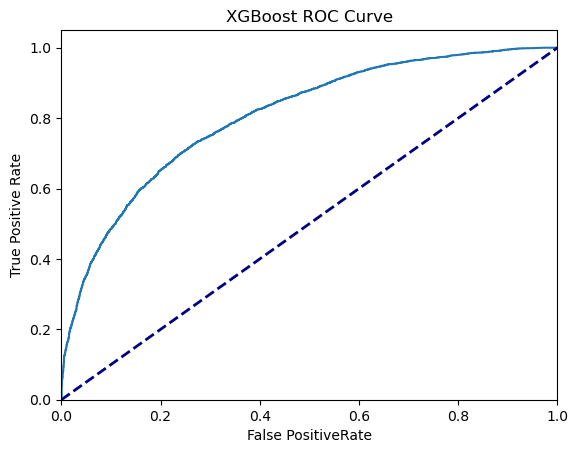

In [11]:
xgb_y_pred = optimal_xgb.predict_proba(X_val)[:, 1]

xgb_fpr, xgb_tpr, xgb_thresholds = roc_curve(y_val, xgb_y_pred)
xgb_auroc = auc(xgb_fpr, xgb_tpr)
print(f"XGBoost AUROC: {xgb_auroc}")

plt.plot(xgb_fpr, xgb_tpr)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False PositiveRate')
plt.ylabel('True Positive Rate')
_ = plt.title('XGBoost ROC Curve')

In [12]:
xgb_predictions = optimal_xgb.predict_proba(test_data)[:, 1]
xgb_predictions

array([0.08070015, 0.40609953, 0.81291753, ..., 0.9296005 , 0.15250692,
       0.1098617 ], dtype=float32)

## Autogluon Model

In [ ]:
predictor = TabularPredictor(
    label='label', 
    path='autogluon_model/', 
    eval_metric='roc_auc'
).fit(ag_train, presets='best_quality', num_gpus=1, time_limit=10800)

autogluon_predictions = predictor.predict_proba(test_data, tuning_data=X_val, as_multiclass=False, transform_features=False)

ag_y_pred = predictor.predict_proba(X_val, as_multiclass=False, transform_features=False)

Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.11.5
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 24.1.0: Thu Oct 10 21:02:45 PDT 2024; root:xnu-11215.41.3~2/RELEASE_ARM64_T8112
CPU Count:          8
Memory Avail:       5.03 GB / 16.00 GB (31.5%)
Disk Space Avail:   48.98 GB / 460.43 GB (10.6%)
Presets specified: ['best_quality']
Setting dynamic_stacking from 'auto' to True. Reason: Enable dynamic_stacking when use_bag_holdout is disabled. (use_bag_holdout=False)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
DyStack is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stacked overfitting and enable or disable stacking as a consequence.
	This is used to identify the optimal `num_stack_levels` value. Copies of AutoGluon will be fit on subsets of the data. Then h

(_ray_fit pid=41842) [1000]	valid_set's binary_logloss: 0.531346


(_dystack pid=41820) 	0.7995	 = Validation score   (roc_auc)
(_dystack pid=41820) 	5.32s	 = Training   runtime
(_dystack pid=41820) 	1.55s	 = Validation runtime
(_dystack pid=41820) Fitting model: LightGBM_BAG_L1 ... Training model for up to 1788.95s of the 2688.80s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=1.15%)
(_dystack pid=41820) 	0.7981	 = Validation score   (roc_auc)
(_dystack pid=41820) 	3.83s	 = Training   runtime
(_dystack pid=41820) 	0.75s	 = Validation runtime
(_dystack pid=41820) Fitting model: RandomForestGini_BAG_L1 ... Training model for up to 1783.55s of the 2683.40s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	0.7865	 = Validation score   (roc_auc)
(_dystack pid=4

(_ray_fit pid=42411) [1000]	valid_set's binary_logloss: 0.5427 [repeated 5x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more options.)
(_ray_fit pid=42408) [2000]	valid_set's binary_logloss: 0.529313 [repeated 9x across cluster]


(_dystack pid=41820) 	0.8009	 = Validation score   (roc_auc)
(_dystack pid=41820) 	15.21s	 = Training   runtime
(_dystack pid=41820) 	5.09s	 = Validation runtime
(_dystack pid=41820) Fitting model: NeuralNetFastAI_r191_BAG_L1 ... Training model for up to 1597.82s of the 2497.67s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=1.74%)
(_ray_fit pid=42459) No improvement since epoch 13: early stopping
(_ray_fit pid=42457) No improvement since epoch 15: early stopping [repeated 3x across cluster]
(_ray_fit pid=42462) No improvement since epoch 21: early stopping [repeated 3x across cluster]
(_dystack pid=41820) 	0.7875	 = Validation score   (roc_auc)
(_dystack pid=41820) 	90.36s	 = Training   runtime
(_dystack pid=41820) 	0.67s	 = Validation runtime
(_dystack pid=41820) Fitting mo

(_ray_fit pid=42900) [1000]	valid_set's binary_logloss: 0.556214 [repeated 2x across cluster]
(_ray_fit pid=42904) [3000]	valid_set's binary_logloss: 0.536739 [repeated 16x across cluster]
(_ray_fit pid=42904) [5000]	valid_set's binary_logloss: 0.534503 [repeated 16x across cluster]
(_ray_fit pid=42904) [7000]	valid_set's binary_logloss: 0.53358 [repeated 14x across cluster]
(_ray_fit pid=42903) [9000]	valid_set's binary_logloss: 0.531864 [repeated 14x across cluster]


(_dystack pid=41820) 	0.7991	 = Validation score   (roc_auc)
(_dystack pid=41820) 	37.22s	 = Training   runtime
(_dystack pid=41820) 	23.19s	 = Validation runtime
(_dystack pid=41820) Fitting model: NeuralNetTorch_r22_BAG_L1 ... Training model for up to 1369.99s of the 2269.85s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=0.98%)
(_dystack pid=41820) 	0.7928	 = Validation score   (roc_auc)
(_dystack pid=41820) 	82.79s	 = Training   runtime
(_dystack pid=41820) 	0.44s	 = Validation runtime
(_dystack pid=41820) Fitting model: XGBoost_r33_BAG_L1 ... Training model for up to 1284.49s of the 2184.35s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting

(_ray_fit pid=43919) [1000]	valid_set's binary_logloss: 0.542341 [repeated 6x across cluster]


(_dystack pid=41820) 	0.7988	 = Validation score   (roc_auc)
(_dystack pid=41820) 	11.17s	 = Training   runtime
(_dystack pid=41820) 	3.08s	 = Validation runtime
(_dystack pid=41820) Fitting model: NeuralNetFastAI_r145_BAG_L1 ... Training model for up to 921.30s of the 1821.15s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=1.71%)
(_ray_fit pid=43967) No improvement since epoch 8: early stopping
(_dystack pid=41820) 	0.794	 = Validation score   (roc_auc)
(_dystack pid=41820) 	65.39s	 = Training   runtime
(_dystack pid=41820) 	0.7s	 = Validation runtime
(_dystack pid=41820) Fitting model: XGBoost_r89_BAG_L1 ... Training model for up to 854.02s of the 1753.87s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dys

(_ray_fit pid=45644) [1000]	valid_set's binary_logloss: 0.530351 [repeated 3x across cluster]


(_dystack pid=41820) 	0.8018	 = Validation score   (roc_auc)
(_dystack pid=41820) 	24.5s	 = Training   runtime
(_dystack pid=41820) 	9.01s	 = Validation runtime
(_dystack pid=41820) Fitting model: NeuralNetFastAI_r143_BAG_L1 ... Training model for up to 247.95s of the 1147.80s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=1.84%)
(_dystack pid=41820) 	0.7899	 = Validation score   (roc_auc)
(_dystack pid=41820) 	21.09s	 = Training   runtime
(_dystack pid=41820) 	0.23s	 = Validation runtime
(_dystack pid=41820) Fitting model: CatBoost_r70_BAG_L1 ... Training model for up to 224.70s of the 1124.55s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting 

(_ray_fit pid=46051) [1000]	valid_set's binary_logloss: 0.559415 [repeated 5x across cluster]
(_ray_fit pid=46056) [2000]	valid_set's binary_logloss: 0.547749 [repeated 8x across cluster]
(_ray_fit pid=46054) [3000]	valid_set's binary_logloss: 0.546347 [repeated 8x across cluster]
(_ray_fit pid=46054) [4000]	valid_set's binary_logloss: 0.544366 [repeated 8x across cluster]
(_ray_fit pid=46056) [5000]	valid_set's binary_logloss: 0.539044 [repeated 8x across cluster]
(_ray_fit pid=46056) [6000]	valid_set's binary_logloss: 0.538366 [repeated 8x across cluster]
(_ray_fit pid=46056) [7000]	valid_set's binary_logloss: 0.538362 [repeated 8x across cluster]
(_ray_fit pid=46056) [8000]	valid_set's binary_logloss: 0.538445 [repeated 8x across cluster]
(_ray_fit pid=46056) [9000]	valid_set's binary_logloss: 0.538918 [repeated 6x across cluster]


(_dystack pid=41820) 	0.8003	 = Validation score   (roc_auc)
(_dystack pid=41820) 	77.8s	 = Training   runtime
(_dystack pid=41820) 	131.55s	 = Validation runtime
(_dystack pid=41820) Fitting model: RandomForest_r39_BAG_L1 ... Training model for up to 64.00s of the 963.86s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	0.7872	 = Validation score   (roc_auc)
(_dystack pid=41820) 	33.49s	 = Training   runtime
(_dystack pid=41820) 	0.75s	 = Validation runtime
(_dystack pid=41820) Fitting model: CatBoost_r167_BAG_L1 ... Training model for up to 29.57s of the 929.42s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=1.69%)
(_dystack pid=41820) 	0.799	 = Validation score   (roc_auc)
(_dystack pid=

(_ray_fit pid=47108) [1000]	valid_set's binary_logloss: 0.520424 [repeated 3x across cluster]


(_dystack pid=41820) 	0.8111	 = Validation score   (roc_auc)
(_dystack pid=41820) 	14.98s	 = Training   runtime
(_dystack pid=41820) 	1.88s	 = Validation runtime
(_dystack pid=41820) Fitting model: NeuralNetFastAI_r191_BAG_L2 ... Training model for up to 685.03s of the 684.96s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=2.83%)
(_ray_fit pid=47173) No improvement since epoch 7: early stopping
(_ray_fit pid=47170) No improvement since epoch 9: early stopping [repeated 4x across cluster]
(_dystack pid=41820) 	0.8096	 = Validation score   (roc_auc)
(_dystack pid=41820) 	76.14s	 = Training   runtime
(_dystack pid=41820) 	0.58s	 = Validation runtime
(_dystack pid=41820) Fitting model: CatBoost_r9_BAG_L2 ... Training model for up to 606.97s of the 606.90s of remaining time.
(_dys

(_ray_fit pid=47522) [1000]	valid_set's binary_logloss: 0.529222


(_dystack pid=41820) 	0.8117	 = Validation score   (roc_auc)
(_dystack pid=41820) 	9.38s	 = Training   runtime
(_dystack pid=41820) 	1.04s	 = Validation runtime
(_dystack pid=41820) Fitting model: NeuralNetTorch_r22_BAG_L2 ... Training model for up to 527.58s of the 527.51s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with ParallelLocalFoldFittingStrategy (8 workers, per: cpus=1, gpus=0, memory=1.51%)
(_dystack pid=41820) 	0.8086	 = Validation score   (roc_auc)
(_dystack pid=41820) 	39.06s	 = Training   runtime
(_dystack pid=41820) 	0.37s	 = Validation runtime
(_dystack pid=41820) Fitting model: XGBoost_r33_BAG_L2 ... Training model for up to 486.79s of the 486.71s of remaining time.
(_dystack pid=41820) Specified total num_gpus: 1, but only 0 are available. Will use 0 instead
(_dystack pid=41820) 	Fitting 8 child models (S1F1 - S1F8) | Fitting with 

In [3]:
predictor = TabularPredictor.load("/Users/jubinchoi/s25_uh_manoa/ics435/hw3/autogluon_model")

In [5]:
predictor.fit_summary()

*** Summary of fit() ***
Estimated performance of each model:
                           model  score_val eval_metric  pred_time_val     fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0            WeightedEnsemble_L3   0.814406     roc_auc     429.615049  4051.000192                0.004608           9.082293            3       True        147
1            WeightedEnsemble_L2   0.813791     roc_auc      80.446353  1114.704292                0.004970           7.957044            2       True         95
2    NeuralNetFastAI_r143_BAG_L2   0.813358     roc_auc     424.038447  3471.814000                0.333837          36.846436            2       True        134
3            LightGBM_r96_BAG_L2   0.813268     roc_auc     425.529227  3447.884948                1.824617          12.917384            2       True        112
4            CatBoost_r86_BAG_L2   0.813166     roc_auc     423.772963  3496.739994                0.068353          61.772430  

{'model_types': {'KNeighborsUnif_BAG_L1': 'StackerEnsembleModel_KNN',
  'KNeighborsDist_BAG_L1': 'StackerEnsembleModel_KNN',
  'LightGBMXT_BAG_L1': 'StackerEnsembleModel_LGB',
  'LightGBM_BAG_L1': 'StackerEnsembleModel_LGB',
  'RandomForestGini_BAG_L1': 'StackerEnsembleModel_RF',
  'RandomForestEntr_BAG_L1': 'StackerEnsembleModel_RF',
  'CatBoost_BAG_L1': 'StackerEnsembleModel_CatBoost',
  'ExtraTreesGini_BAG_L1': 'StackerEnsembleModel_XT',
  'ExtraTreesEntr_BAG_L1': 'StackerEnsembleModel_XT',
  'NeuralNetFastAI_BAG_L1': 'StackerEnsembleModel_NNFastAiTabular',
  'XGBoost_BAG_L1': 'StackerEnsembleModel_XGBoost',
  'NeuralNetTorch_BAG_L1': 'StackerEnsembleModel_TabularNeuralNetTorch',
  'LightGBMLarge_BAG_L1': 'StackerEnsembleModel_LGB',
  'CatBoost_r177_BAG_L1': 'StackerEnsembleModel_CatBoost',
  'NeuralNetTorch_r79_BAG_L1': 'StackerEnsembleModel_TabularNeuralNetTorch',
  'LightGBM_r131_BAG_L1': 'StackerEnsembleModel_LGB',
  'NeuralNetFastAI_r191_BAG_L1': 'StackerEnsembleModel_NNFastAiT

In [ ]:
ag_y_pred = predictor.predict_proba(X_val, as_multiclass=False, transform_features=False)

In [ ]:
autogluon_predictions = predictor.predict_proba(test_data)[:, 1]

### Submission File

In [16]:
idx = np.arange(0, 50000).reshape(-1, 1)
lgbm_predictions = lgbm_predictions.reshape(-1, 1)
xgb_predictions = xgb_predictions.reshape(-1, 1)
autogluon_predictions = autogluon_predictions.reshape(-1, 1)

lgbm_output = np.hstack((ids, lgbm_predictions))
xgb_output = np.hstack((ids, xgb_predictions))
autogluon_output np.hstack((ids, autogluon_predictions))

np.savetxt(fname='xgboost_submission_optuna.csv', X=lgbm_output, header='Id,Predicted', delimiter=',', comments='')
np.savetxt(fname='lgbm_submission_optuna.csv', X=xgb_output, header='Id,Predicted', delimiter=',', comments='')
np.savetxt(fname='autogluon_submission.csv', X=autogluon_predictions, header='Id,Predicted', delimiter=',', comments='')
